<font size=6>Predicting Future Sales</font>  
<font size=5>An analysis of features distribution</font>

This notebook analyses the distribution of the features created in the kernel https://www.kaggle.com/sylvainfriot/an-economic-oriented-feature-engineering  
I do a lot of graphic tries and explorations.  

I notice two important facts :  
- a large imbalance in the target (item_count_month) with a lot of zero values. As a result, most features have a lot of 0 values or -1 values, according to the way they were calculated.  
- a lot of outliers (mostly in the high values) for a lot of features.  
  
Those two facts give some weird distribution curves.  
I also look at the distribution without the values (0 or -1) implied by the target zero values.  
**The main conclusion of this exploration is that models based on the normality asumption should be avoid to treat those data.**

# Notebook setup

In [1]:
import pandas as pd
import numpy as np
import scipy.stats as st
import statsmodels.stats as sm
import statsmodels.stats.api as sma
import statsmodels.api as sa
import matplotlib.pyplot as plt
import seaborn as sns

**Graphs set-up**

In [2]:
# changes in matplotlib default parameters
def mydefault_plt_parameters(figsize=(12, 8), mult_param=1.0):
    plt.rcParams['figure.figsize'] = figsize
    plt.rcParams['font.size'] = np.around(18 * mult_param)
    plt.rcParams['axes.titlepad'] = np.around(20 * mult_param)
    plt.rcParams['axes.labelpad'] = np.around(15 * mult_param)
    plt.rcParams['figure.titleweight'] = 'bold'
    plt.rcParams['axes.titleweight'] = 'bold'
    plt.rcParams['legend.framealpha'] = 1
    plt.rcParams['legend.facecolor'] = (0.95,0.95,0.95)
    plt.rcParams['legend.edgecolor'] = (0.95,0.95,0.95)
    plt.rcParams['savefig.orientation'] = 'landscape'
    plt.rcParams['savefig.dpi'] = 300
    plt.rcParams['savefig.bbox'] = 'tight'

In [3]:
def set_sns_colors(is_mono=False, color_palette=None,
                   ncolors=None, desat=None):
    if color_palette is None:
        if is_mono:
            sns.set_palette(sns.light_palette("navy"))
        else:
            sns.set_palette("Set2")
    else:
        sns.set_palette(color_palette, ncolors, desat)
    return sns.color_palette()

In [4]:
sns.set_style("whitegrid")
list_colors = set_sns_colors()
mydefault_plt_parameters()

In [5]:
def test_normality(x, feature_name, alpha=0.05):
    x = np.array(x)
    if len(x) < 5000:
        my_index = ["Shapiro-Wilk", "Jarque-Bera", "Anderson-Darling"]
    else:
        my_index = ["Kolmogorov-Smirnov", "Jarque-Bera", "Anderson-Darling"]
    df_normality = pd.DataFrame(index=my_index, columns=["p_value"])
    if len(x) < 5000:
        df_normality.iloc[0, 0] = np.round(st.shapiro(x)[1], 4)
    else:
        forced_mean = x.mean()
        forced_var = x.var(ddof=1)
        df_normality.iloc[0, 0] = np.round(
            st.kstest(x, cdf="norm",
                      args=(forced_mean, np.sqrt(forced_var)))[1],
            4)
    df_normality.iloc[1, 0] = np.round(sm.stattools.jarque_bera(x)[1], 4)
    df_normality.iloc[2, 0] = np.round(sm.diagnostic.normal_ad(x)[1], 4)
    df_normality["Accept H0"] = [v >= alpha for v in df_normality.p_value]
    print("{} - Normality Test - Risk level = {:.0%}".format(
        feature_name, alpha))
    print("    H0 : Feature distribution is normal")
    print("    H1 : Feature distribution is not normal")
    print(df_normality.T)

In [6]:
def graph_boxplot(feature, feature_name, units, my_ax):
    bplot = my_ax.boxplot(feature, showmeans=True, widths=0.7,
                          vert=False, patch_artist=True)
    bplot['boxes'][0].set_facecolor(list_colors[0])
    bplot['boxes'][0].set_alpha(1)
    bplot['medians'][0].set_color('black')
    bplot['fliers'][0].set_markeredgecolor('grey')
    bplot['fliers'][0].set_markerfacecolor(list_colors[0])
    bplot['fliers'][0].set_alpha(1)
    bplot['means'][0].set_marker('o')
    bplot['means'][0].set_markeredgecolor('black')
    bplot['means'][0].set_markerfacecolor('black')
    my_ax.set_yticklabels([feature_name])
    my_ax.set_xlabel(units)

In [7]:
def graph_henry_plot(feature, my_ax):
    sa.qqplot(feature, fit=True, markeredgecolor=list_colors[0],
              markerfacecolor=list_colors[0], alpha=0.5, ax=my_ax)
    ymin, ymax = my_ax.get_ylim()
    xmin, xmax = my_ax.get_xlim()
    data_min = min(xmin, ymin)
    data_max = max(xmax, ymax)
    my_ax.plot([data_min, data_max], [data_min, data_max],
               color=list_colors[1])
    my_ax.set_xlabel("Theorical quantiles of the Normal law")
    my_ax.set_ylabel("Observed quantiles of the feature")
    my_ax.autoscale(enable=True, axis='both', tight=True)

In [8]:
def graph_normal_distribution(feature, feature_name, my_ax, y_max=None,
                              legend_loc="upper right", bins=20):
    my_ax.hist(feature, bins=bins, label=feature_name, density=True,
               color=list_colors[0], alpha=1)
    x_theo = np.linspace(feature.min(), feature.max(), 100)
    data_mean = feature.mean()
    data_std = feature.std(ddof=1)
    my_ax.plot(x_theo, st.norm.pdf(x_theo, loc=data_mean, scale=data_std),
               label="Normal law", color=list_colors[1], linewidth=1.5)
    my_ax.set_xlabel(feature_name)
    ymin, ymax = my_ax.get_ylim()
    if y_max is not None:
        ymax = y_max
    my_ax.set_ylim([ymin, ymax])
    my_ax.set_ylabel("Distribution (%)")
    my_ax.legend(loc=legend_loc)

In [9]:
def graph_quant_feature(x, feature_name, units, figsize=(12,9),
                        ymax=None, bins=20, legend_loc="upper right"):
    title = "{} : Feature distribution".format(feature_name)
    fig = plt.figure(figsize=figsize)
    fig.subplots_adjust(wspace=0.25, hspace=0.25)
    gs = plt.GridSpec(3, 2, figure=fig)
    fig.suptitle(title, y=1.05)
    ax = []
    ax.append(fig.add_subplot(gs[0, :]))
    ax.append(fig.add_subplot(gs[1:, 0]))
    ax.append(fig.add_subplot(gs[1:, 1]))
    
    graph_boxplot(feature, feature_name, units, ax[0])
    ax[0].set_title("Boxplot", fontweight='regular')
    
    graph_henry_plot(feature, ax[1])
    ax[1].set_title("Henry plot", fontweight='regular')
    
    graph_normal_distribution(feature, feature_name, ax[2], y_max=ymax,
                              bins=bins, legend_loc=legend_loc)
    ax[2].set_title("Distribution plot", fontweight='regular')
    fig.tight_layout()
    plt.show()

In [10]:
def graph_categ_feature(feature, feature_name, index_as_int=False,
                        ticklabels_rotation=None, labelsize=None,
                        force_pie=False, force_startangle=None,
                        figsize=(12,9)):
    distrib_values = feature.value_counts()
    if index_as_int:
        labels = distrib_values.index.values.astype(int)
    else:
        labels = distrib_values.index
    if force_startangle is None:
        force_startangle = 90
    if ticklabels_rotation is None:
        ticklabels_rotation = 30
    if (ticklabels_rotation > 0) & (ticklabels_rotation < 90):
        ha="right"
    else:
        ha="center"
    if labelsize is None:
        labelsize = 15
    title = "{} : Feature distribution".format(feature_name)
    fig = plt.figure(figsize=figsize)
    ax = plt.axes()
    fig.suptitle(title)
    if (len(distrib_values) <= 5) | force_pie:
        ax.pie(distrib_values, labels=labels, autopct="%1.1f%%",
               startangle=force_startangle, counterclock=False)
    else:
        sns.barplot(x=labels, y=distrib_values, ax=ax)
        ax.tick_params(axis="x", rotation=ticklabels_rotation,
                       labelsize=labelsize)
        ax.set_xlabel("")
        ax.set_ylabel("Number of occurrences")
    plt.show()

**Utility functions**

In [11]:
def my_signed_sqrt(x_serie):
    return np.sqrt(np.abs(x_serie)) * \
        np.sign(x_serie)

In [12]:
def downcast_df_int8(df):
    float_cols = [col for col in df
                  if df[col].dtype == "float64"]
    int_cols = [c for c in df
                if df[c].dtype in ["int64", "int32"]]
    if "item_id" in df.columns:
        int_cols.remove("item_id")
        df["item_id"] = df.item_id.astype(np.int16)
    if "shopitem_id" in df.columns:
        int_cols.remove("shopitem_id")
        df["shopitem_id"] = df.shopitem_id.astype(np.int32)
    df[float_cols] = df[float_cols].astype(np.float32)
    df[int_cols] = df[int_cols].astype(np.int8)
    return df

# 1. Descriptive data

In [13]:
data = pd.read_csv("../input/an-economic-oriented-feature-engineering/alldata_descriptive.csv")
data = downcast_df_int8(data)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9976247 entries, 0 to 9976246
Data columns (total 44 columns):
 #   Column                                    Dtype  
---  ------                                    -----  
 0   date_block_num                            int8   
 1   shop_id                                   int8   
 2   item_id                                   int16  
 3   item_cnt_month                            float32
 4   item_firstmonth_sell                      int8   
 5   item_seniority                            int8   
 6   shop_firstmonth_sell                      int8   
 7   shop_seniority                            int8   
 8   shopitem_firstmonth_sell                  int8   
 9   shopitem_seniority                        int8   
 10  item_lastmonth_sell                       int8   
 11  item_stopped                              int8   
 12  shop_lastmonth_sell                       int8   
 13  shop_stopped                              int8   
 14  sh

<a id="11"></a>
## 1.1. Item Count Month

In [14]:
feature = data.item_cnt_month
feature_name = "Item Count Month"
feature.describe()

count    9.976247e+06
mean     3.657815e-01
std      3.552374e+00
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.253000e+03
Name: item_cnt_month, dtype: float64

In [15]:
test_normality(feature, feature_name)

Item Count Month - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


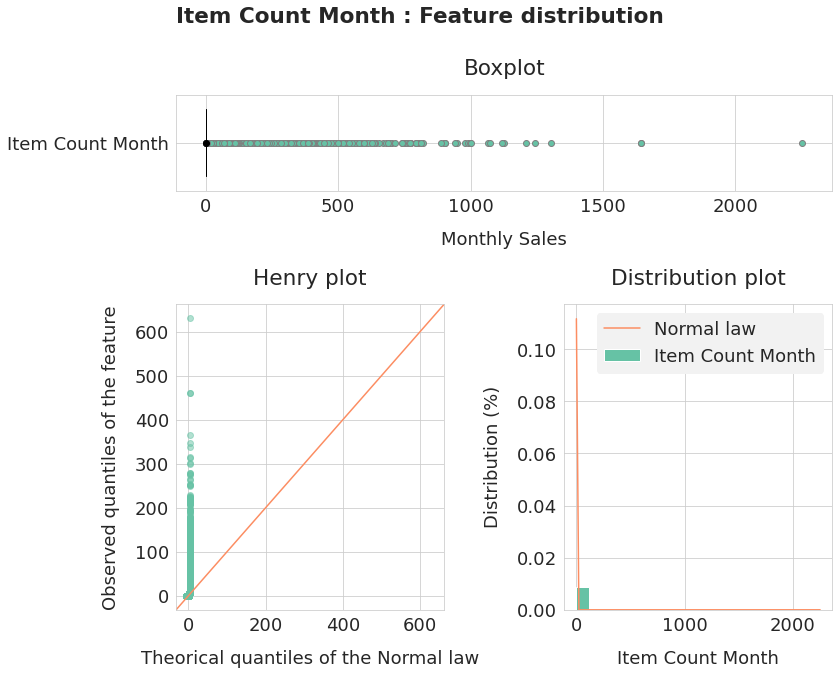

In [16]:
graph_quant_feature(feature, feature_name, "Monthly Sales")

More than 75% of monthly sales are equal to 0. This is due to the items that are no more sold, or that are sold from time to time by a shop.  
I focus on sold items, that is on positive item_cnt_month.  
More generally, the distribution of several features is disturbed by this imbalance. Values of sales equal to 0 or values of changes or relative sales equal to -1 should be put apart as soon as a mean number of sales is implied.  
In the same order of idea, there are often some large outliers in high values. I tend to put apart the wider ones to focus on the distribution of the majority of data.

In [17]:
feature = data[(data.item_cnt_month > 0) &
               (data.item_cnt_month <= 20)].item_cnt_month
feature_name = "Item Count Month"
feature.describe()

count    1.593850e+06
mean     1.898289e+00
std      2.095474e+00
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      2.000000e+00
max      2.000000e+01
Name: item_cnt_month, dtype: float64

In [18]:
test_normality(feature, feature_name)

Item Count Month - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


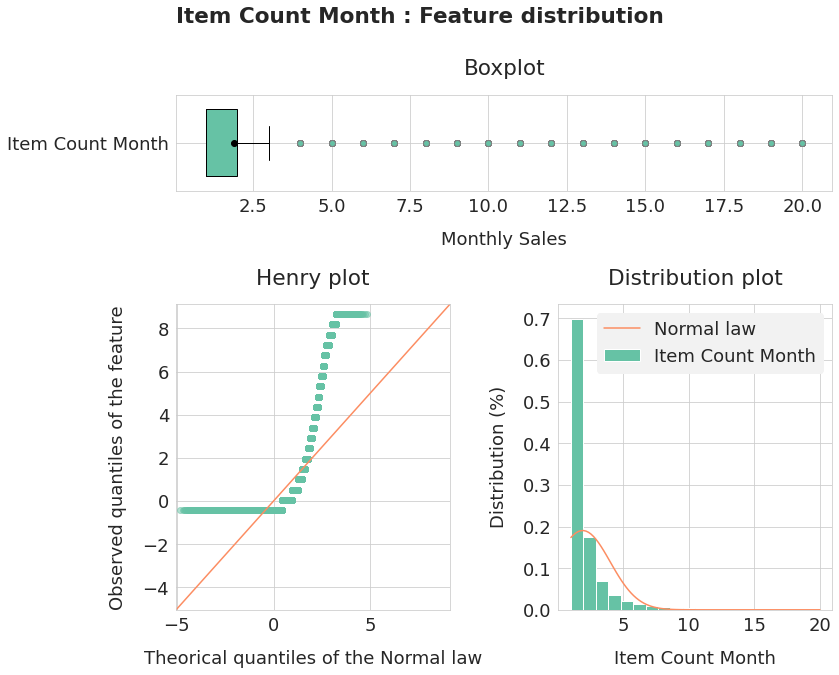

In [19]:
graph_quant_feature(feature, feature_name, "Monthly Sales")

When an item is sold, more than half of monthly counts are only one item sold by a given shop.  
Only one or two units are sold by a shop in a given month for most items.  
Let's clip the max number of sold items to 20 to get a better idea of distribution in small numbers of sales.

In [20]:
feature = np.log(
    data[(data.item_cnt_month > 0) &
         (data.item_cnt_month <= 20)].item_cnt_month)
feature_name = "Log of Item Count Month"
feature.describe()

count    1.593850e+06
mean     3.749883e-01
std      6.098428e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      6.931472e-01
max      2.995732e+00
Name: item_cnt_month, dtype: float64

In [21]:
test_normality(feature, feature_name)

Log of Item Count Month - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


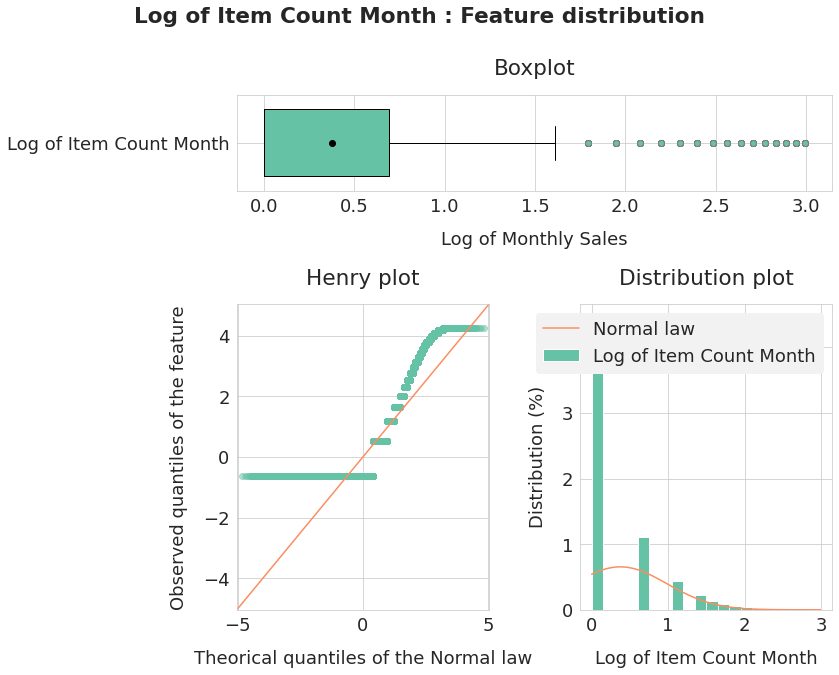

In [22]:
graph_quant_feature(feature, feature_name, "Log of Monthly Sales")

The distribution of the log of positive item counts is still far from normality. It has a strong positive skewness. But it is more interesting than the core positive item count because the number and the range of outliers are lower.

In [23]:
feature = data.item_cnt_month.clip(0, 20)
feature_name = "Clipped Item Cnt Month"
feature.describe()

count    9.976247e+06
mean     3.262618e-01
std      1.232508e+00
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.000000e+01
Name: item_cnt_month, dtype: float64

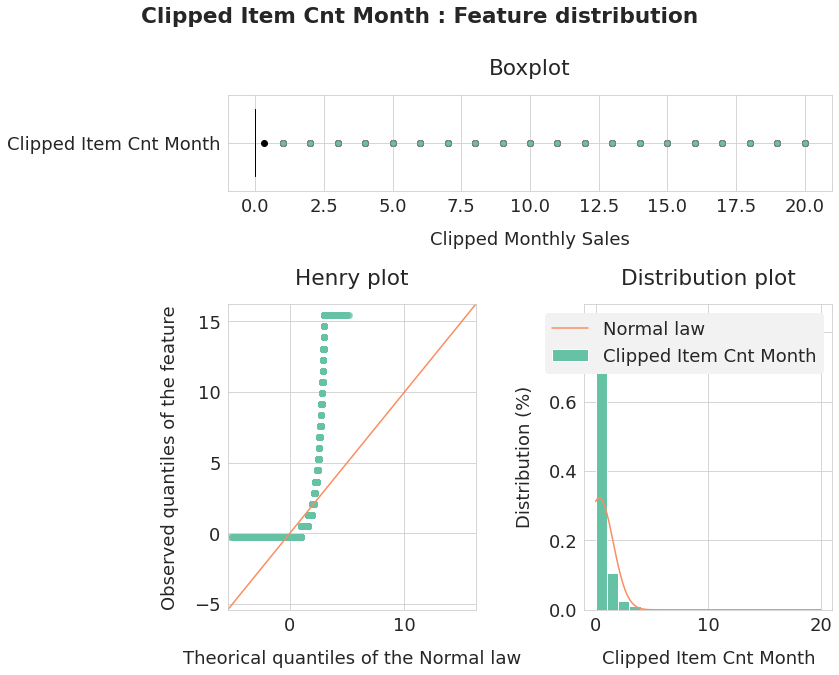

In [24]:
graph_quant_feature(feature, feature_name, "Clipped Monthly Sales")

In [25]:
feature = data[data.item_cnt_month > 0].\
    item_cnt_month.clip(0, 20)
feature_name = "Clipped Item Cnt Month"
feature.describe()

count    1.605314e+06
mean     2.027559e+00
std      2.574792e+00
min      1.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      2.000000e+00
max      2.000000e+01
Name: item_cnt_month, dtype: float64

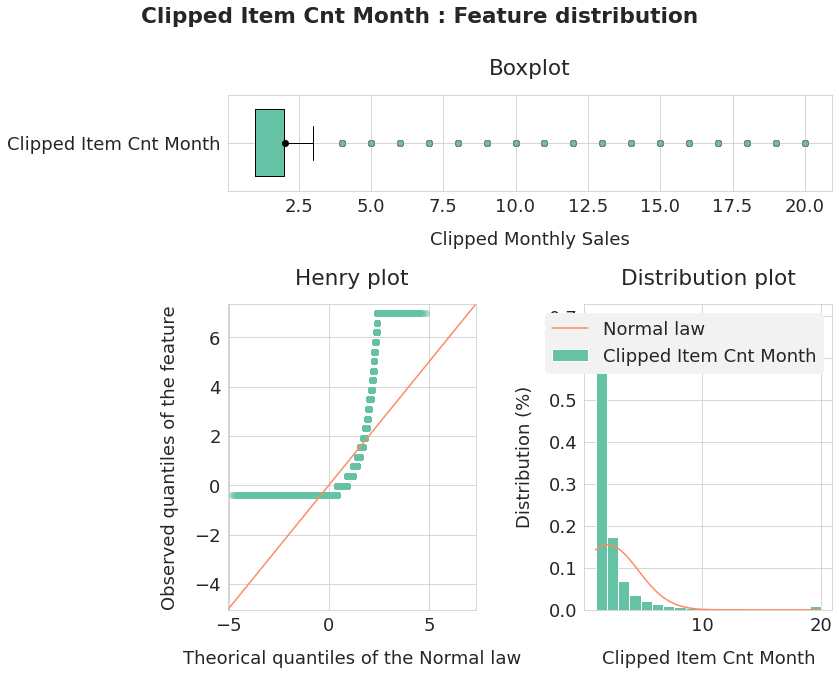

In [26]:
graph_quant_feature(feature, feature_name, "Clipped Monthly Sales")

There's a huge positive skewness. There are almost no items with 10 to 19 sales. The most interesting items are those with 20 sales (remember that we've clipped the max number of sales to 20 for this graph), because they will probably count for a big part of the income of the company.

Conclusions to keep in mind when doing predictions :
- most monthly sales are equal to 0 ;
- when there are sales, most of them are equal to 1 or 2 ;
- there are a significant number of items with 20 or more sales by month and shop. They may be the most important items for the company from an economical point of view.

In [27]:
feature = np.log(feature)
feature_name = "Log of Clipped Values"
feature.describe()

count    1.605314e+06
mean     3.938113e-01
std      6.476937e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      6.931472e-01
max      2.995732e+00
Name: item_cnt_month, dtype: float64

In [28]:
test_normality(feature, feature_name)

Log of Clipped Values - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


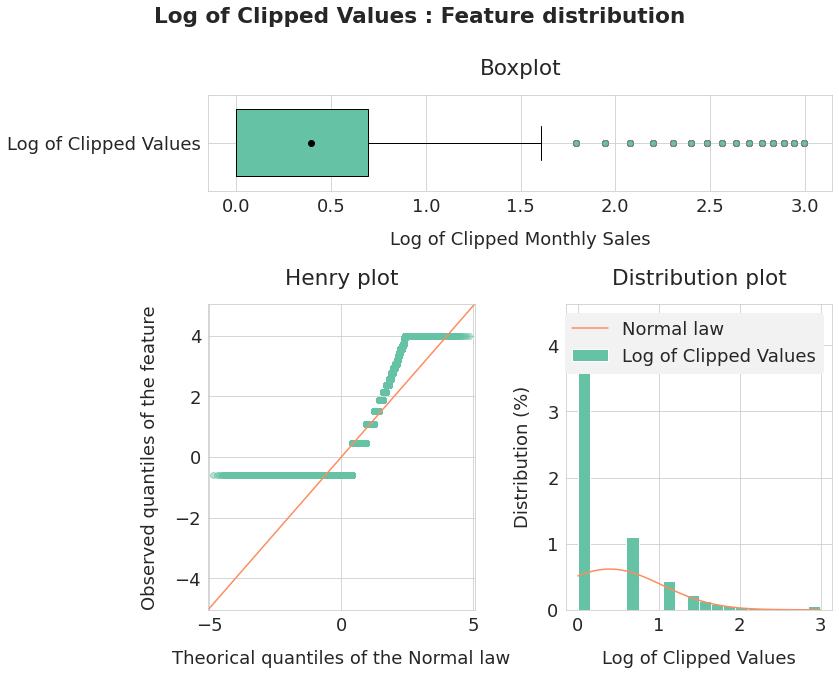

In [29]:
graph_quant_feature(feature, feature_name, "Log of Clipped Monthly Sales")

The distribution of the log of positive clipped item counts is the closer to the normal law.

## 1.2. Seniority features

I don't analyse the features related to the month of the first or last sale. I prefer to look at the seniority of items or at the time elapsed since last sale.

In [30]:
feature = data.item_seniority
feature_name = "Item seniority"
feature.describe()

count    9.976247e+06
mean     1.554977e+01
std      9.255847e+00
min      0.000000e+00
25%      8.000000e+00
50%      1.500000e+01
75%      2.300000e+01
max      3.400000e+01
Name: item_seniority, dtype: float64

In [31]:
test_normality(feature, feature_name)

Item seniority - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


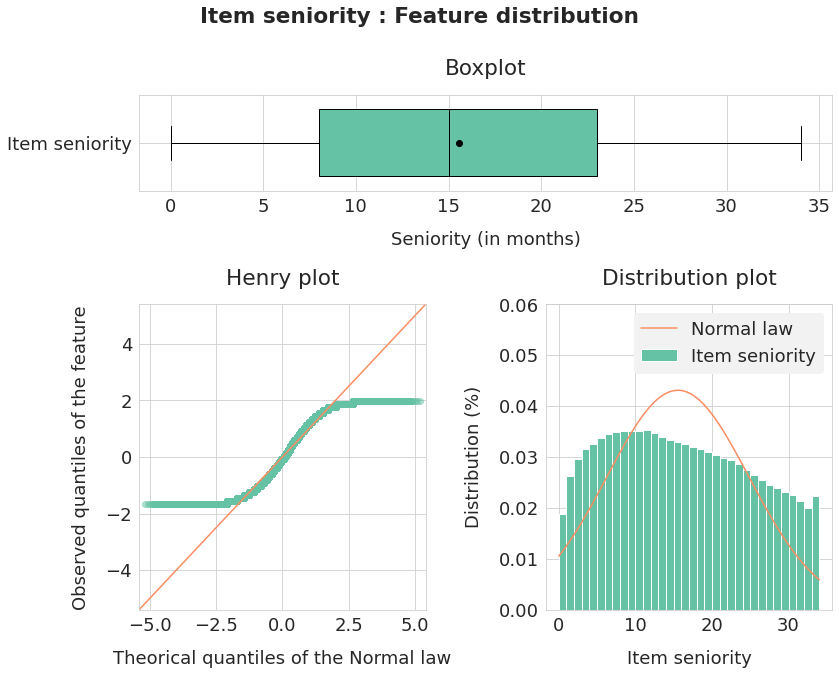

In [32]:
graph_quant_feature(feature, feature_name, "Seniority (in months)",
                    bins=34, ymax=0.06)

In [33]:
feature = data.shop_seniority
feature_name = "Shop seniority"
feature.describe()

count    9.976247e+06
mean     1.958009e+01
std      9.134465e+00
min      0.000000e+00
25%      1.200000e+01
50%      2.000000e+01
75%      2.700000e+01
max      3.400000e+01
Name: shop_seniority, dtype: float64

In [34]:
test_normality(feature, feature_name)

Shop seniority - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


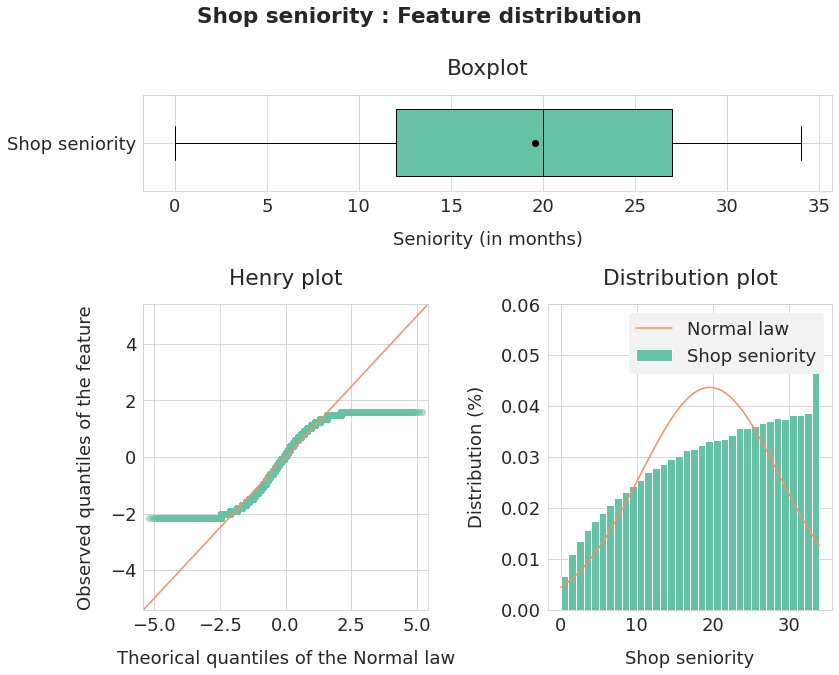

In [35]:
graph_quant_feature(feature, feature_name, "Seniority (in months)",
                    bins=34, ymax=0.06)

In [36]:
feature = data.shopitem_seniority
feature_name = "Shop/Item seniority"
feature.describe()

count    9.976247e+06
mean     1.315641e+01
std      9.050158e+00
min      0.000000e+00
25%      5.000000e+00
50%      1.200000e+01
75%      2.000000e+01
max      3.400000e+01
Name: shopitem_seniority, dtype: float64

In [37]:
test_normality(feature, feature_name)

Shop/Item seniority - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


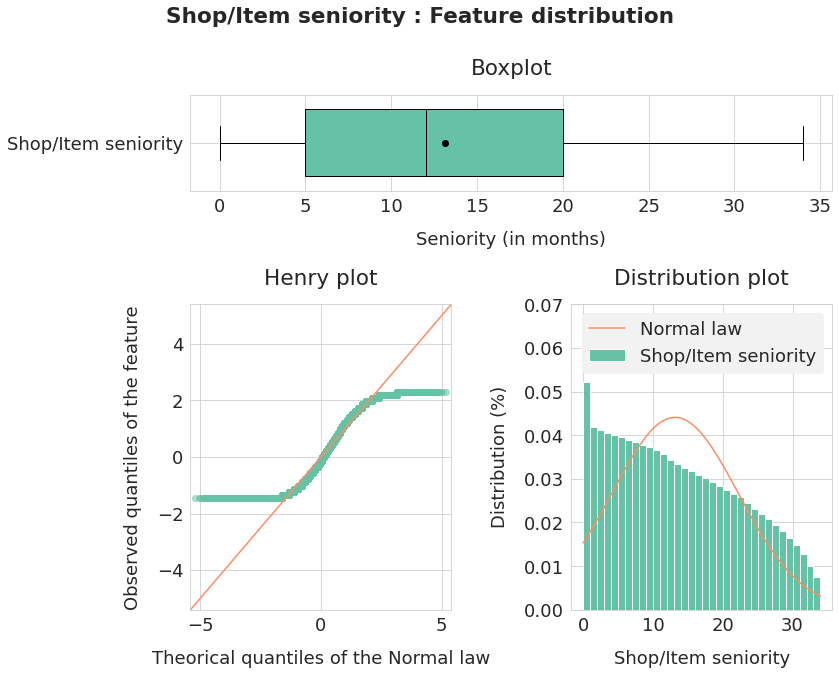

In [38]:
graph_quant_feature(feature, feature_name, "Seniority (in months)",
                    bins=34, ymax=0.07)

Only small shops have been stopped. So the curve of seniority is not hurted when a shop stops.  
The curve of items seniority is explained by the fact that data is only for the active shop/item pairs. The shape of the curve is due to the fact that an item is not sold by all shops at the month of its launch.

## 1.3. "Stopped" features

In [39]:
feature = data.item_stopped
feature_name = "Item stopped"
feature.describe()

count    9.976247e+06
mean    -4.725224e+00
std      1.139581e+01
min     -3.400000e+01
25%     -1.200000e+01
50%     -5.000000e+00
75%      2.000000e+00
max      3.200000e+01
Name: item_stopped, dtype: float64

In [40]:
test_normality(feature, feature_name)

Item stopped - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


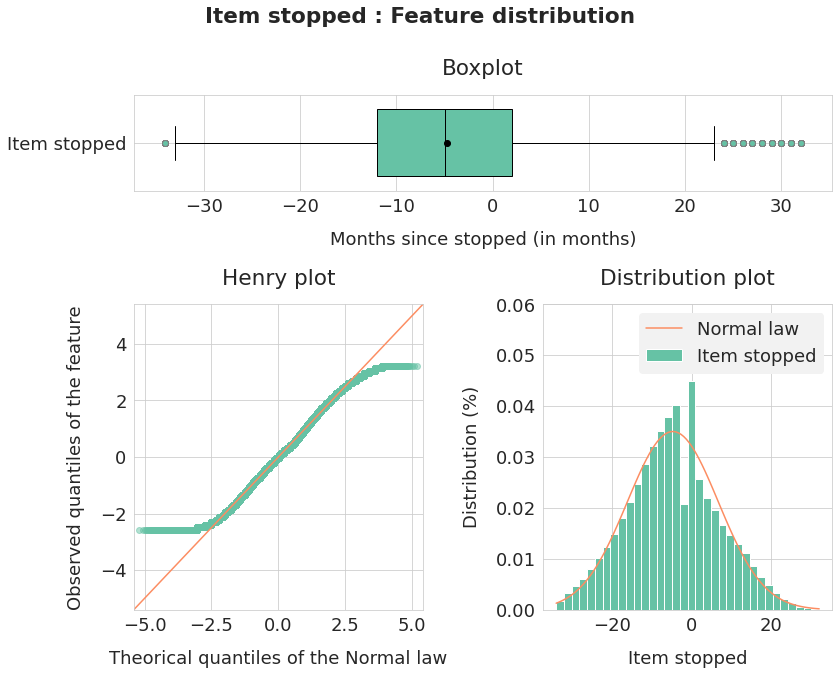

In [41]:
graph_quant_feature(feature, feature_name,
                    "Months since stopped (in months)",
                    bins=34, ymax=0.06)

In [42]:
feature = data.shop_stopped
feature_name = "Shop stopped"
feature.describe()

count    9.976247e+06
mean    -1.208519e+01
std      1.028032e+01
min     -3.400000e+01
25%     -2.000000e+01
50%     -1.100000e+01
75%     -4.000000e+00
max      3.000000e+01
Name: shop_stopped, dtype: float64

In [43]:
test_normality(feature, feature_name)

Shop stopped - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


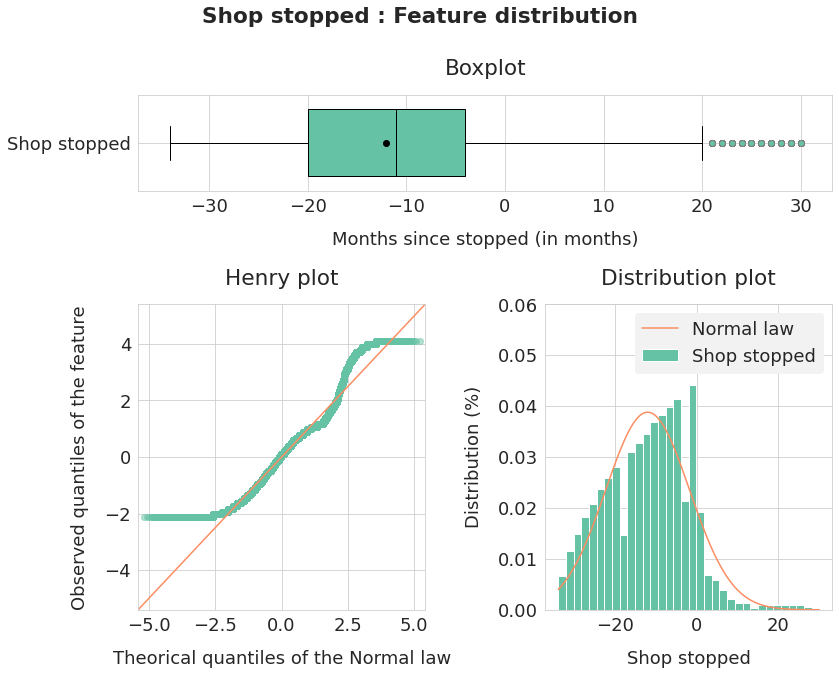

In [44]:
graph_quant_feature(feature, feature_name,
                    "Months since stopped (in months)",
                    bins=34, ymax=0.06)

In [45]:
feature = data.shopitem_stopped
feature_name = "Shop/Item stopped"
feature.describe()

count    9.976247e+06
mean     4.452525e+00
std      1.190618e+01
min     -3.400000e+01
25%     -3.000000e+00
50%      4.000000e+00
75%      1.300000e+01
max      3.300000e+01
Name: shopitem_stopped, dtype: float64

In [46]:
test_normality(feature, feature_name)

Shop/Item stopped - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


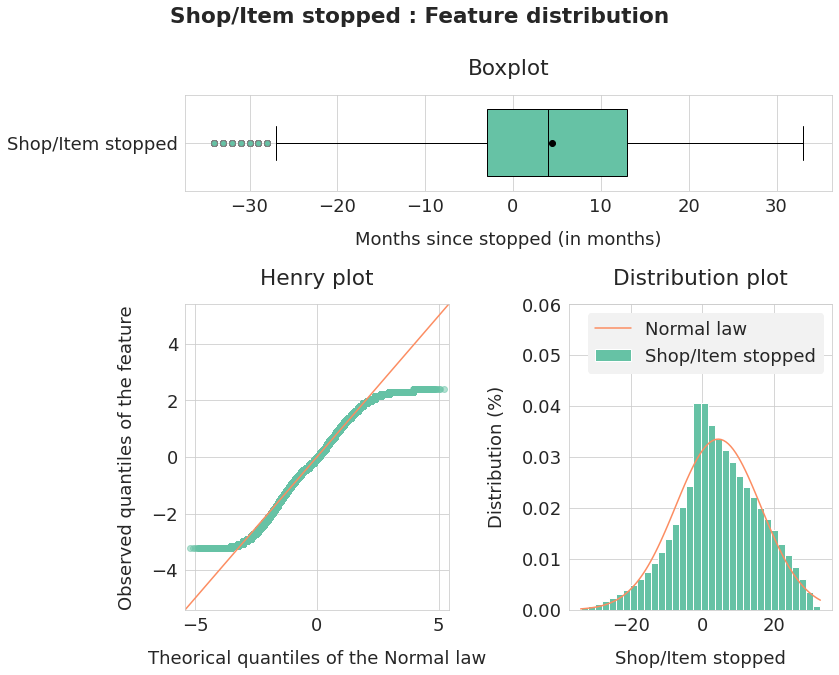

In [47]:
graph_quant_feature(feature, feature_name,
                    "Months since stopped (in months)",
                    bins=34, ymax=0.06)

Statistical test reject the normal distribution. However, the plots show that the distribution of the number of months since the last sale for a given item ou a given pair shop/item is close of normality.  
It reflects that items stop selling on a regular basis. There is a regular turnover in sold items.

## 1.4. Item seniority when first sell occurs

In [48]:
feature = data.shop_avg_itemseniority_firstsell
feature_name = "Shop Avg Itemseniority"
feature.describe()

count    9.976247e+06
mean     2.680379e+00
std      1.177233e+00
min      1.513623e-03
25%      2.231506e+00
50%      2.600669e+00
75%      3.038053e+00
max      1.426953e+01
Name: shop_avg_itemseniority_firstsell, dtype: float64

In [49]:
test_normality(feature, feature_name)

Shop Avg Itemseniority - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


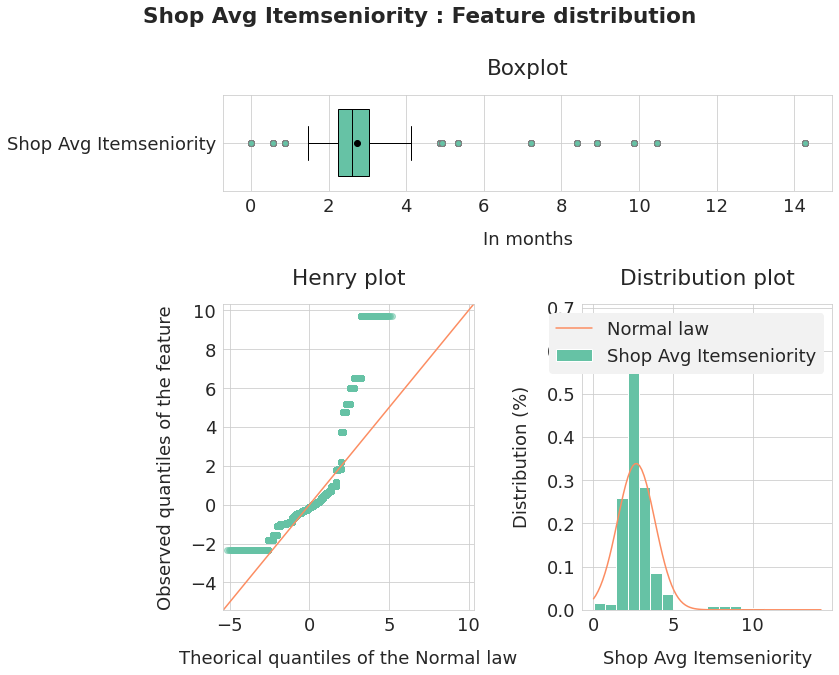

In [50]:
graph_quant_feature(feature, feature_name,
                    "In months")

In [51]:
feature = np.log(data.shop_avg_itemseniority_firstsell)
feature_name = "Log of Shop Avg Itemseniority"
feature.describe()

count    9.976247e+06
mean     9.196438e-01
std      5.986807e-01
min     -6.493249e+00
25%      8.026767e-01
50%      9.557687e-01
75%      1.111217e+00
max      2.658127e+00
Name: shop_avg_itemseniority_firstsell, dtype: float64

In [52]:
test_normality(feature, feature_name)

Log of Shop Avg Itemseniority - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


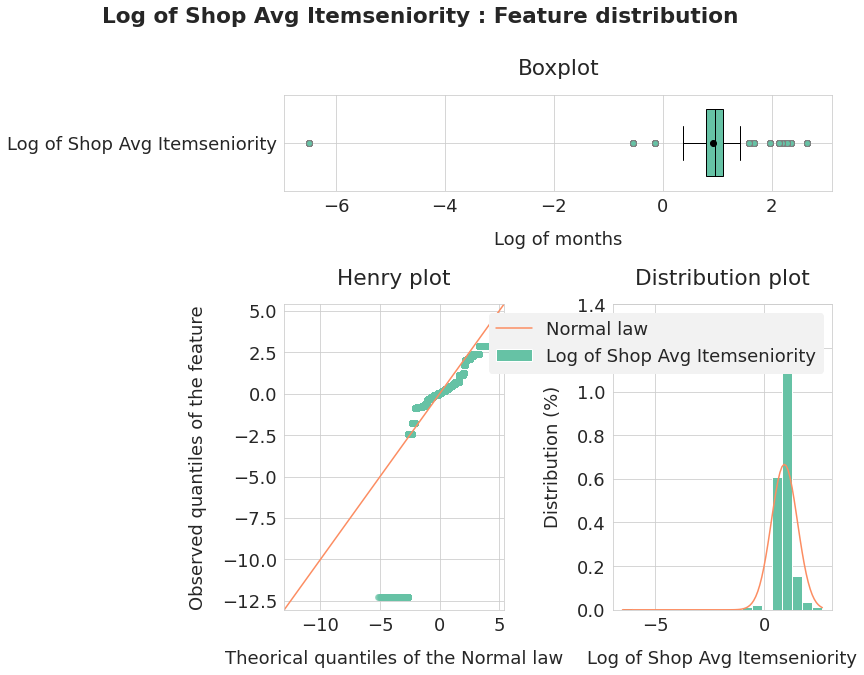

In [53]:
graph_quant_feature(feature, feature_name,
                    "Log of months", ymax=1.4)

In [54]:
feature = data.shop_min_itemseniority_firstsell
feature_name = "Shop Min Itemseniority"
feature.describe()

count    9976247.0
mean           0.0
std            0.0
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            0.0
Name: shop_min_itemseniority_firstsell, dtype: float64

In [55]:
feature = data.shop_max_itemseniority_firstsell
feature_name = "Shop Max Itemseniority"
feature.describe()

count    9.976247e+06
mean     3.091721e+01
std      5.640356e+00
min      1.000000e+00
25%      3.200000e+01
50%      3.300000e+01
75%      3.300000e+01
max      3.300000e+01
Name: shop_max_itemseniority_firstsell, dtype: float64

In [56]:
test_normality(feature, feature_name)

Shop Max Itemseniority - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


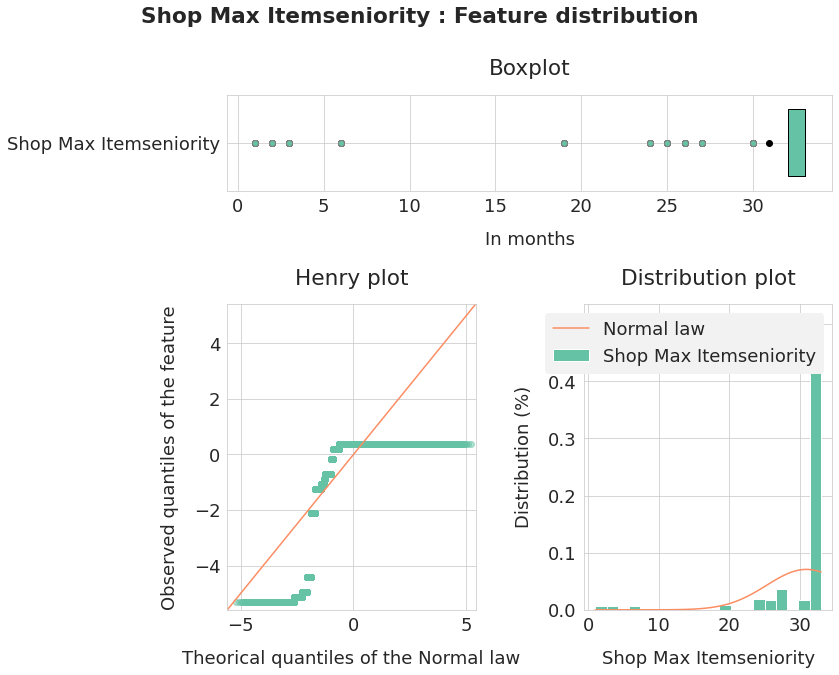

In [57]:
graph_quant_feature(feature, feature_name,
                    "In months")

The most interesting feature is the average. It is the closest to normal distribution. Using its log, we obtain a distribution really close to normality, except for its min value.  
The min and max features are not interesting to analyse.  
Min value : all shops sell at least one item the first month it is sold (I should say month zero).  
Max value : most shops never sell an existing item. This is due to the fact that some shops don't sell some categories.

In [58]:
feature = data.category_avg_itemseniority_firstsell
feature_name = "Cat Avg Itemseniority"
feature.describe()

count    9.976247e+06
mean     2.865934e+00
std      9.947070e-01
min      0.000000e+00
25%      2.303889e+00
50%      2.463009e+00
75%      3.272064e+00
max      6.592233e+00
Name: category_avg_itemseniority_firstsell, dtype: float64

In [59]:
test_normality(feature, feature_name)

Cat Avg Itemseniority - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


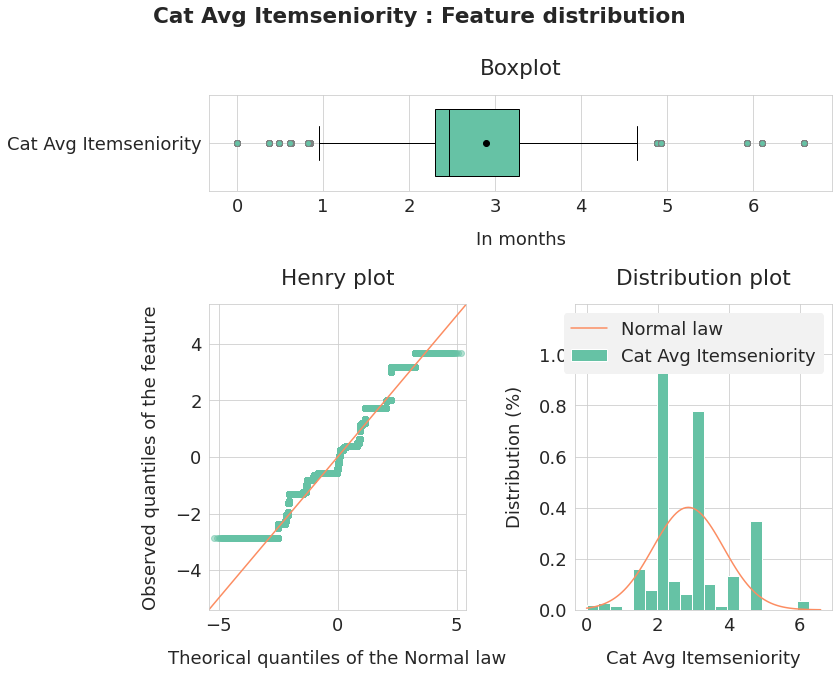

In [60]:
graph_quant_feature(feature, feature_name,
                    "In months")

In [61]:
feature = data.category_min_itemseniority_firstsell
feature_name = "Cat Min Itemseniority"
feature.describe()

count    9976247.0
mean           0.0
std            0.0
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            0.0
Name: category_min_itemseniority_firstsell, dtype: float64

In [62]:
feature = data.category_max_itemseniority_firstsell
feature_name = "Cat Max Itemseniority"
feature.describe()

count    9.976247e+06
mean     3.206303e+01
std      3.787515e+00
min      0.000000e+00
25%      3.300000e+01
50%      3.300000e+01
75%      3.300000e+01
max      3.300000e+01
Name: category_max_itemseniority_firstsell, dtype: float64

In [63]:
test_normality(feature, feature_name)

Cat Max Itemseniority - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


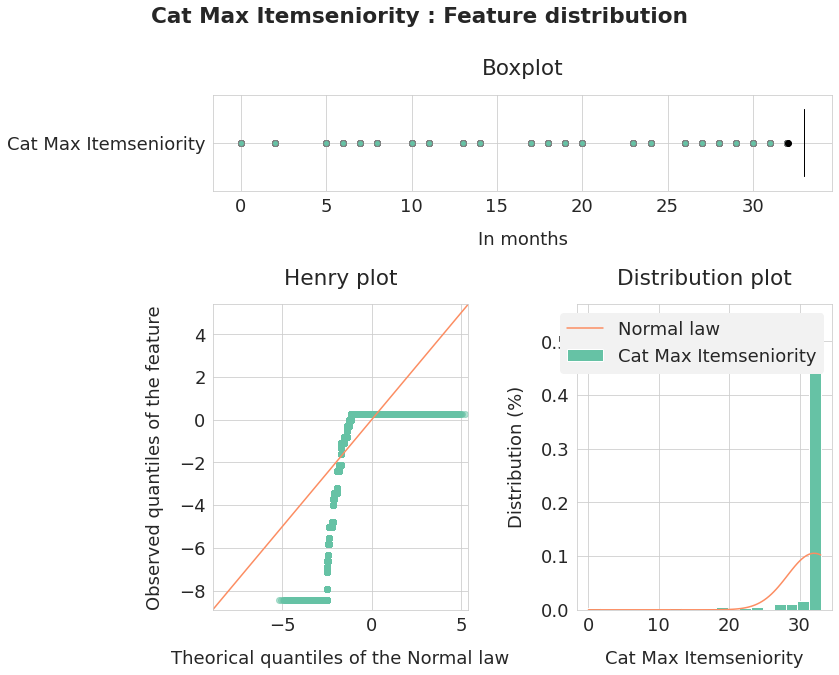

In [64]:
graph_quant_feature(feature, feature_name,
                    "In months")

Again, the most interesting feature is the average one.

In [65]:
feature = data.maincategory_avg_itemseniority_firstsell
feature_name = "MainCat Avg Itemseniority"
feature.describe()

count    9.976247e+06
mean     3.083347e+00
std      6.198791e-01
min      0.000000e+00
25%      3.065361e+00
50%      3.065361e+00
75%      3.078194e+00
max      6.592233e+00
Name: maincategory_avg_itemseniority_firstsell, dtype: float64

In [66]:
test_normality(feature, feature_name)

MainCat Avg Itemseniority - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


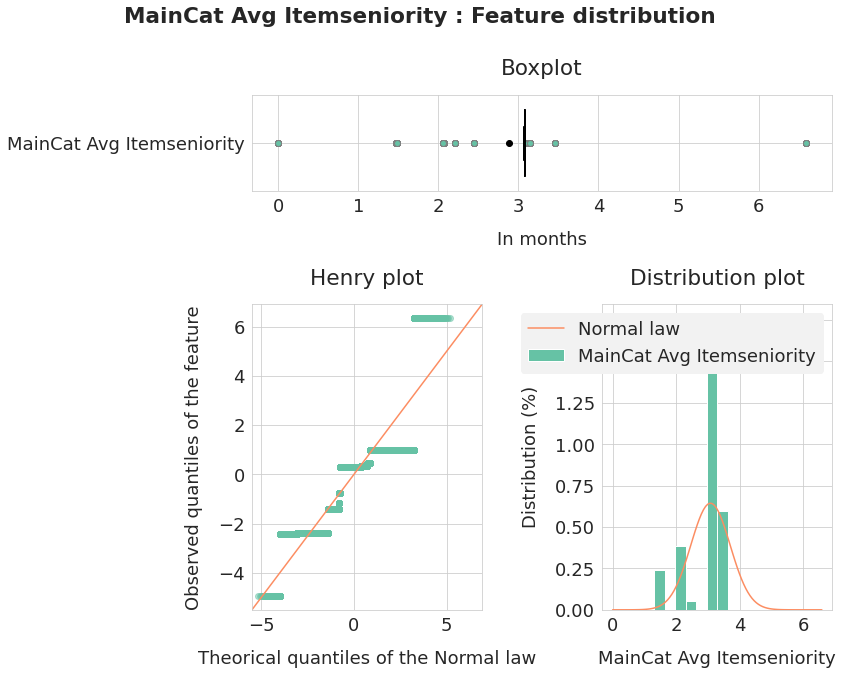

In [67]:
graph_quant_feature(feature, feature_name,
                    "In months")

In [68]:
feature = data.maincategory_min_itemseniority_firstsell
feature_name = "MainCat Min Itemseniority"
feature.describe()

count    9976247.0
mean           0.0
std            0.0
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            0.0
Name: maincategory_min_itemseniority_firstsell, dtype: float64

In [69]:
feature = data.maincategory_max_itemseniority_firstsell
feature_name = "MainCat Max Itemseniority"
feature.describe()

count    9.976247e+06
mean     3.299883e+01
std      1.968506e-01
min      0.000000e+00
25%      3.300000e+01
50%      3.300000e+01
75%      3.300000e+01
max      3.300000e+01
Name: maincategory_max_itemseniority_firstsell, dtype: float64

In [70]:
test_normality(feature, feature_name)

/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


MainCat Max Itemseniority - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


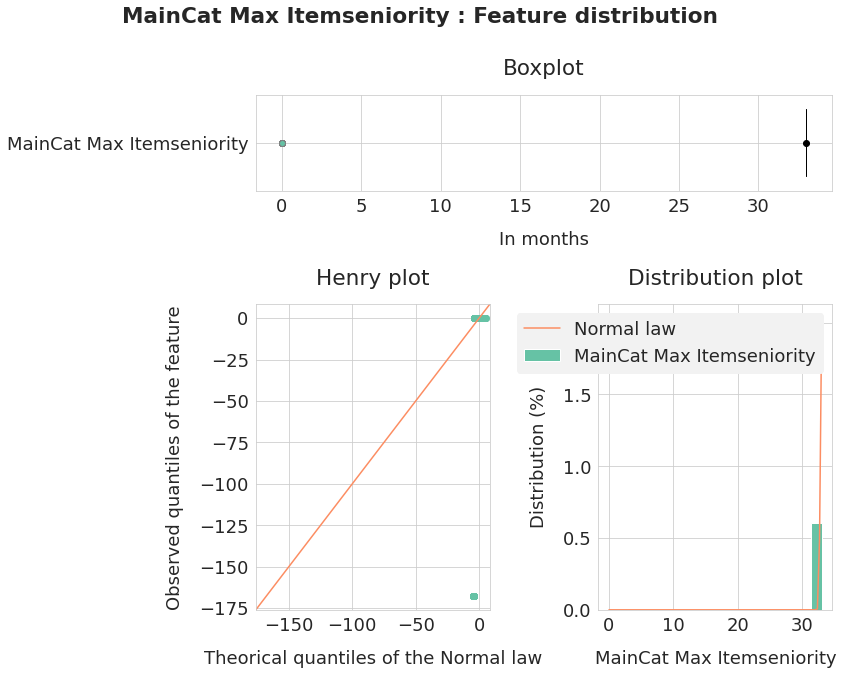

In [71]:
graph_quant_feature(feature, feature_name,
                    "In months")

One more time, the only feature of interest seems to be the average value by main category.  
The distribution by main category is a bit weird because values from Q1 to Q3 are almost the same. I prefer the shape of the distribution by category.

## 1.5. Date features

In [72]:
feature = data.month
feature_name = "Month"
feature.describe()

count    9.976247e+06
mean     6.601501e+00
std      3.292148e+00
min      1.000000e+00
25%      4.000000e+00
50%      7.000000e+00
75%      9.000000e+00
max      1.200000e+01
Name: month, dtype: float64

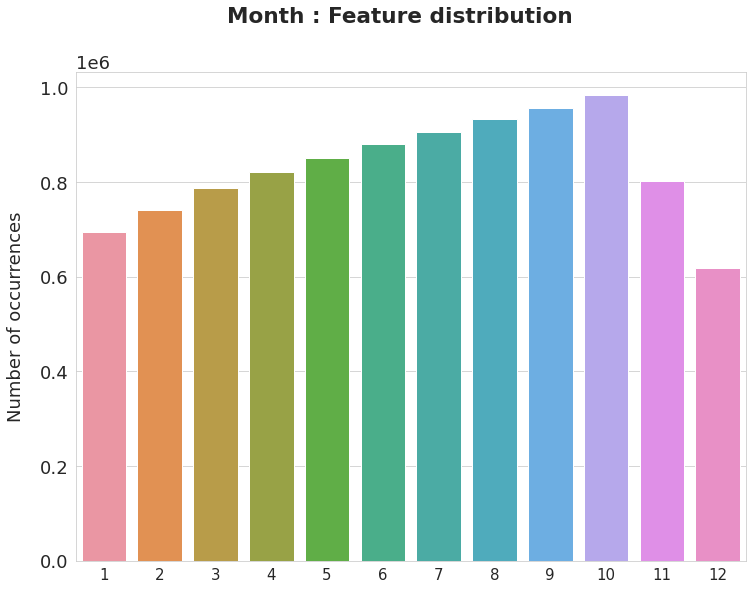

In [73]:
graph_categ_feature(feature, feature_name, index_as_int=True,
                   ticklabels_rotation=0)

We have less occurrences in months 11 and 12 because we have one year less in those two months.  
The number of occurrences increases month after month. This is logical as we keep stopped items with a sale number of 0.

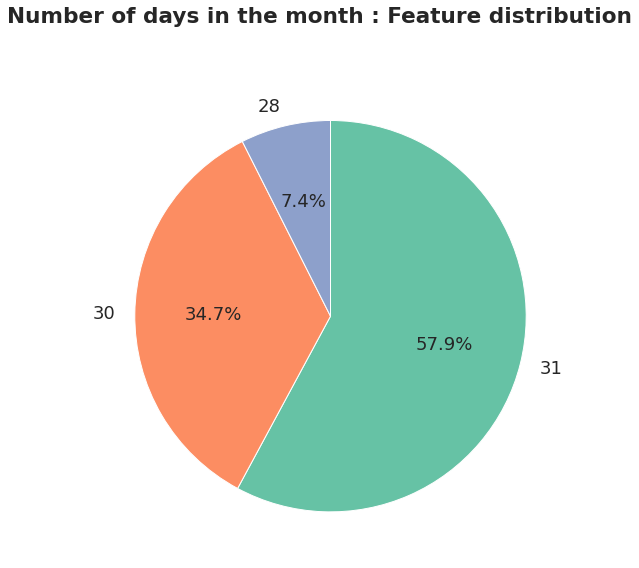

In [74]:
feature = data.nb_days
feature_name = "Number of days in the month"
graph_categ_feature(feature, feature_name, index_as_int=True,
                   ticklabels_rotation=0)

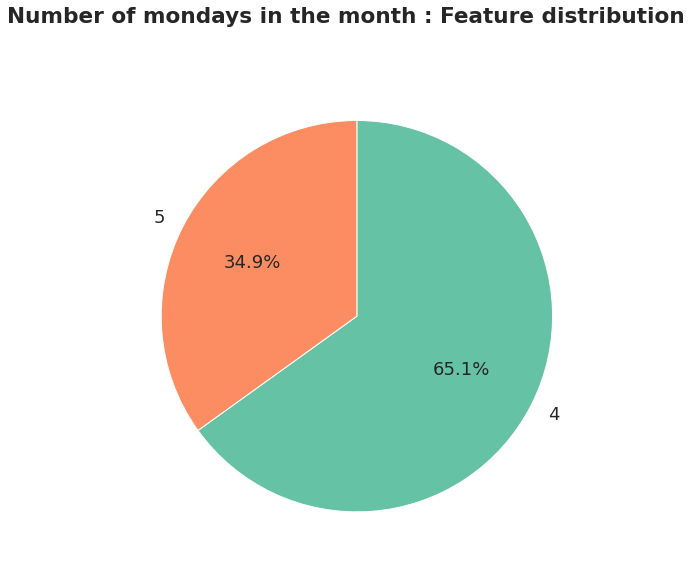

In [75]:
feature = data.nb_mondays
feature_name = "Number of mondays in the month"
graph_categ_feature(feature, feature_name, index_as_int=True,
                   ticklabels_rotation=0)

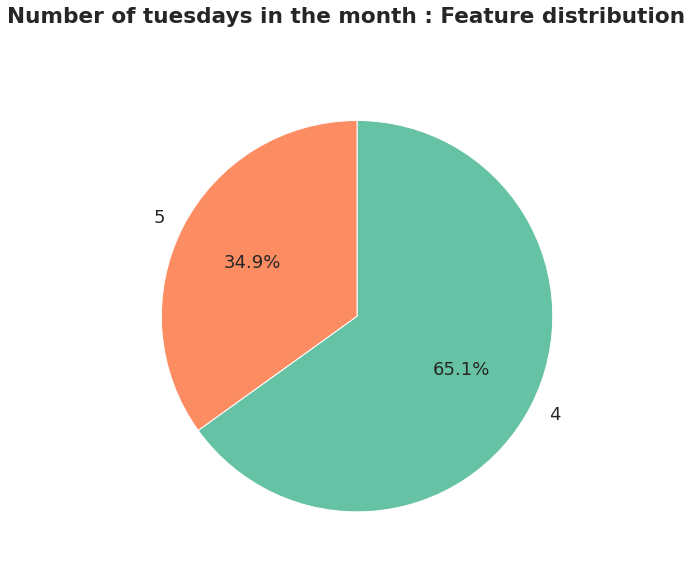

In [76]:
feature = data.nb_mondays
feature_name = "Number of tuesdays in the month"
graph_categ_feature(feature, feature_name, index_as_int=True,
                   ticklabels_rotation=0)

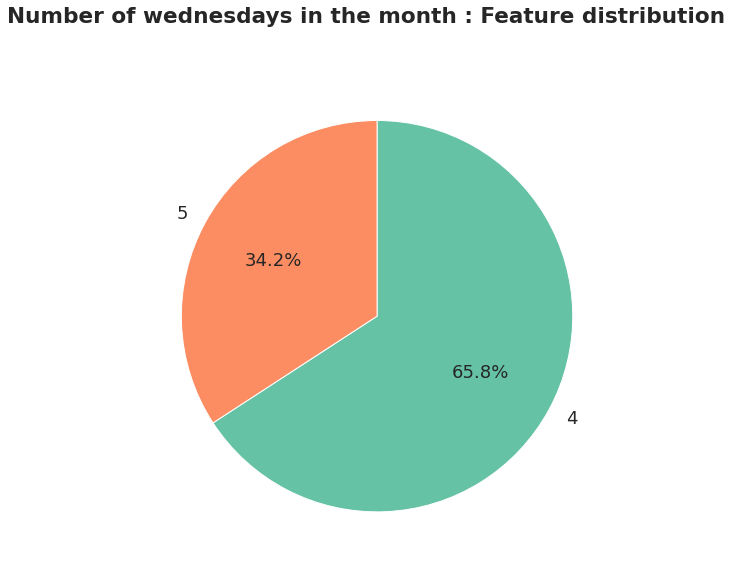

In [77]:
feature = data.nb_wednesdays
feature_name = "Number of wednesdays in the month"
graph_categ_feature(feature, feature_name, index_as_int=True,
                   ticklabels_rotation=0)

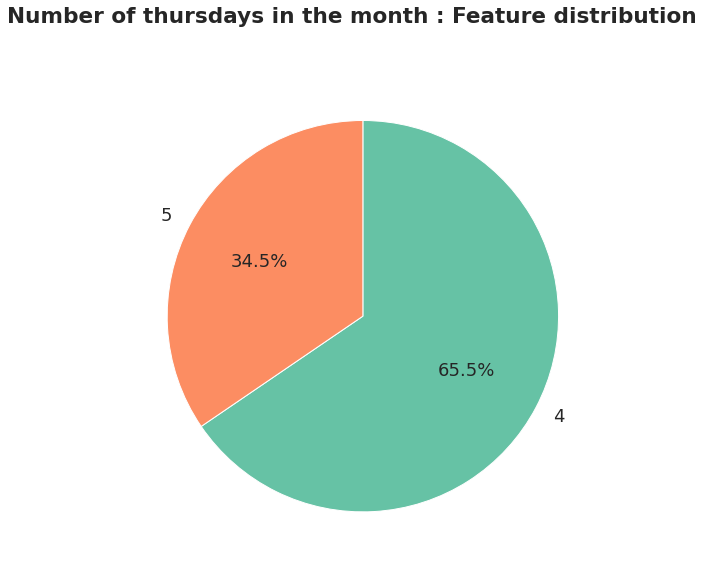

In [78]:
feature = data.nb_thursdays
feature_name = "Number of thursdays in the month"
graph_categ_feature(feature, feature_name, index_as_int=True,
                   ticklabels_rotation=0)

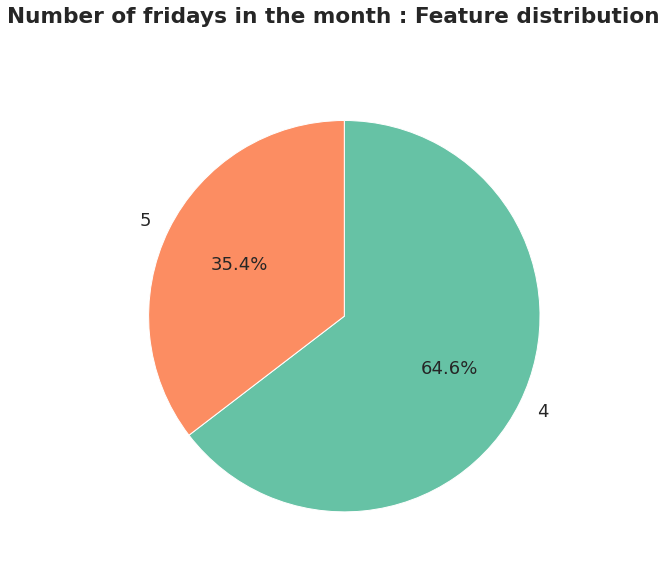

In [79]:
feature = data.nb_fridays
feature_name = "Number of fridays in the month"
graph_categ_feature(feature, feature_name, index_as_int=True,
                   ticklabels_rotation=0)

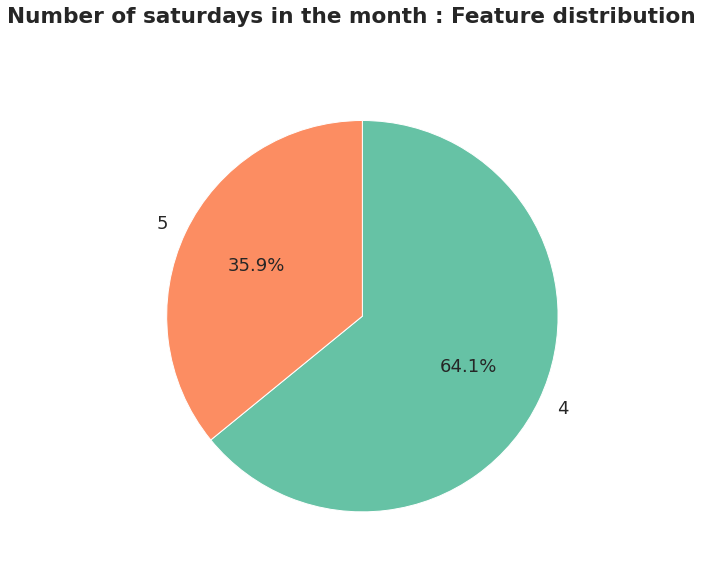

In [80]:
feature = data.nb_saturdays
feature_name = "Number of saturdays in the month"

graph_categ_feature(feature, feature_name, index_as_int=True,
                   ticklabels_rotation=0)

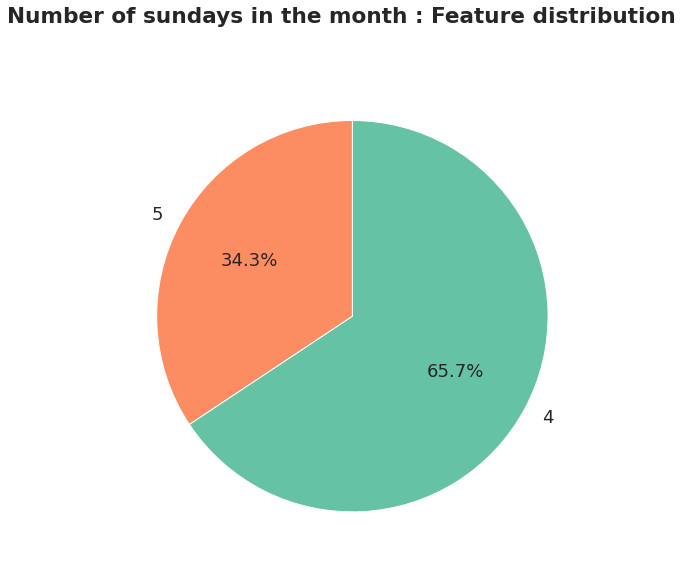

In [81]:
feature = data.nb_sundays
feature_name = "Number of sundays in the month"
graph_categ_feature(feature, feature_name, index_as_int=True,
                   ticklabels_rotation=0)

Nothing special about the number of days in a month.

## 1.6. Categorical features

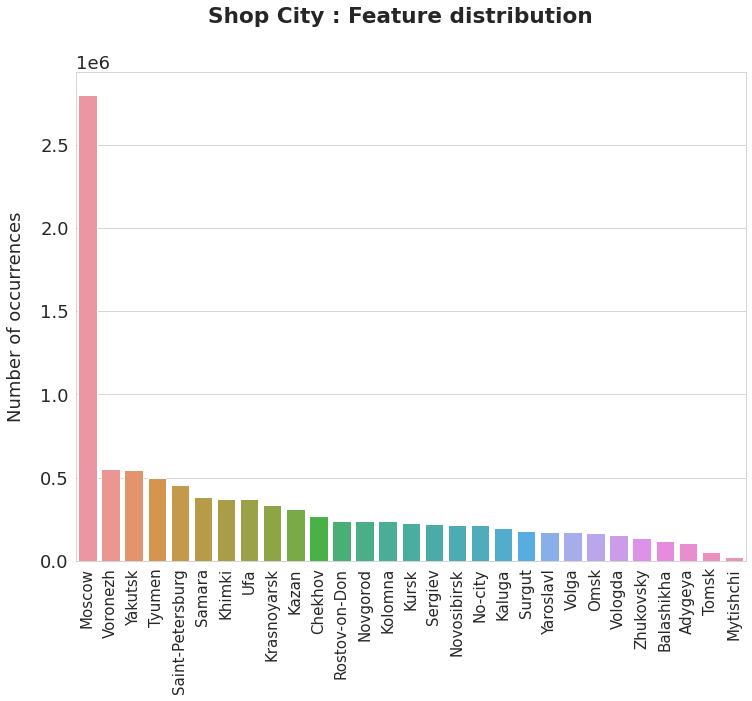

In [82]:
feature = data.shop_city
feature_name = "Shop City"
graph_categ_feature(feature, feature_name,
                   ticklabels_rotation=90)

A large part of sales occur in Moscow, where the company has several stores.

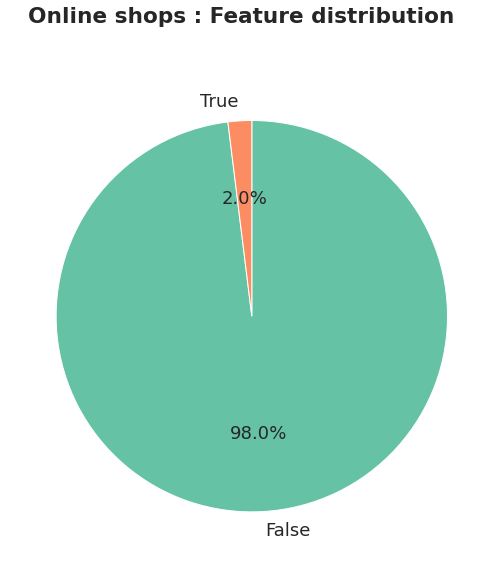

In [83]:
feature = data.shop_isonline
feature_name = "Online shops"
graph_categ_feature(feature, feature_name)

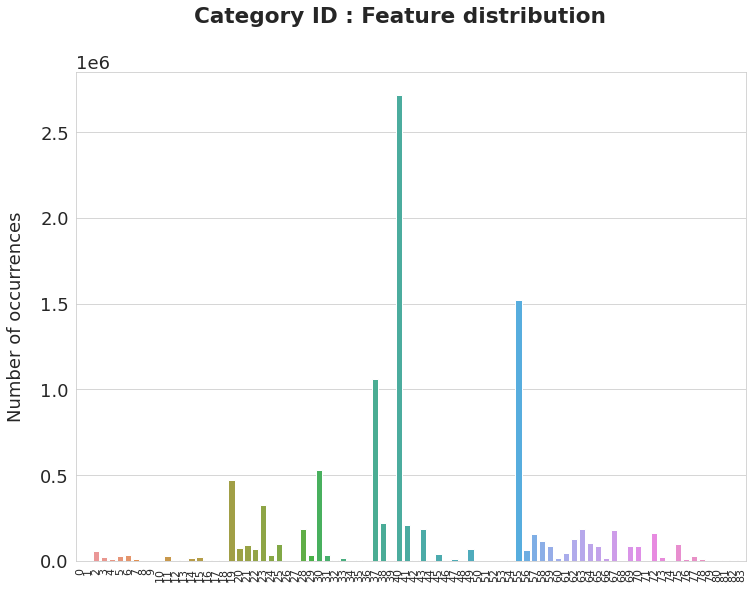

In [84]:
feature = data.item_category_id
feature_name = "Category ID"
graph_categ_feature(feature, feature_name,
                   ticklabels_rotation=90,
                   labelsize=11)

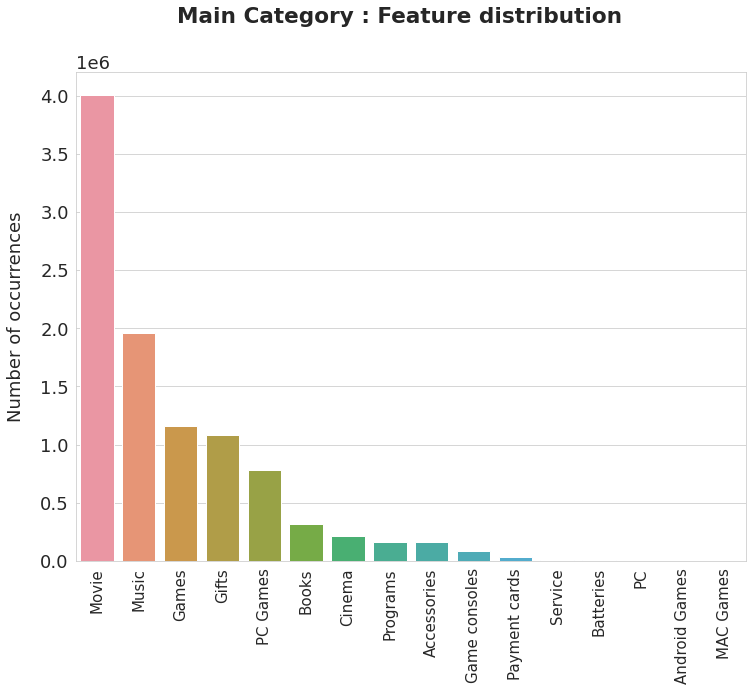

In [85]:
feature = data.main_category
feature_name = "Main Category"
graph_categ_feature(feature, feature_name,
                   ticklabels_rotation=90)

The sales between categories are unbalanced. One or two categories concentrate the sales within a given main category.

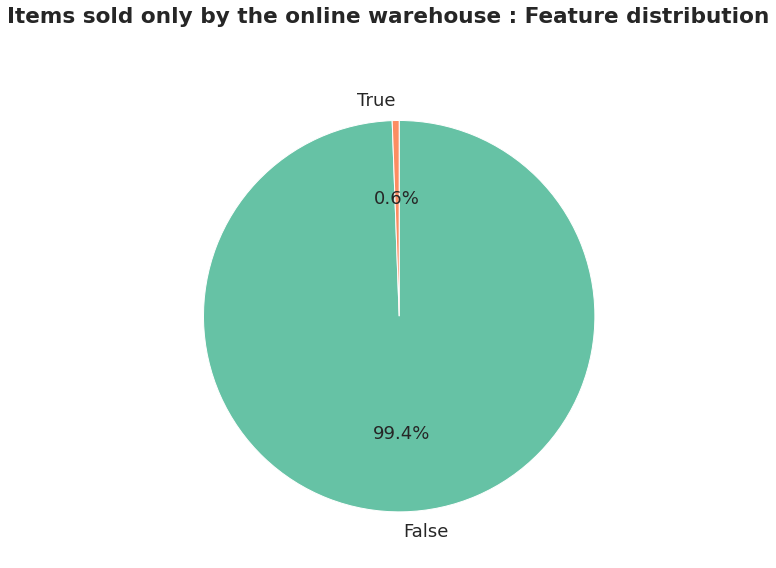

In [86]:
feature = data.category_online
feature_name = "Items sold only by the online warehouse"
graph_categ_feature(feature, feature_name)

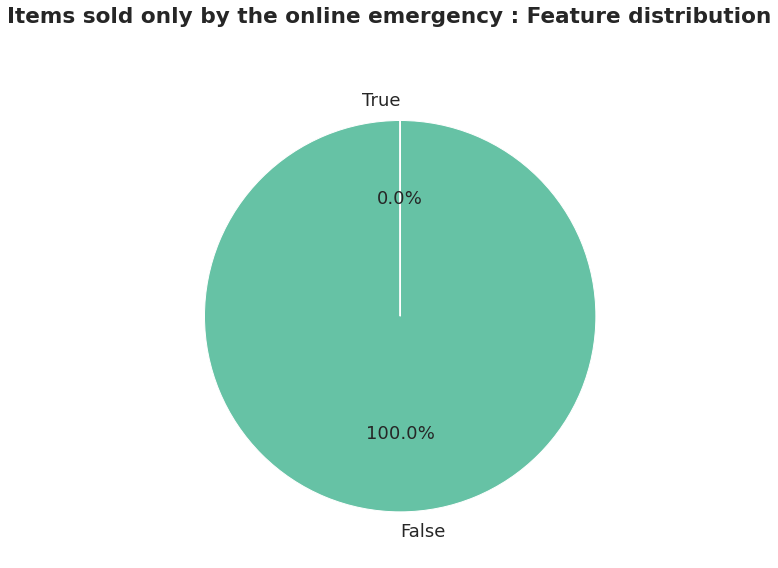

In [87]:
feature = data.category_emergency
feature_name = "Items sold only by the online emergency"
graph_categ_feature(feature, feature_name)

Online stores don't account for a lot of sales.

I keep numeric features of interest to run a PCA analysis with other features.

In [88]:
desc_data = data[["date_block_num", "shop_id", "item_id",
                  "item_cnt_month", "item_seniority", "shop_seniority",
                  "shopitem_seniority", "item_stopped", "shopitem_stopped",
                  "shop_avg_itemseniority_firstsell",
                  "category_avg_itemseniority_firstsell",
                  "maincategory_avg_itemseniority_firstsell"]].copy()
desc_data["clipped_item_cnt_month"] = desc_data.item_cnt_month.clip(0, 20)

# 2. Quantitative data

In [89]:
data = pd.read_csv("../input/an-economic-oriented-feature-engineering/alldata_nolags.csv")
data = downcast_df_int8(data)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9762047 entries, 0 to 9762046
Data columns (total 43 columns):
 #   Column                                 Dtype  
---  ------                                 -----  
 0   date_block_num                         int8   
 1   shop_id                                int8   
 2   item_id                                int16  
 3   item_name                              object 
 4   month_shopitem_revenue                 float32
 5   month_shopitem_price                   float32
 6   month_shopitem_hassales                bool   
 7   item_cnt_month_change                  float32
 8   month_shopitem_price_change            float32
 9   month_shopitem_relative_price          float32
 10  month_shopitem_relative_sales          float32
 11  month_global_sumsales                  float32
 12  month_global_revenue                   float32
 13  month_global_sumsales_change           float32
 14  month_global_revenue_change            float32
 15

## 2.1. Shop/Item data

In [90]:
feature = data.month_shopitem_price
feature_name = "Shop/Item Price"
feature.describe()

count    9.762047e+06
mean     6.787127e+02
std      1.381769e+03
min      9.000000e-02
25%      1.980000e+02
50%      2.990000e+02
75%      6.490000e+02
max      4.978200e+04
Name: month_shopitem_price, dtype: float64

In [91]:
test_normality(feature, feature_name)

Shop/Item Price - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


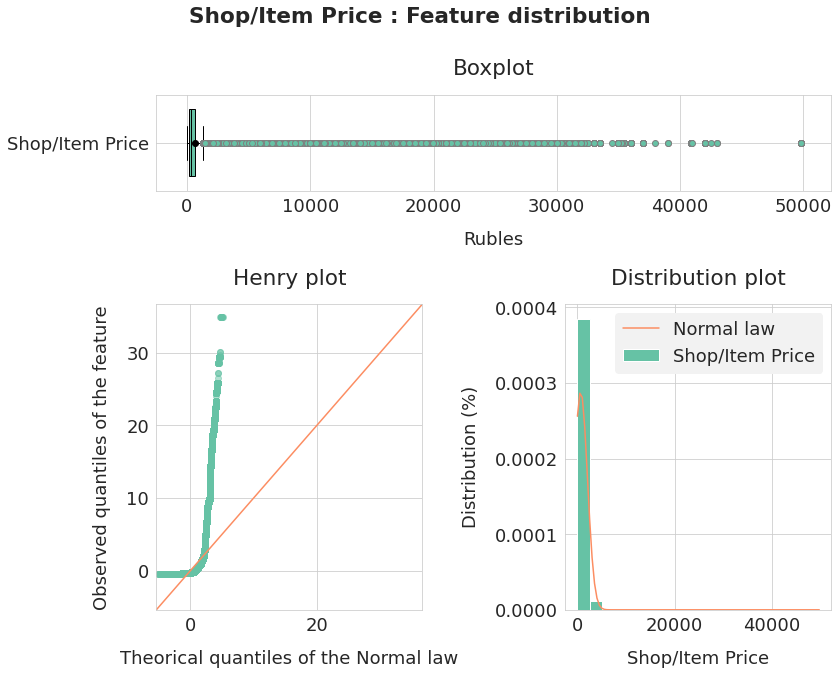

In [92]:
graph_quant_feature(feature, feature_name,
                    "Rubles")

In [93]:
feature = np.log(data.month_shopitem_price)
feature_name = "Log of Shop/Item Price"
feature.describe()

count    9.762047e+06
mean     5.764509e+00
std      1.058184e+00
min     -2.407946e+00
25%      5.288267e+00
50%      5.700444e+00
75%      6.475433e+00
max      1.081541e+01
Name: month_shopitem_price, dtype: float64

In [94]:
test_normality(feature, feature_name)

Log of Shop/Item Price - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


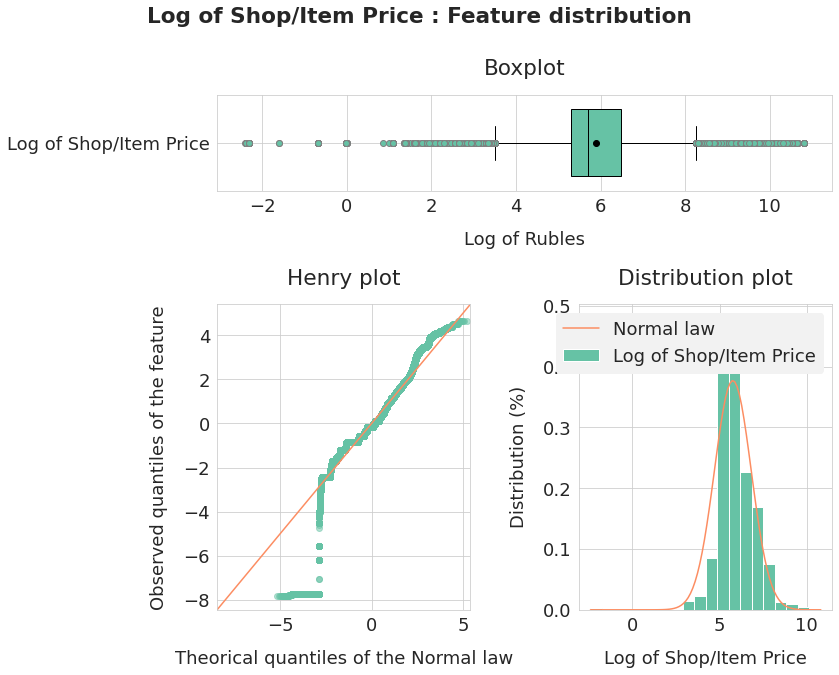

In [95]:
graph_quant_feature(feature, feature_name,
                    "Log of Rubles")

The distribution of the log of shop/item price is pretty close to the normal distribution.

In [96]:
feature = data.month_shopitem_price_change
feature_name = "Shop/Item Price Change"
feature.describe()

count    9.762047e+06
mean     7.099277e-02
std      1.370391e+01
min     -9.998628e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      5.197000e+03
Name: month_shopitem_price_change, dtype: float64

In [97]:
test_normality(feature, feature_name)

Shop/Item Price Change - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


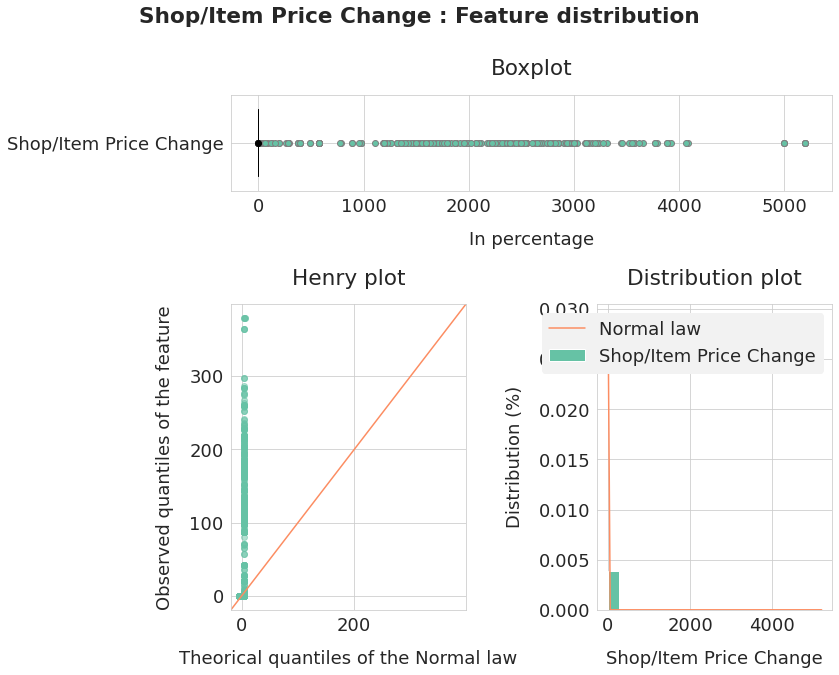

In [98]:
graph_quant_feature(feature, feature_name,
                    "In percentage")

A price variation of more than 200% is pretty rare. So I limit the range analysis.

In [99]:
feature = data[data.month_shopitem_price_change < 2].\
    month_shopitem_price_change
feature_name = "Shop/Item Price Change"
feature.describe()

count    9.761064e+06
mean    -2.280359e-03
std      6.706365e-02
min     -9.998628e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.998000e+00
Name: month_shopitem_price_change, dtype: float64

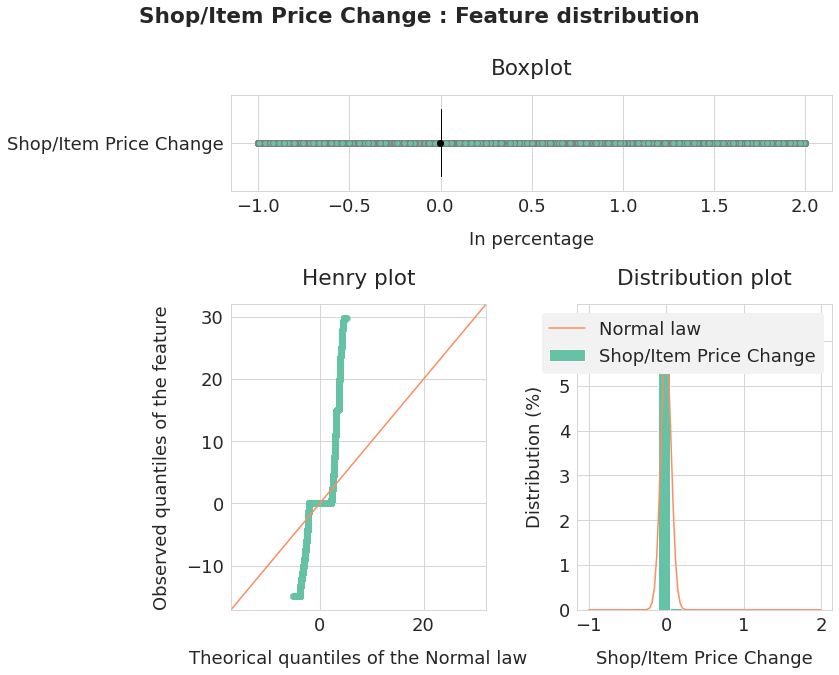

In [100]:
graph_quant_feature(feature, feature_name,
                    "In percentage")

In [101]:
feature = data.month_shopitem_price_change.clip(-1, 2)
feature_name = "Shop/Item Price Change"
feature.describe()

count    9.762047e+06
mean    -2.078809e-03
std      7.000894e-02
min     -9.998628e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.000000e+00
Name: month_shopitem_price_change, dtype: float64

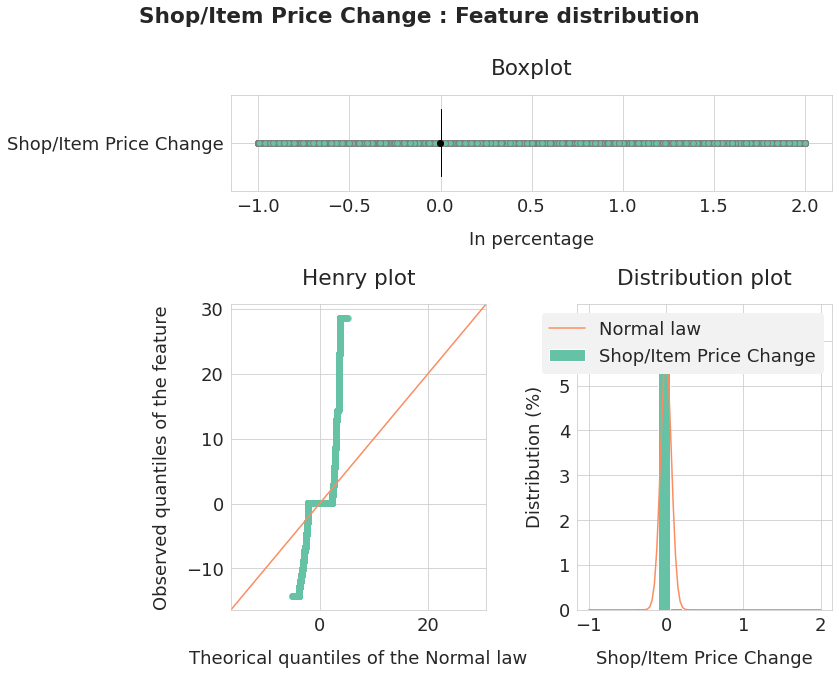

In [102]:
graph_quant_feature(feature, feature_name,
                    "In percentage")

In [103]:
feature = np.cbrt(
    data.month_shopitem_price_change.clip(-1, 2))
feature_name = "Cbrt of Price Change"
feature.describe()

count    9.762047e+06
mean    -4.053189e-03
std      1.136855e-01
min     -9.999543e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.259921e+00
Name: month_shopitem_price_change, dtype: float64

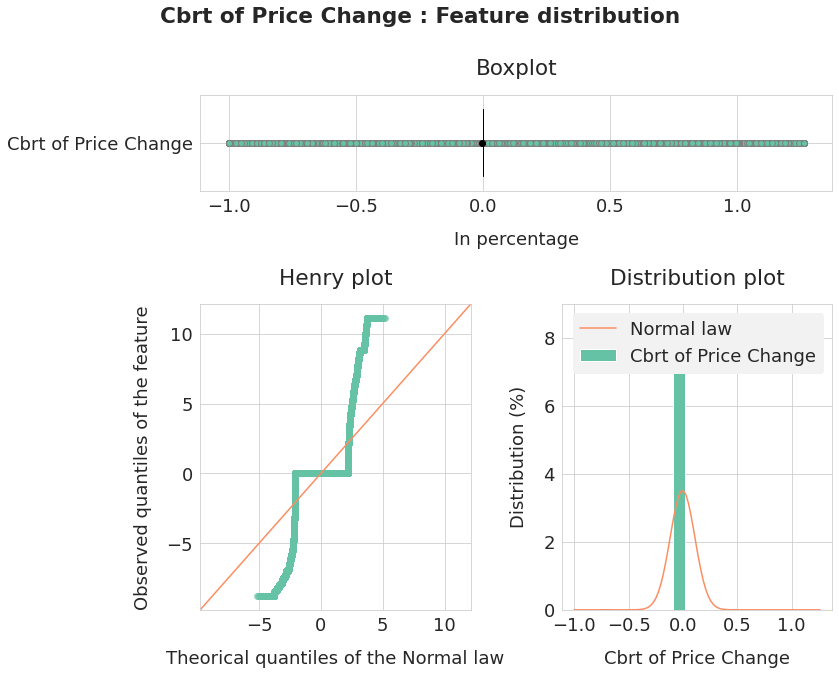

In [104]:
graph_quant_feature(feature, feature_name,
                    "In percentage")

It's difficult to get a close-to-normality distribution by transforming the shop/item price change. This is due to the fact that Q1 to Q3 values are equal to 0.

I remove -1 values of item count month change because they are linked to an item count moving from a positive value to a zero value.

In [105]:
feature = data[data.item_cnt_month_change > -1].item_cnt_month_change
feature_name = "Item Count Month Change"
feature.describe()

count    8.864685e+06
mean     7.233413e-02
std      4.242992e-01
min     -9.988926e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.290000e+02
Name: item_cnt_month_change, dtype: float64

In [106]:
test_normality(feature, feature_name)

Item Count Month Change - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


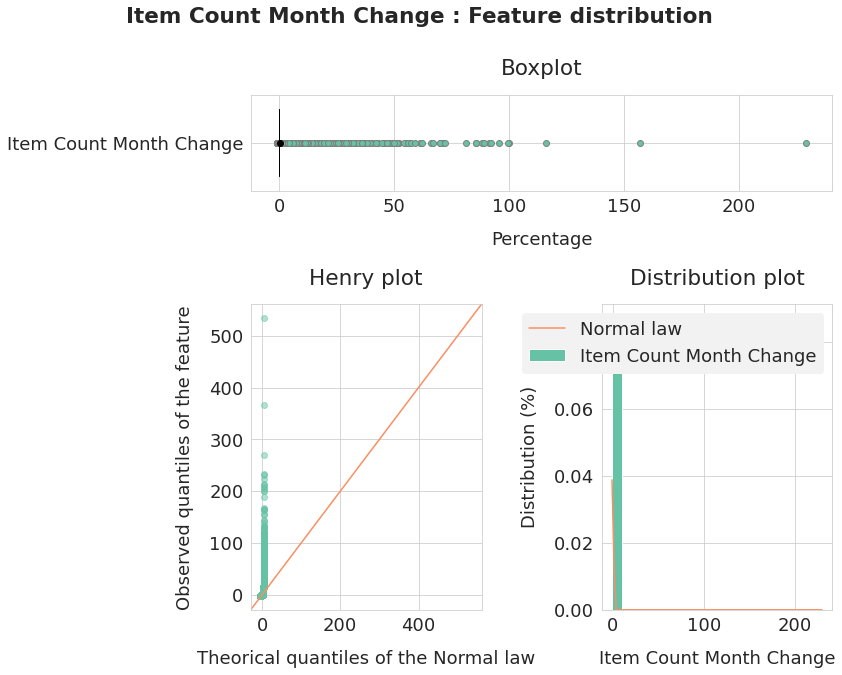

In [107]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

Monthly increase of over 200% are rare occurrences. I get rid of them for the analysis of the distribution.

In [108]:
feature = data[(data.item_cnt_month_change > -1) &
    (data.item_cnt_month_change < 2)].item_cnt_month_change
feature_name = "Item Count Month Change"
feature.describe()

count    8.819580e+06
mean     5.615412e-02
std      2.686511e-01
min     -9.988926e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.968085e+00
Name: item_cnt_month_change, dtype: float64

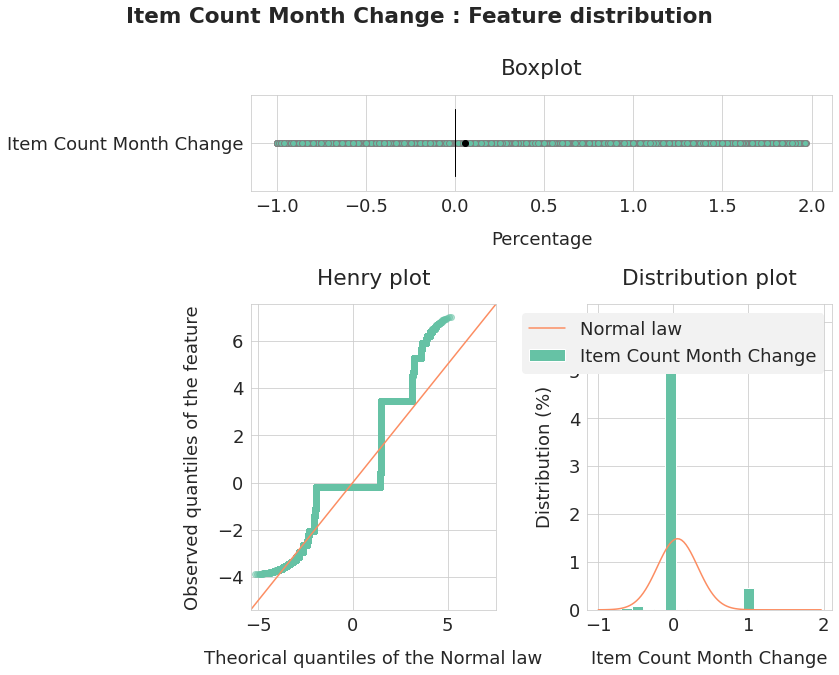

In [109]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [110]:
feature = data[data.item_cnt_month_change > -1].\
    item_cnt_month_change.clip(-1, 2)
feature_name = "Item Count Month Change"
feature.describe()

count    8.864685e+06
mean     6.604208e-02
std      3.000847e-01
min     -9.988926e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.000000e+00
Name: item_cnt_month_change, dtype: float64

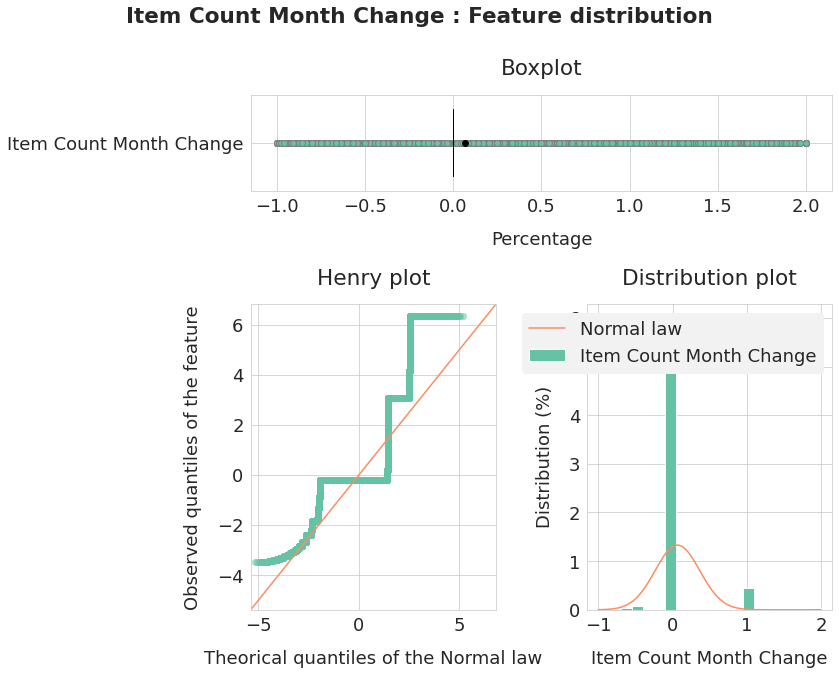

In [111]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

One more time, a lot of 0 values give a weird distribution curve. We have also a lot of 100% increase, that correspond when a product is sold again after a month without sale.  
I look at the distribution if I keep -1 values of Item Count Month Change.

In [112]:
feature = data.item_cnt_month_change.clip(-1, 2)
feature_name = "Item Count Month Change"
feature.describe()

count    9.762047e+06
mean    -3.195323e-02
std      4.221857e-01
min     -1.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.000000e+00
Name: item_cnt_month_change, dtype: float64

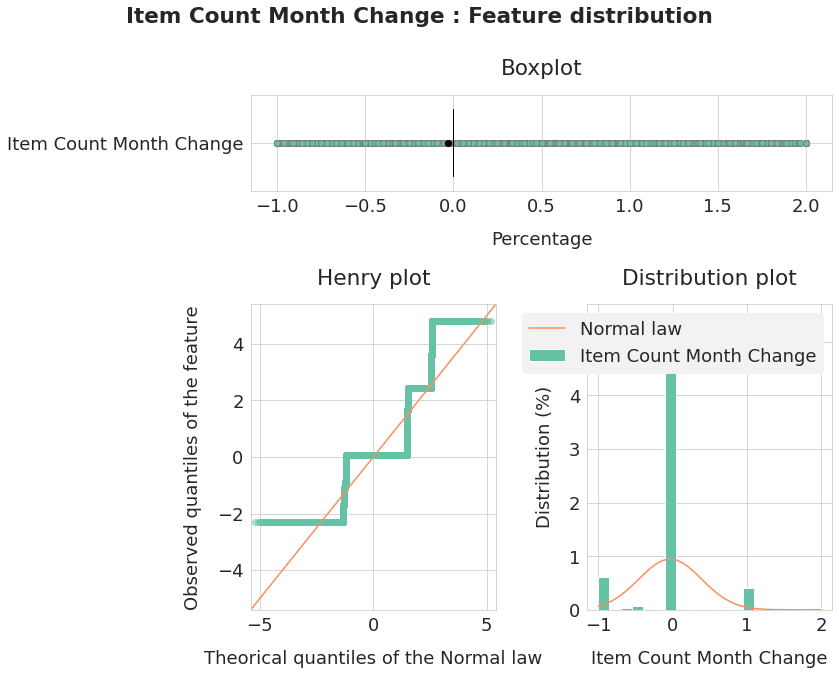

In [113]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [114]:
feature = data.month_shopitem_relative_price
feature_name = "Shop/Item Relative Price"
feature.describe()

count    9.762047e+06
mean    -3.201073e-02
std      1.340723e-01
min     -9.998354e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.237884e+01
Name: month_shopitem_relative_price, dtype: float64

In [115]:
test_normality(feature, feature_name)

Shop/Item Relative Price - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


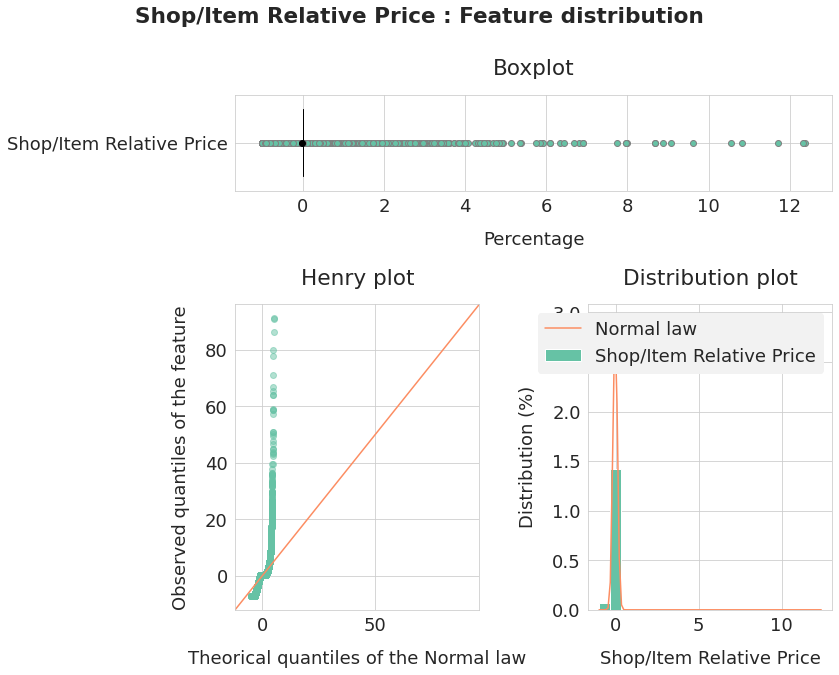

In [116]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [117]:
feature = data[data.month_shopitem_relative_price < 2].\
    month_shopitem_relative_price
feature_name = "Shop/Item Relative Price"
feature.describe()

count    9.761775e+06
mean    -3.210552e-02
std      1.325508e-01
min     -9.998354e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.999285e+00
Name: month_shopitem_relative_price, dtype: float64

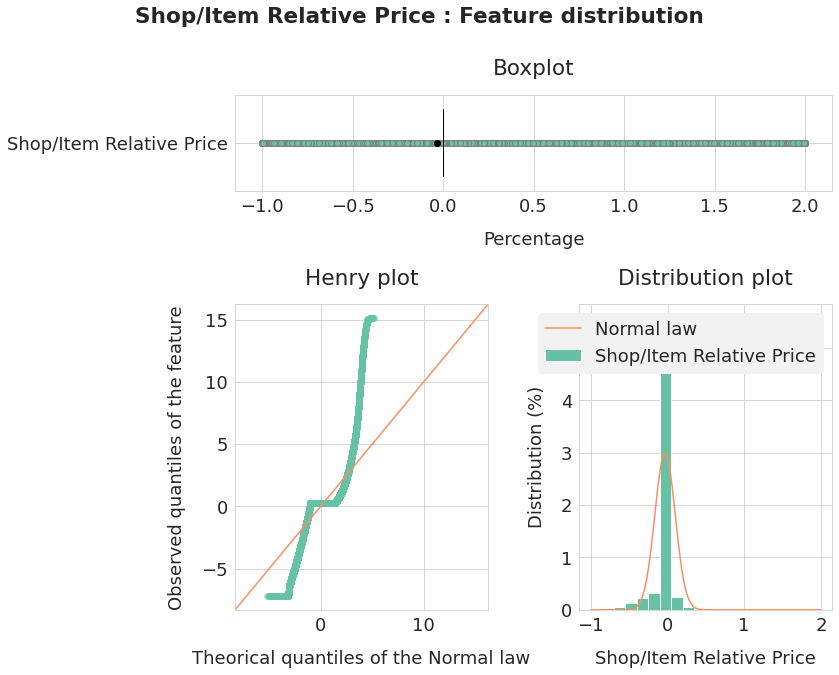

In [118]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [119]:
feature = \
    data.month_shopitem_relative_price.clip(-1, 2)
feature_name = "Shop/Item Relative Price"
feature.describe()

count    9.762047e+06
mean    -3.204887e-02
std      1.329828e-01
min     -9.998354e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.000000e+00
Name: month_shopitem_relative_price, dtype: float64

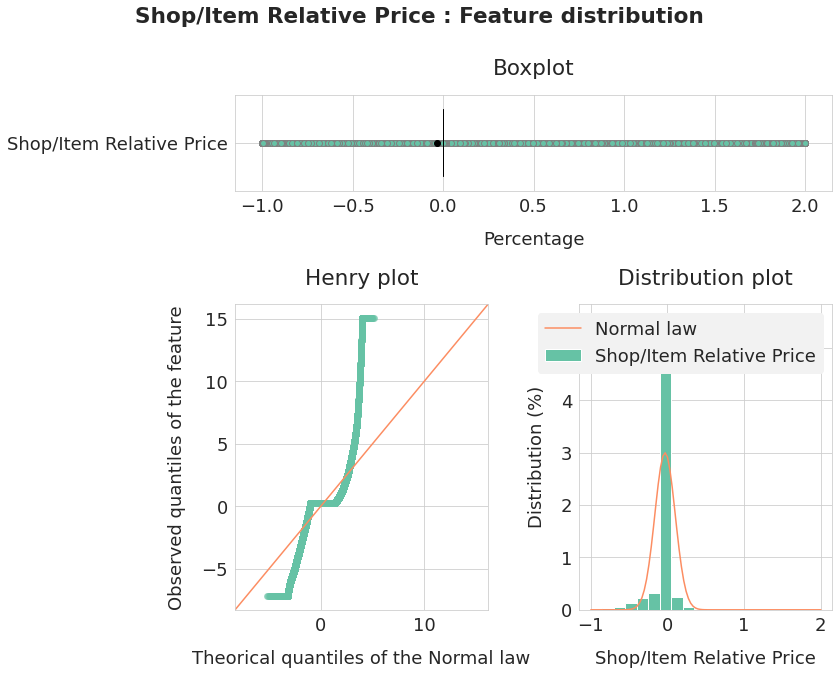

In [120]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [121]:
feature = np.cbrt(
    data.month_shopitem_relative_price.clip(-1, 2))
feature_name = "Log of Relative Price"
feature.describe()

count    9.762047e+06
mean    -5.545604e-02
std      2.670434e-01
min     -9.999451e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.259921e+00
Name: month_shopitem_relative_price, dtype: float64

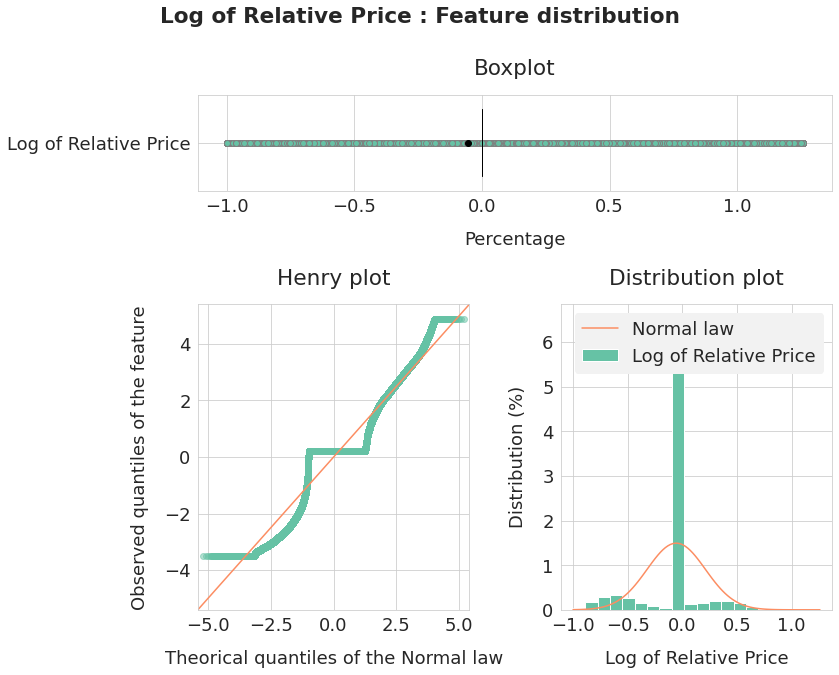

In [122]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

Still a lot of zero values (from Q1 to Q3). And the same conclusions.  
I prefer not to apply the log transformation because its distribution plot has several local maximum.

In [123]:
feature = data[data.month_shopitem_relative_sales > -1].\
    month_shopitem_relative_sales
feature_name = "Shop/Item Relative Sales"
feature.describe()

count    1.605314e+06
mean     4.461631e-01
std      1.220676e+00
min     -9.967846e-01
25%      0.000000e+00
50%      0.000000e+00
75%      6.363636e-01
max      2.400000e+01
Name: month_shopitem_relative_sales, dtype: float64

In [124]:
test_normality(feature, feature_name)

Shop/Item Relative Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


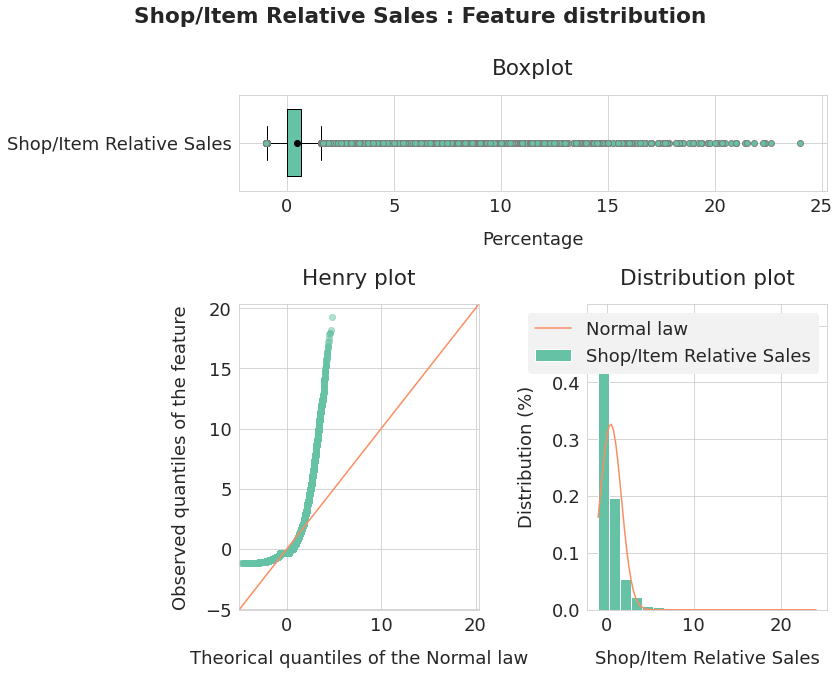

In [125]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [126]:
feature = data[(data.month_shopitem_relative_sales > -1) &
               (data.month_shopitem_relative_sales < 2)].\
    month_shopitem_relative_sales
feature_name = "Shop/Item Relative Sales"
feature.describe()

count    1.459220e+06
mean     1.450969e-01
std      5.629215e-01
min     -9.967846e-01
25%     -1.250000e-01
50%      0.000000e+00
75%      4.000000e-01
max      1.997967e+00
Name: month_shopitem_relative_sales, dtype: float64

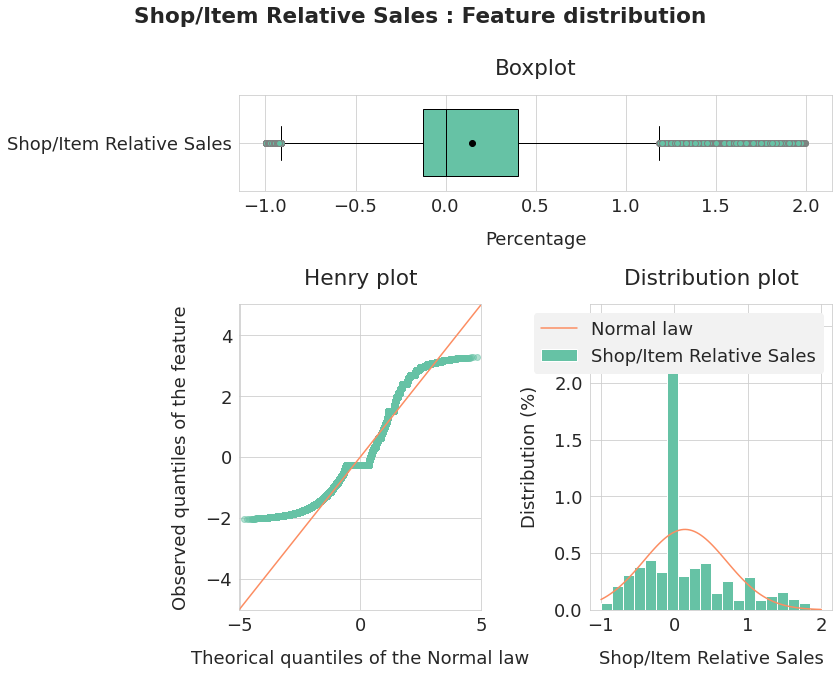

In [127]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [128]:
feature = data[data.month_shopitem_relative_sales > -1].\
    month_shopitem_relative_sales.clip(-1, 2)
feature_name = "Shop/Item Relative Sales"
feature.describe()

count    1.605314e+06
mean     3.139072e-01
std      7.569578e-01
min     -9.967846e-01
25%      0.000000e+00
50%      0.000000e+00
75%      6.363636e-01
max      2.000000e+00
Name: month_shopitem_relative_sales, dtype: float64

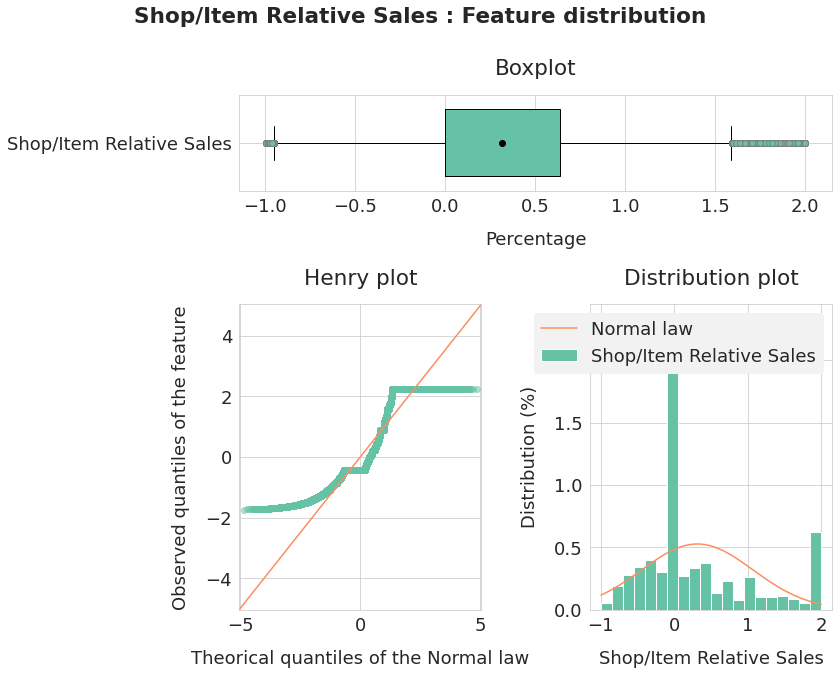

In [129]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [130]:
feature = data.month_shopitem_relative_sales.clip(-1, 2)
feature_name = "Shop/Item Relative Sales"
feature.describe()

count    9.762047e+06
mean    -7.839010e-01
std      5.470079e-01
min     -1.000000e+00
25%     -1.000000e+00
50%     -1.000000e+00
75%     -1.000000e+00
max      2.000000e+00
Name: month_shopitem_relative_sales, dtype: float64

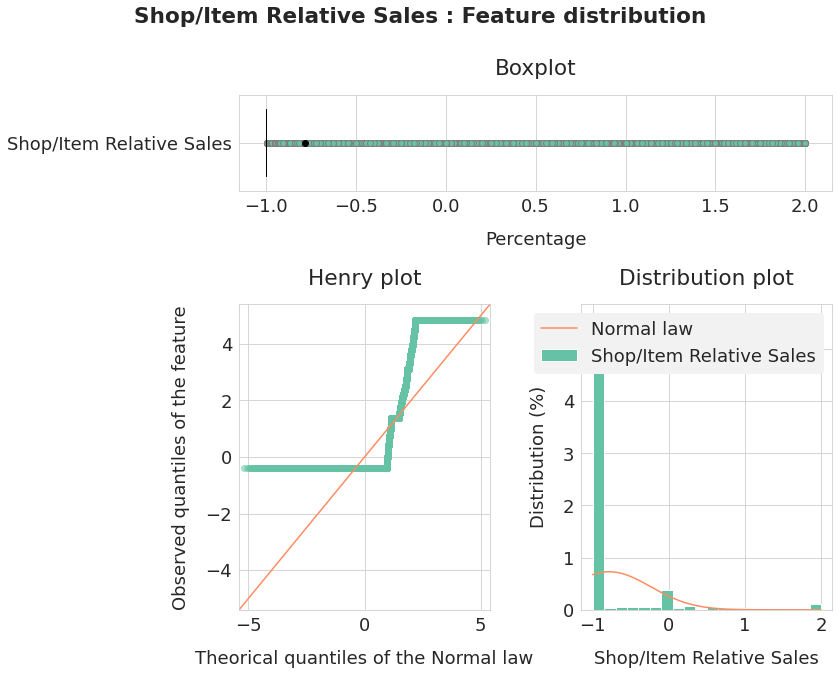

In [131]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [132]:
feature = np.log1p(
    data[data.month_shopitem_relative_sales > -1].\
    month_shopitem_relative_sales.clip(-1, 2))
feature_name = "Log of Relative Sales"
feature.describe()

count    1.605314e+06
mean     1.012611e-01
std      6.200545e-01
min     -5.739793e+00
25%      0.000000e+00
50%      0.000000e+00
75%      4.924765e-01
max      1.098612e+00
Name: month_shopitem_relative_sales, dtype: float64

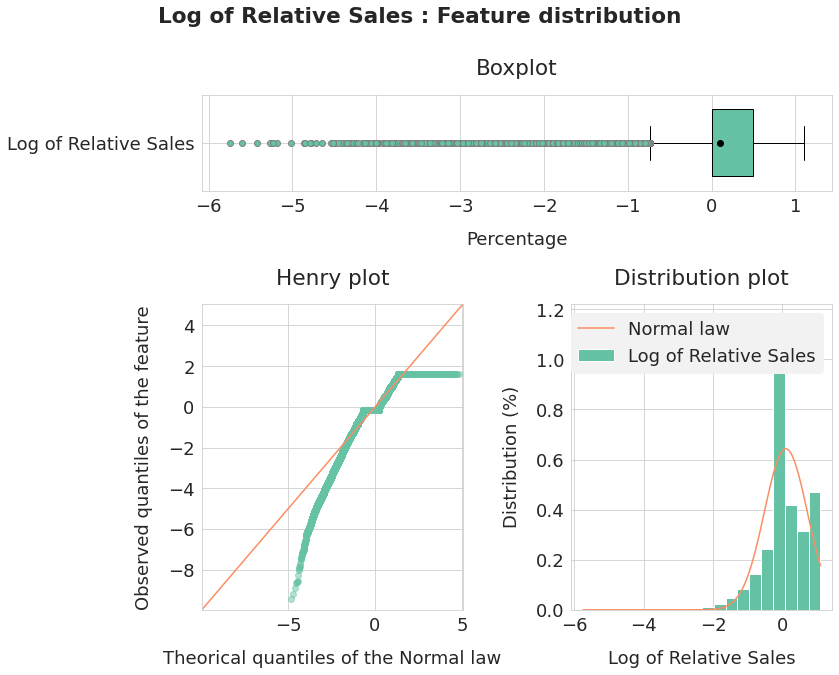

In [133]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

Still a lot of 0 values.

In [134]:
feature = data.month_shopitem_compared_price
feature_name = "Shop/Item Compared Price"
feature.describe()

count    9.762047e+06
mean     7.085116e-01
std      2.894005e+01
min     -9.997898e-01
25%      0.000000e+00
50%      0.000000e+00
75%      1.012565e-01
max      3.997000e+03
Name: month_shopitem_compared_price, dtype: float64

In [135]:
test_normality(feature, feature_name)

Shop/Item Compared Price - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


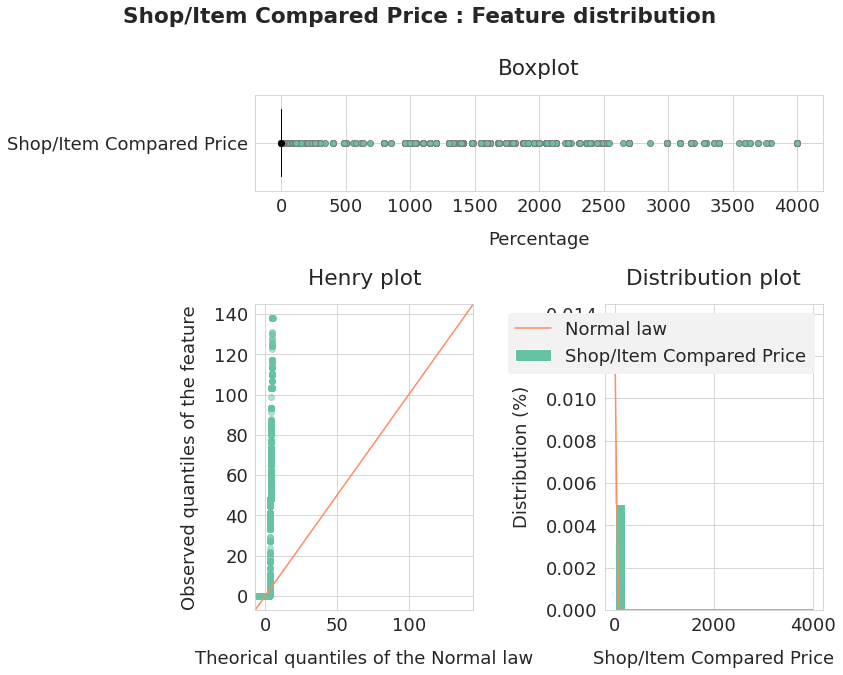

In [136]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [137]:
feature = data[data.month_shopitem_compared_price < 2].\
    month_shopitem_compared_price
feature_name = "Shop/Item Compared Price"
feature.describe()

count    9.317788e+06
mean     1.076128e-01
std      3.612116e-01
min     -9.997898e-01
25%      0.000000e+00
50%      0.000000e+00
75%      4.835487e-02
max      1.999852e+00
Name: month_shopitem_compared_price, dtype: float64

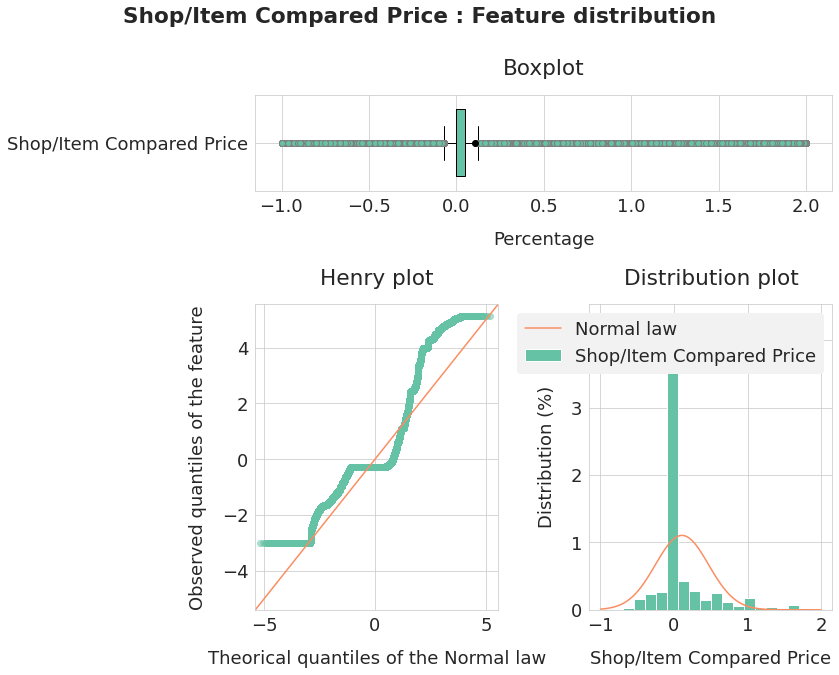

In [138]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [139]:
feature = data.month_shopitem_compared_price.clip(-1, 2)
feature_name = "Shop/Item Compared Price"
feature.describe()

count    9.762047e+06
mean     1.935986e-01
std      5.249972e-01
min     -9.997898e-01
25%      0.000000e+00
50%      0.000000e+00
75%      1.012565e-01
max      2.000000e+00
Name: month_shopitem_compared_price, dtype: float64

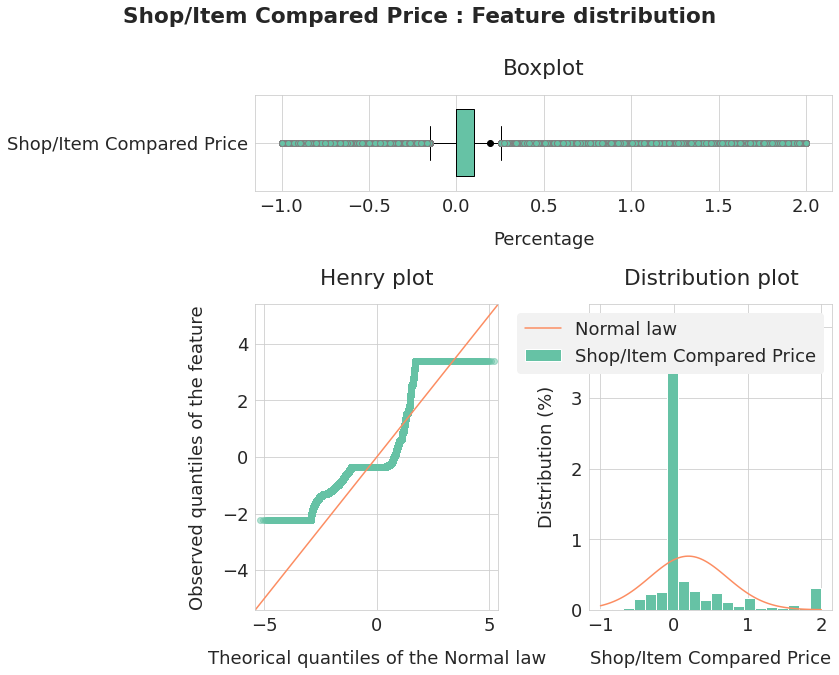

In [140]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

Still a weird distribution with a lot of zero values.

In [141]:
feature = data[data.month_shopitem_compared_sales > -1].\
    month_shopitem_compared_sales
feature_name = "Shop/Item Compared Sales"
feature.describe()

count    5.716872e+06
mean     6.522325e-08
std      3.057621e-01
min     -9.941064e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.321171e+01
Name: month_shopitem_compared_sales, dtype: float64

In [142]:
test_normality(feature, feature_name)

Shop/Item Compared Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


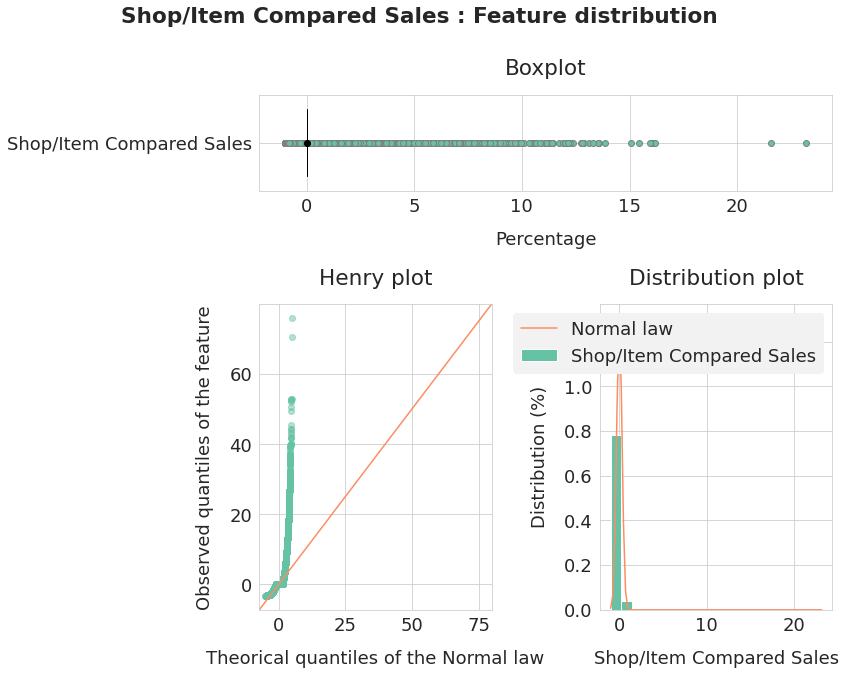

In [143]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [144]:
feature = data[(data.month_shopitem_compared_sales > -1) &
    (data.month_shopitem_compared_sales < 2)].\
    month_shopitem_compared_sales
feature_name = "Shop/Item Compared Sales"
feature.describe()

count    5.693546e+06
mean    -1.176985e-02
std      2.350174e-01
min     -9.941064e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.998698e+00
Name: month_shopitem_compared_sales, dtype: float64

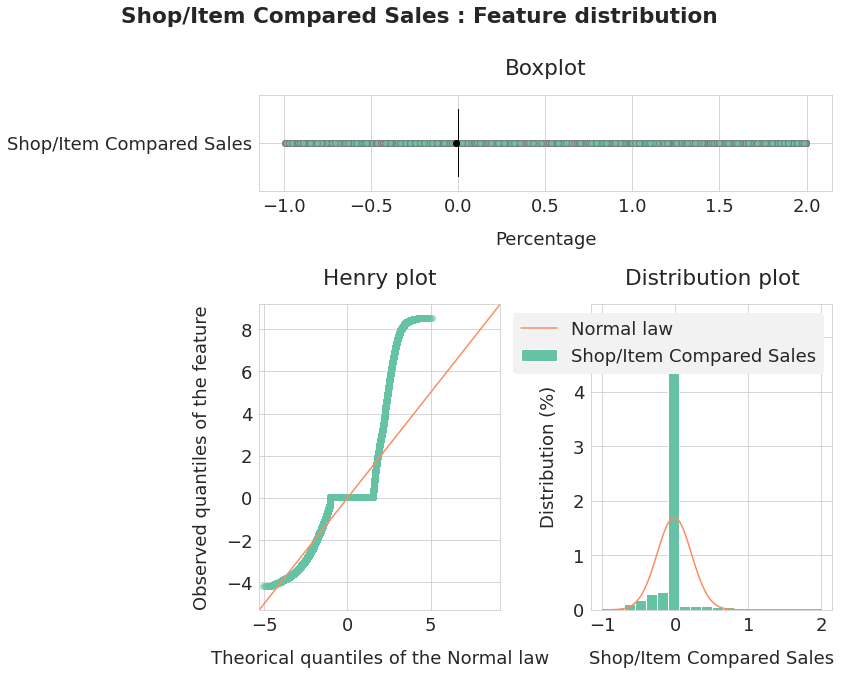

In [145]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [146]:
feature = data[data.month_shopitem_compared_sales > -1].\
    month_shopitem_compared_sales.clip(-1, 2)
feature_name = "Shop/Item Compared Sales"
feature.describe()

count    5.716872e+06
mean    -3.564030e-03
std      2.673033e-01
min     -9.941064e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.000000e+00
Name: month_shopitem_compared_sales, dtype: float64

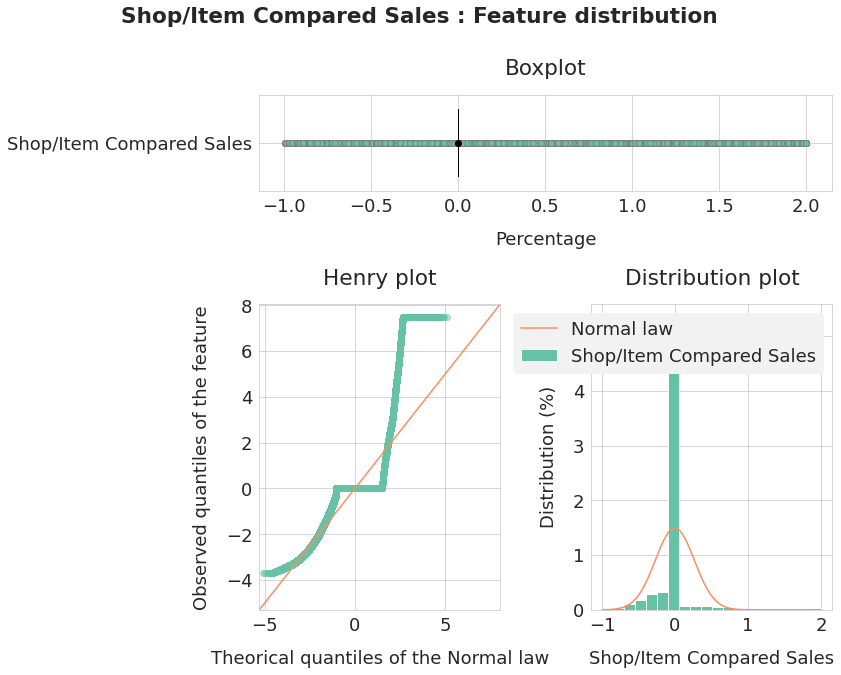

In [147]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [148]:
feature = data.month_shopitem_compared_sales.clip(-1, 2)
feature_name = "Shop/Item Compared Sales"
feature.describe()

count    9.762047e+06
mean    -4.165374e-01
std      5.307965e-01
min     -1.000000e+00
25%     -1.000000e+00
50%     -7.518797e-02
75%      0.000000e+00
max      2.000000e+00
Name: month_shopitem_compared_sales, dtype: float64

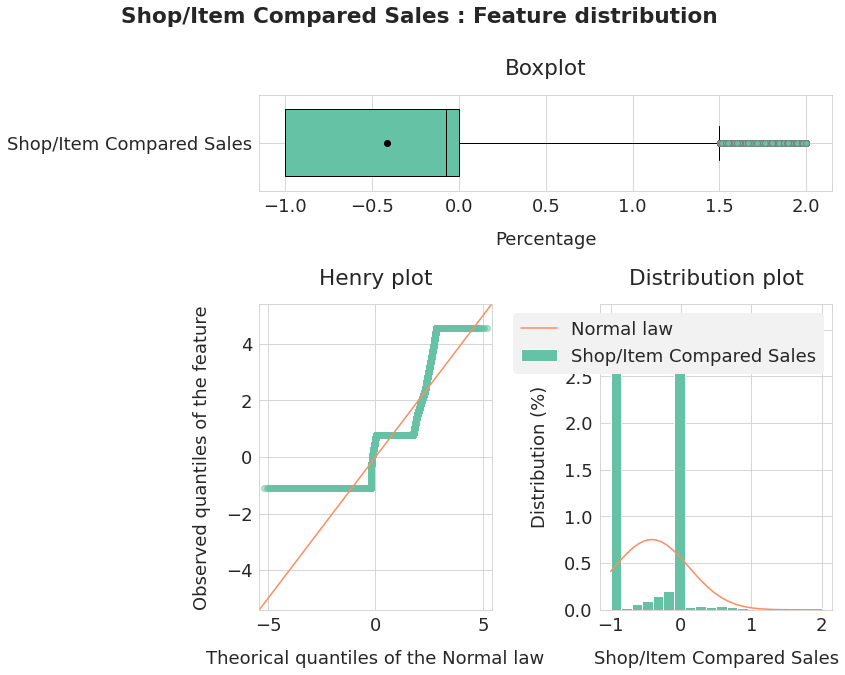

In [149]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [150]:
feature = np.log1p(
    data[data.month_shopitem_compared_sales > -1].\
    month_shopitem_compared_sales.clip(-1, 2))
feature_name = "Log of Compared Sales"
feature.describe()

count    5.716872e+06
mean    -3.523412e-02
std      2.573085e-01
min     -5.133880e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.098612e+00
Name: month_shopitem_compared_sales, dtype: float64

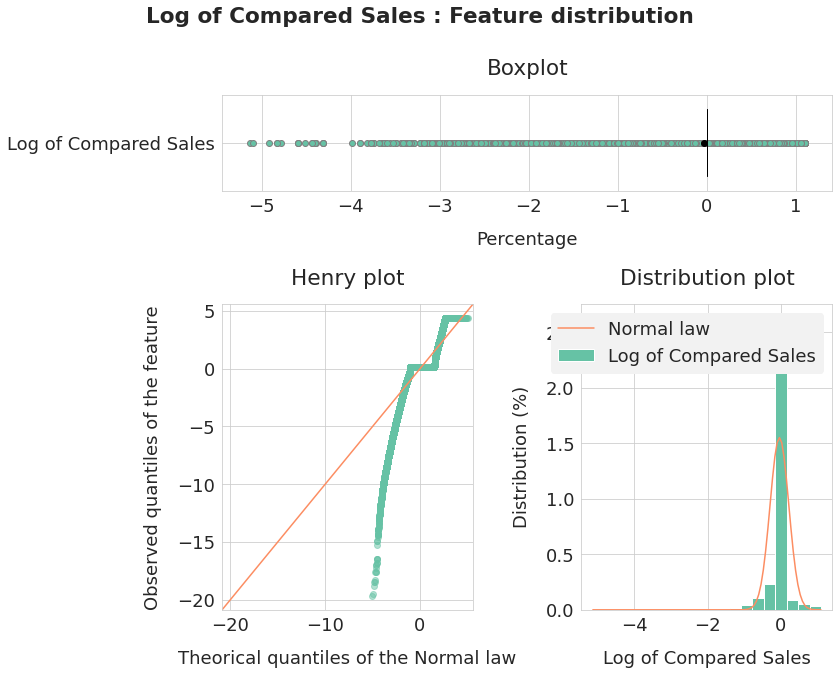

In [151]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

Same weird distribution with a lot of zero values and high outliers.

## 2.2. Global data

In [152]:
feature = data.month_global_sumsales
feature_name = "Global Sales"
feature.describe()

count    9.762047e+06
mean     1.028435e+05
std      2.937100e+04
min      6.319900e+04
25%      7.785000e+04
50%      9.923700e+04
75%      1.169820e+05
max      1.833590e+05
Name: month_global_sumsales, dtype: float64

In [153]:
test_normality(feature, feature_name)

Global Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


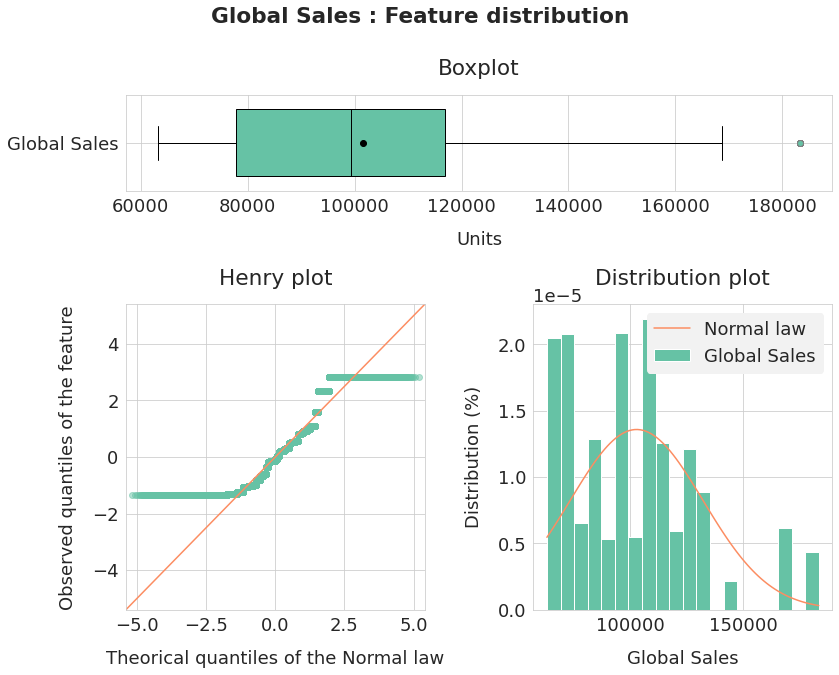

In [154]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [155]:
feature = data.month_global_revenue
feature_name = "Global Revenue"
feature.describe()

count      9762047.0
mean      94170480.0
std       39123812.0
min       59492780.0
25%       80675360.0
50%       90314448.0
75%      112562232.0
max      232076096.0
Name: month_global_revenue, dtype: float64

In [156]:
test_normality(feature, feature_name)

Global Revenue - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


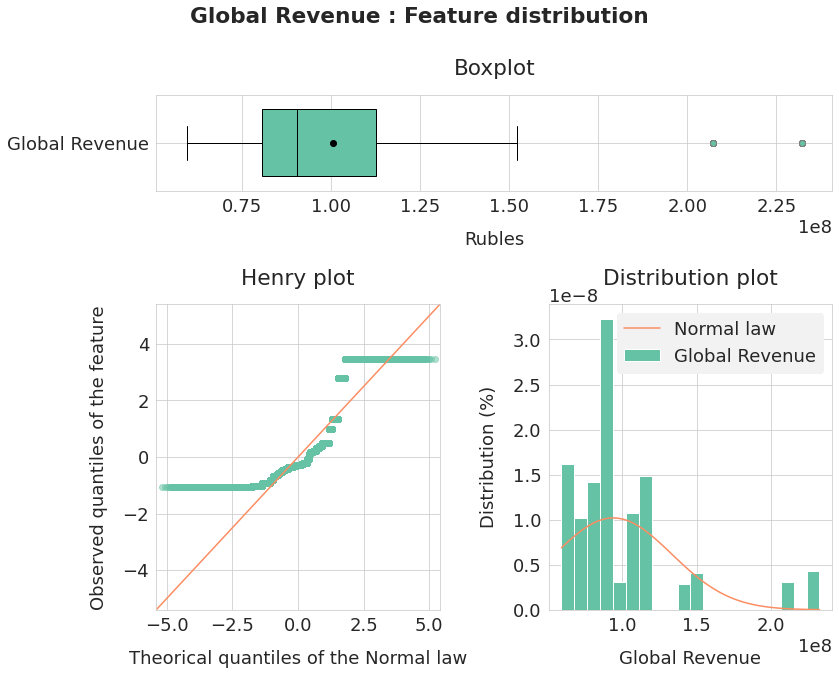

In [157]:
graph_quant_feature(feature, feature_name,
                    "Rubles")

In [158]:
feature = np.log(data.month_global_revenue)
feature_name = "Log of Global Revenue"
feature.describe()

count    9.762047e+06
mean     1.708034e+01
std      1.338314e+00
min      1.790137e+01
25%      1.820594e+01
50%      1.831881e+01
75%      1.853902e+01
max      1.926258e+01
Name: month_global_revenue, dtype: float64

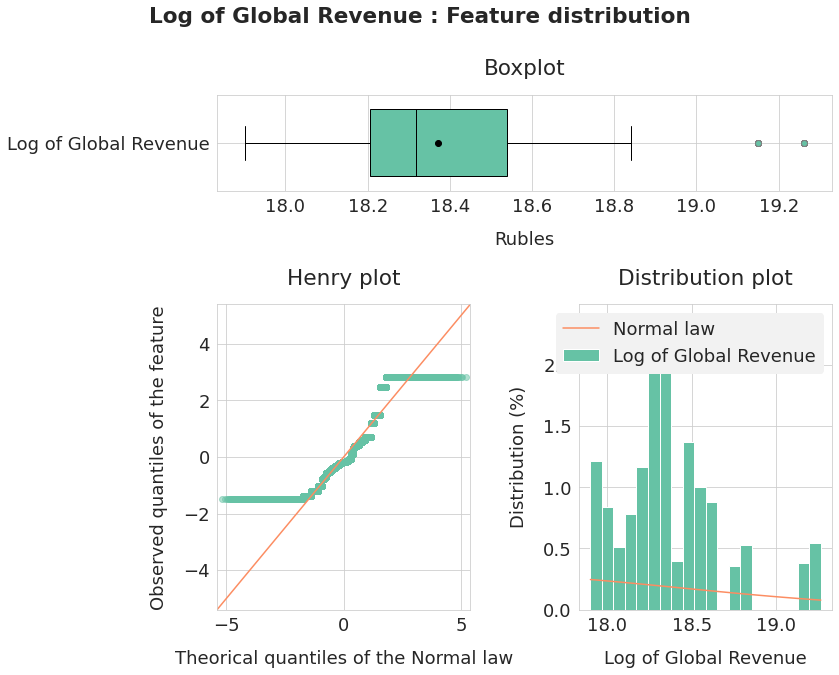

In [159]:
graph_quant_feature(feature, feature_name,
                    "Rubles")

In [160]:
feature = data.month_global_sumsales_change
feature_name = "Global Sales Change"
feature.describe()

count    9.762047e+06
mean    -6.549682e-03
std      1.636476e-01
min     -3.621693e-01
25%     -6.308682e-02
50%     -1.448665e-02
75%      7.143834e-02
max      4.320077e-01
Name: month_global_sumsales_change, dtype: float64

In [161]:
test_normality(feature, feature_name)

Global Sales Change - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


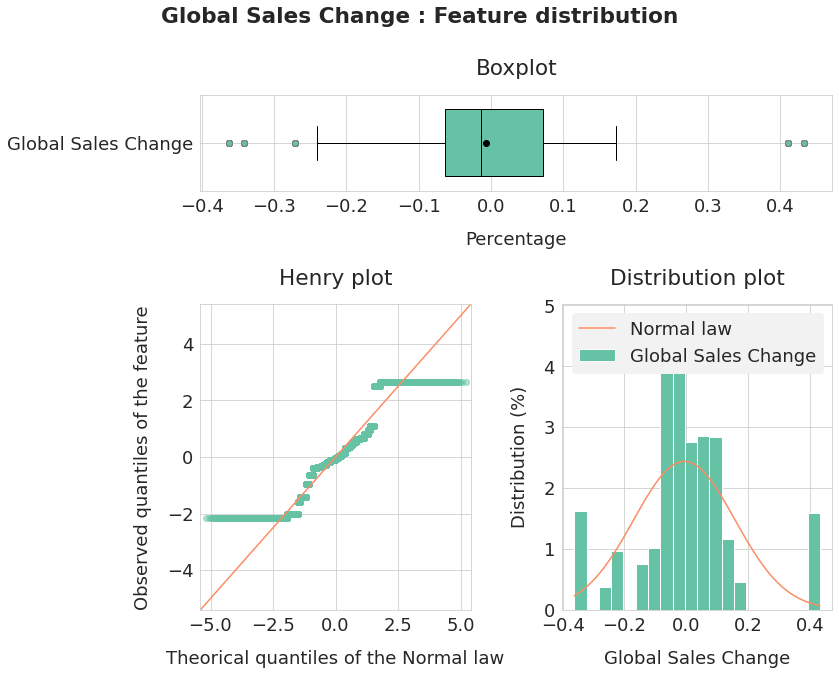

In [162]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [163]:
feature = data.month_global_revenue_change
feature_name = "Global Revenue Change"
feature.describe()

count    9.762047e+06
mean     3.067940e-02
std      2.687671e-01
min     -5.256272e-01
25%     -9.432840e-02
50%     -9.406483e-04
75%      1.715910e-01
max      6.004704e-01
Name: month_global_revenue_change, dtype: float64

In [164]:
test_normality(feature, feature_name)

Global Revenue Change - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


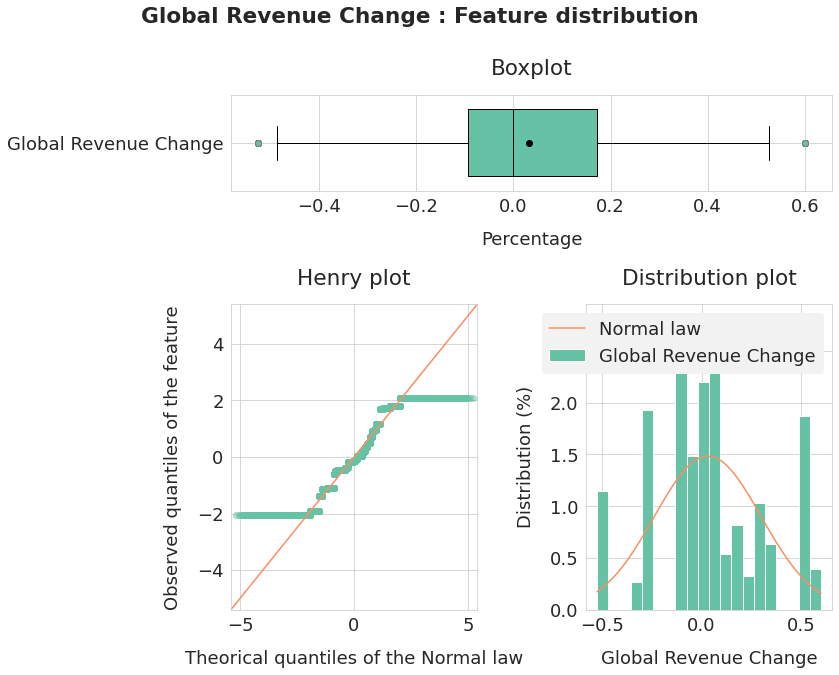

In [165]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [166]:
feature = data.month_global_relative_sumsales
feature_name = "Global Relative Sales"
feature.describe()

count    9.762047e+06
mean    -1.598544e-01
std      2.032537e-01
min     -4.303248e-01
25%     -3.271107e-01
50%     -1.655582e-01
75%     -5.162106e-02
max      4.076143e-01
Name: month_global_relative_sumsales, dtype: float64

In [167]:
test_normality(feature, feature_name)

Global Relative Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


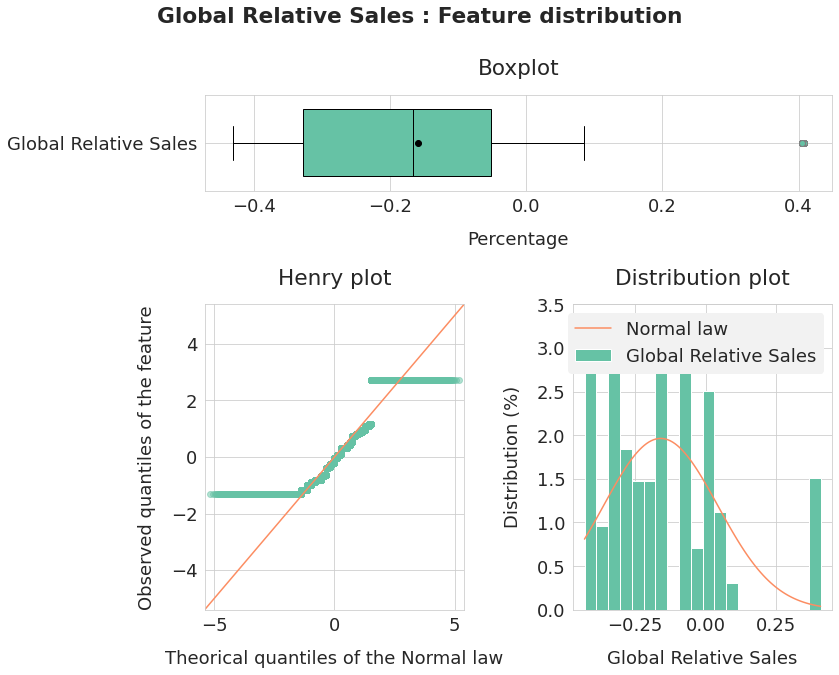

In [168]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=3.5)

In [169]:
feature = data.month_global_relative_revenue
feature_name = "Global Relative Revenue"
feature.describe()

count    9.762047e+06
mean     1.652562e-02
std      3.576662e-01
min     -4.166048e-01
25%     -1.869539e-01
50%     -8.221720e-02
75%      1.084181e-01
max      1.171314e+00
Name: month_global_relative_revenue, dtype: float64

In [170]:
test_normality(feature, feature_name)

Global Relative Revenue - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


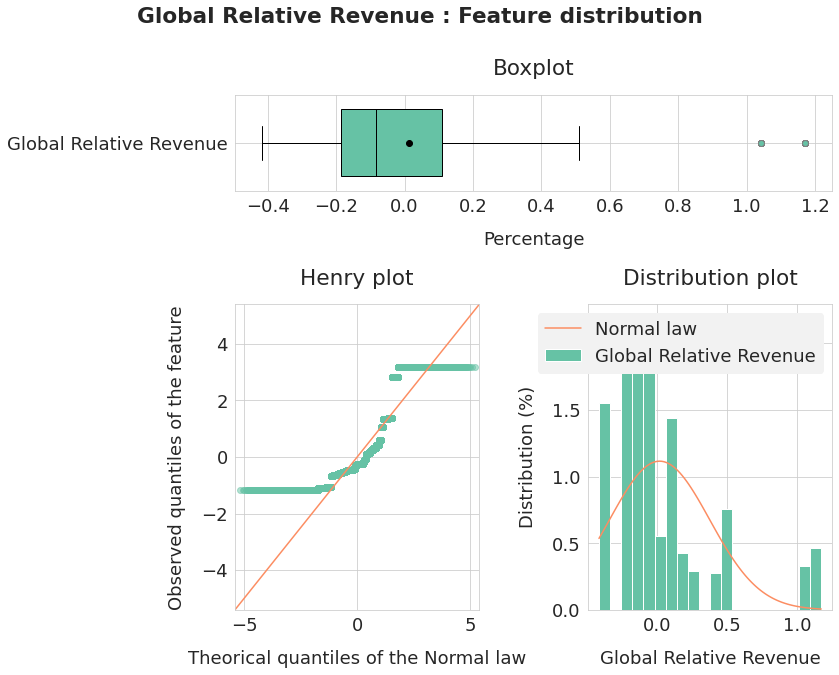

In [171]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [172]:
feature = np.log1p(data.month_global_relative_revenue)
feature_name = "Log of Global Relative Revenue"
feature.describe()

count    9.762047e+06
mean    -3.494418e-02
std      2.983663e-01
min     -5.388904e-01
25%     -2.069675e-01
50%     -8.579452e-02
75%      1.029339e-01
max      7.753326e-01
Name: month_global_relative_revenue, dtype: float64

In [173]:
test_normality(feature, feature_name)

Log of Global Relative Revenue - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


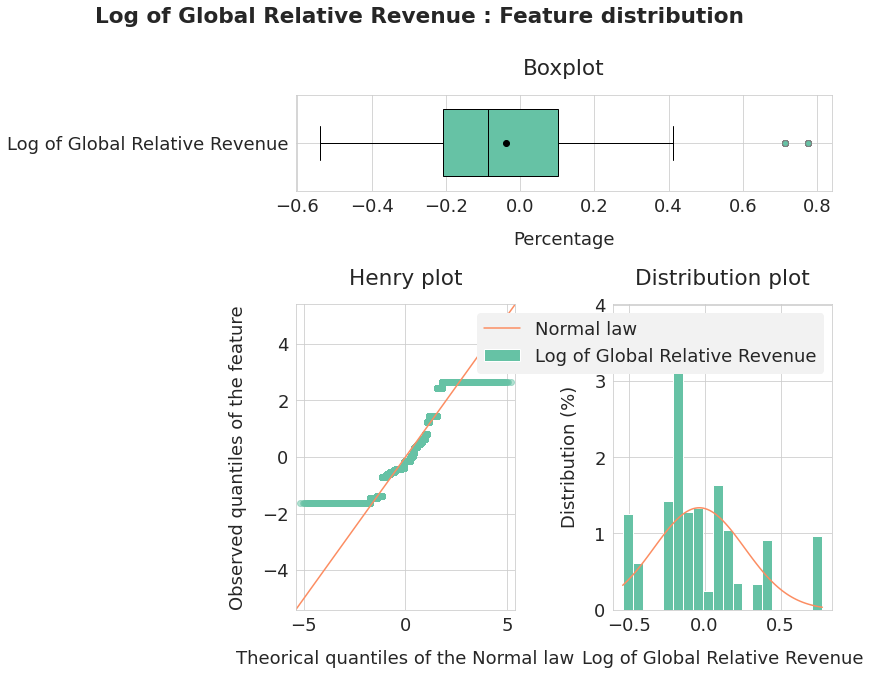

In [174]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

Global data don't necessary need transformation, except the global relative revenue. Extreme values are always a problem to get close to normality.

## 2.3. Item data

In [175]:
feature = data.month_item_price
feature_name = "Item Price"
feature.describe()

count    9.762047e+06
mean     6.331249e+02
std      1.317811e+03
min      1.000000e-01
25%      1.490000e+02
50%      2.990000e+02
75%      5.990000e+02
max      4.978200e+04
Name: month_item_price, dtype: float64

In [176]:
test_normality(feature, feature_name)

Item Price - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


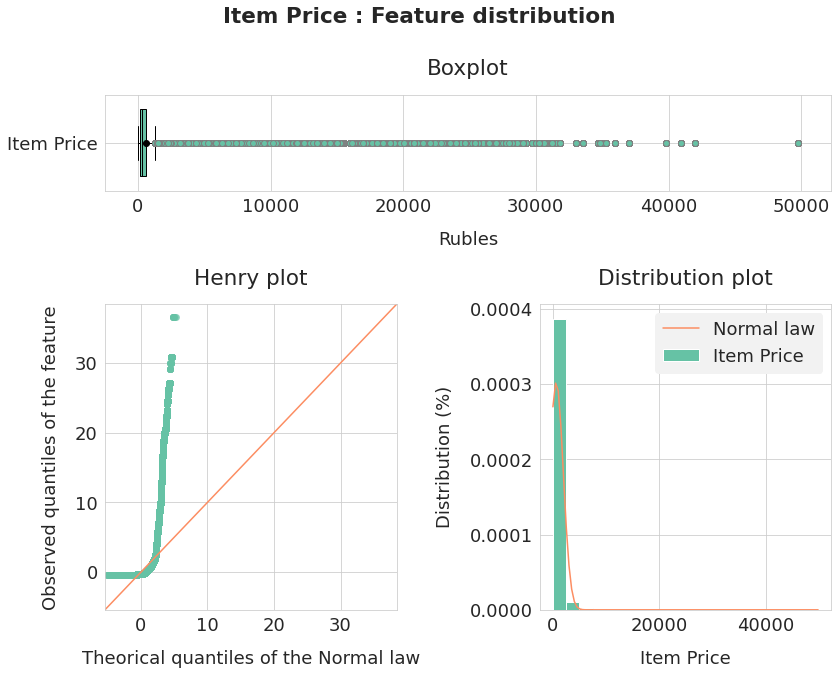

In [177]:
graph_quant_feature(feature, feature_name,
                    "Rubles")

In [178]:
feature = np.log(data.month_item_price)
feature_name = "Log of Item Price"
feature.describe()

count    9.762047e+06
mean     5.673873e+00
std      1.102681e+00
min     -2.302585e+00
25%      5.003946e+00
50%      5.700444e+00
75%      6.395262e+00
max      1.081541e+01
Name: month_item_price, dtype: float64

In [179]:
test_normality(feature, feature_name)

Log of Item Price - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


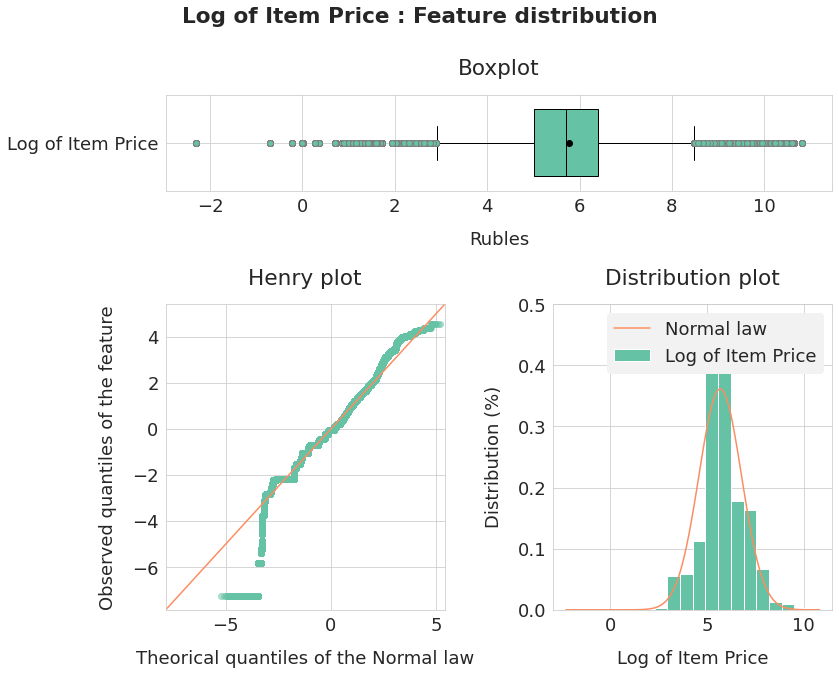

In [180]:
graph_quant_feature(feature, feature_name,
                    "Rubles", ymax=0.5)

In [181]:
feature = data[data.month_item_sales > 0].month_item_sales
feature_name = "Item Sales"
feature.describe()

count    5.650489e+06
mean     1.536241e+00
std      3.669132e+00
min      1.000000e+00
25%      1.000000e+00
50%      1.142857e+00
75%      1.500000e+00
max      2.253000e+03
Name: month_item_sales, dtype: float64

In [182]:
test_normality(feature, feature_name)

Item Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


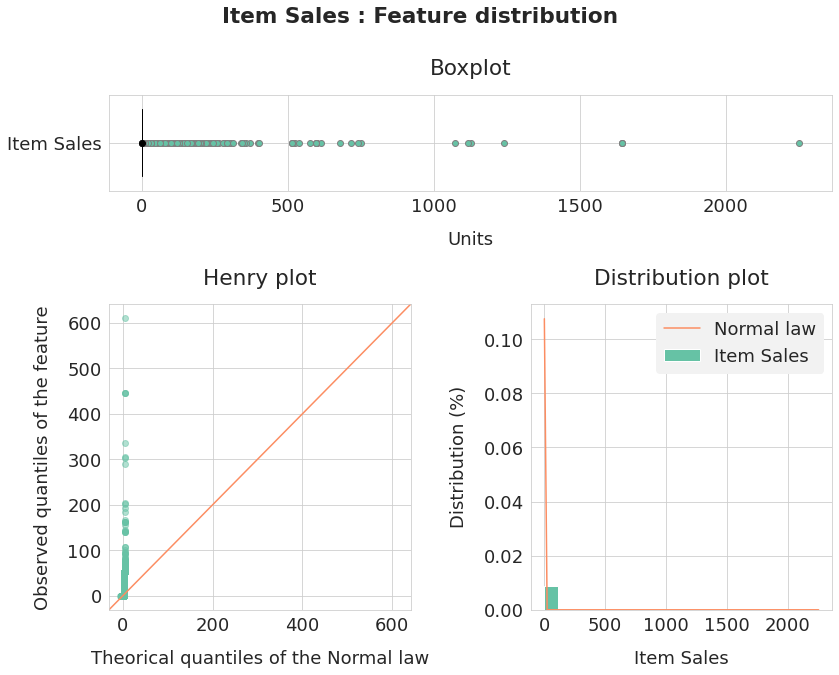

In [183]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [184]:
feature = data[(data.month_item_sales > 0) &
               (data.month_item_sales <= 20)].month_item_sales
feature_name = "Item Sales"
feature.describe()

count    5.642571e+06
mean     1.456228e+00
std      1.092118e+00
min      1.000000e+00
25%      1.000000e+00
50%      1.133333e+00
75%      1.500000e+00
max      2.000000e+01
Name: month_item_sales, dtype: float64

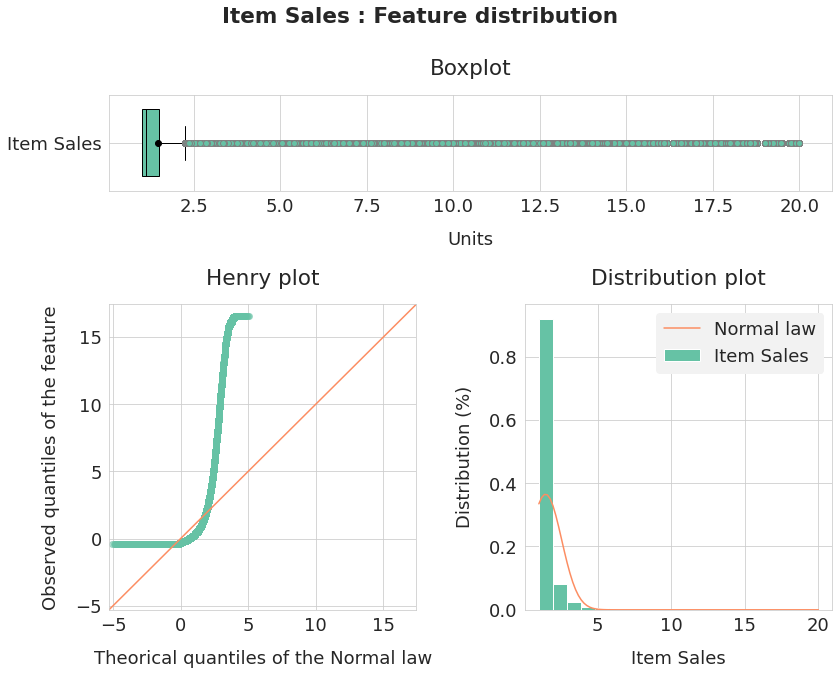

In [185]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [186]:
feature = data[data.month_item_sales > 0].\
    month_item_sales.clip(0, 20)
feature_name = "Item Sales"
feature.describe()

count    5.650489e+06
mean     1.482123e+00
std      1.279817e+00
min      1.000000e+00
25%      1.000000e+00
50%      1.142857e+00
75%      1.500000e+00
max      2.000000e+01
Name: month_item_sales, dtype: float64

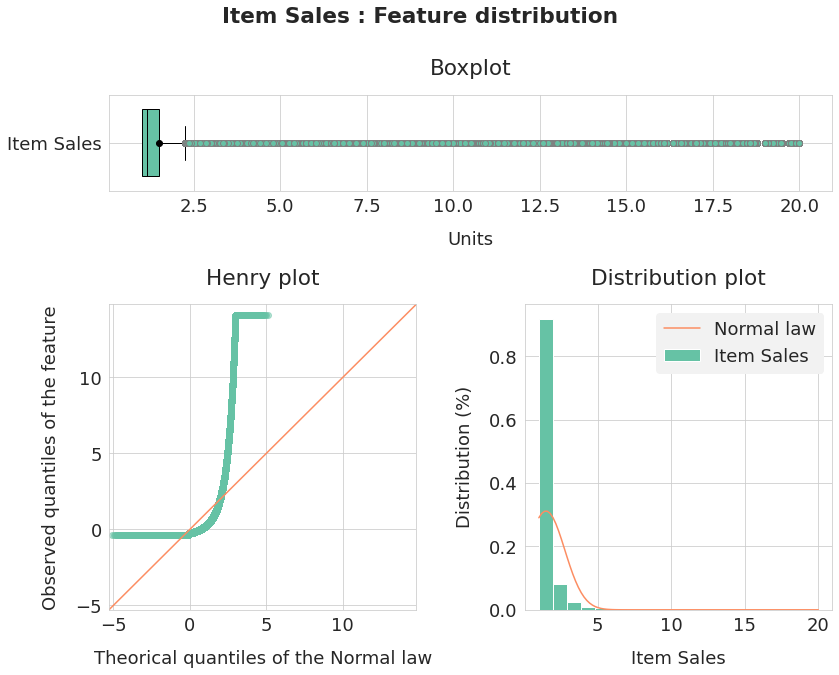

In [187]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [188]:
feature = data.month_item_sales.clip(0, 20)
feature_name = "Item Sales"
feature.describe()

count    9.762047e+06
mean     8.578857e-01
std      1.254987e+00
min      0.000000e+00
25%      0.000000e+00
50%      1.000000e+00
75%      1.200000e+00
max      2.000000e+01
Name: month_item_sales, dtype: float64

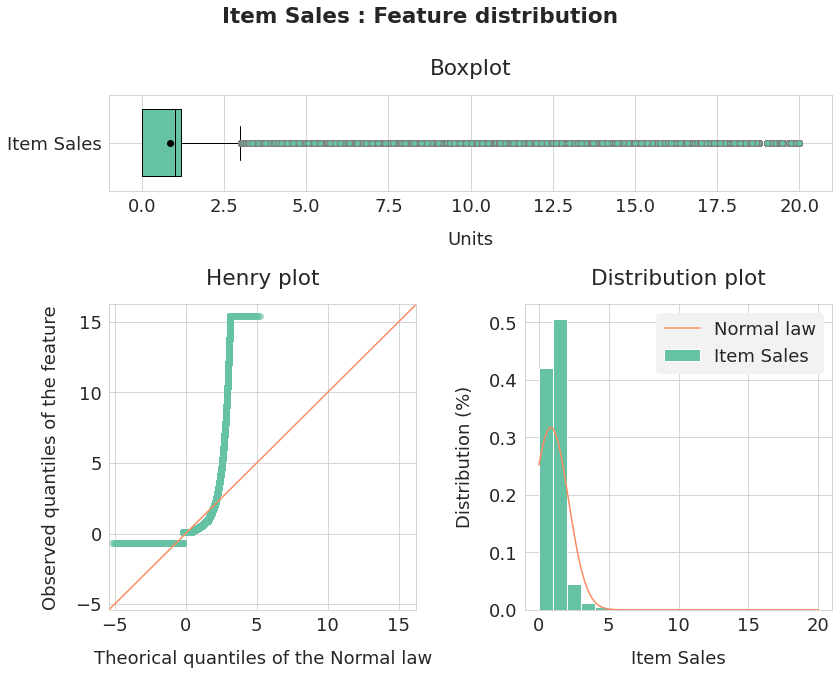

In [189]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [190]:
feature = np.log1p(
    data.month_item_sales.clip(0, 20))
feature_name = "Log of Item Sales"
feature.describe()

count    9.762047e+06
mean     4.986442e-01
std      4.699452e-01
min      0.000000e+00
25%      0.000000e+00
50%      6.931472e-01
75%      7.884574e-01
max      3.044523e+00
Name: month_item_sales, dtype: float64

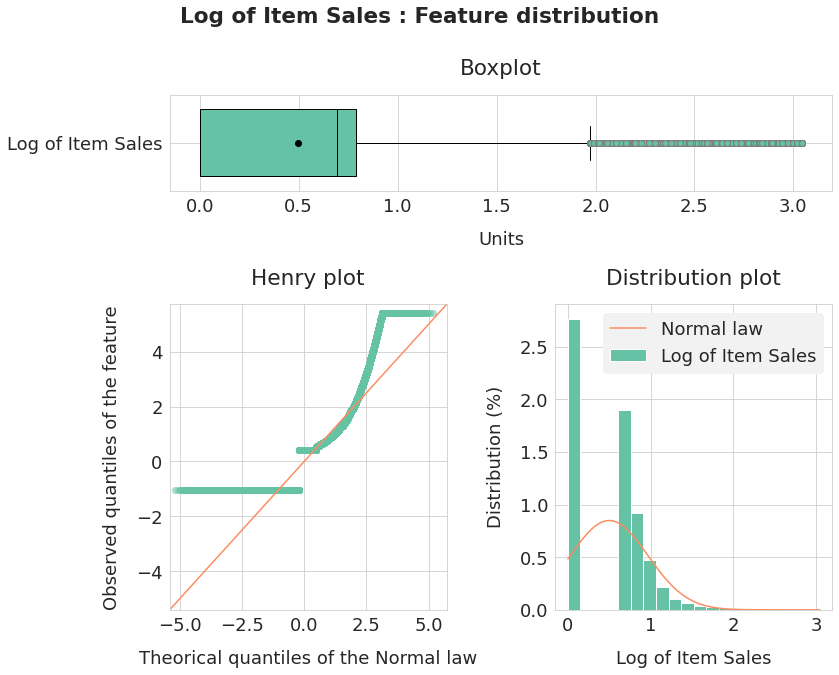

In [191]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [192]:
feature = np.log(
    data[data.month_item_sales > 0].\
    month_item_sales.clip(0, 20))
feature_name = "Log of Item Sales"
feature.describe()

count    5.650489e+06
mean     2.712101e-01
std      3.991693e-01
min      0.000000e+00
25%      0.000000e+00
50%      1.335314e-01
75%      4.054651e-01
max      2.995732e+00
Name: month_item_sales, dtype: float64

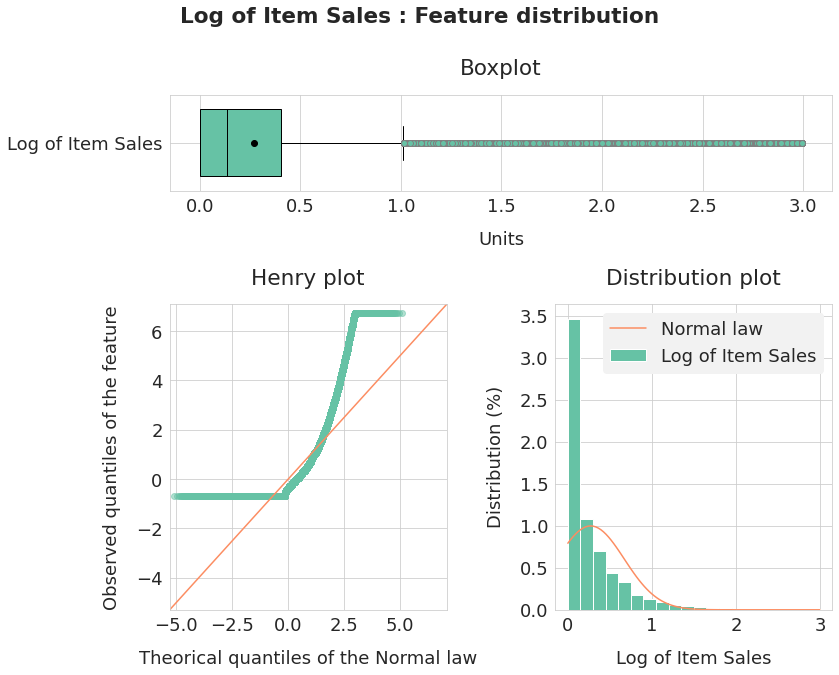

In [193]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [194]:
feature = data.month_item_price_change
feature_name = "Item Price Change"
feature.describe()

count    9.762047e+06
mean     6.982137e-02
std      1.310849e+01
min     -9.997499e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.979000e+03
Name: month_item_price_change, dtype: float64

In [195]:
test_normality(feature, feature_name)

Item Price Change - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


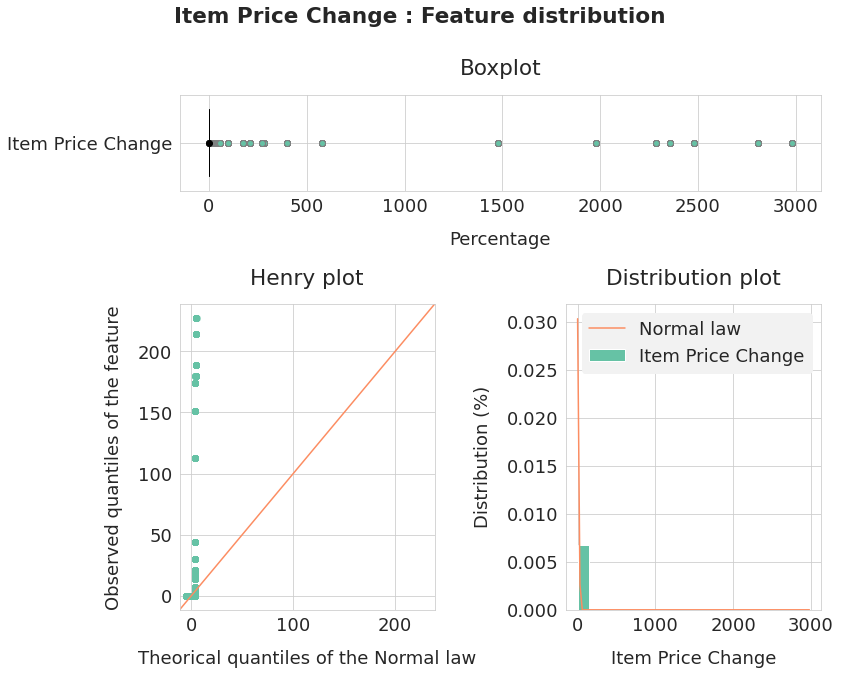

In [196]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [197]:
feature = data[data.month_item_price_change < 2].\
    month_item_price_change
feature_name = "Item Price Change"
feature.describe()

count    9.757834e+06
mean    -9.031653e-03
std      1.099275e-01
min     -9.997499e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.993326e+00
Name: month_item_price_change, dtype: float64

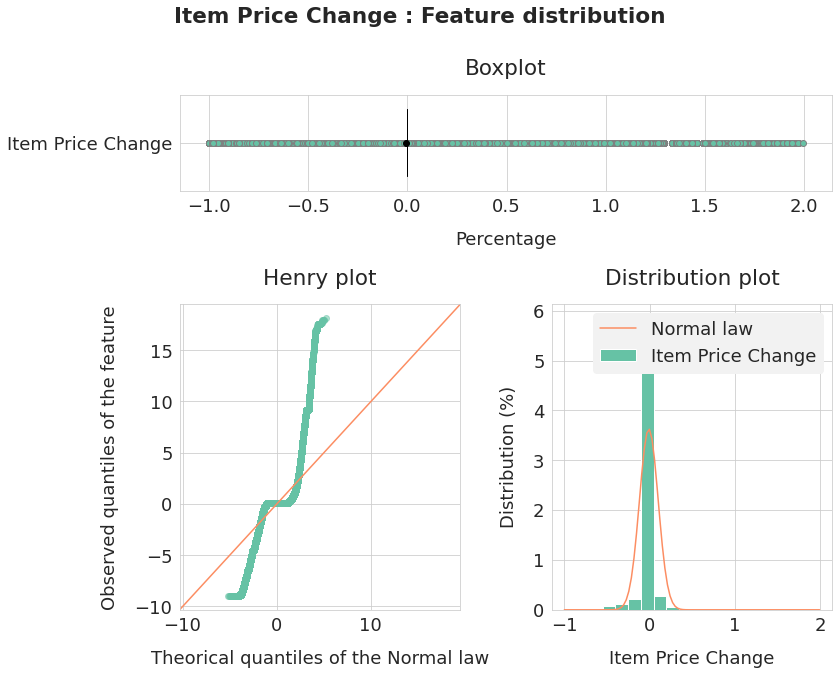

In [198]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [199]:
feature = data.month_item_price_change.clip(-1, 2)
feature_name = "Item Price Change"
feature.describe()

count    9.762047e+06
mean    -8.164444e-03
std      1.175793e-01
min     -9.997499e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.000000e+00
Name: month_item_price_change, dtype: float64

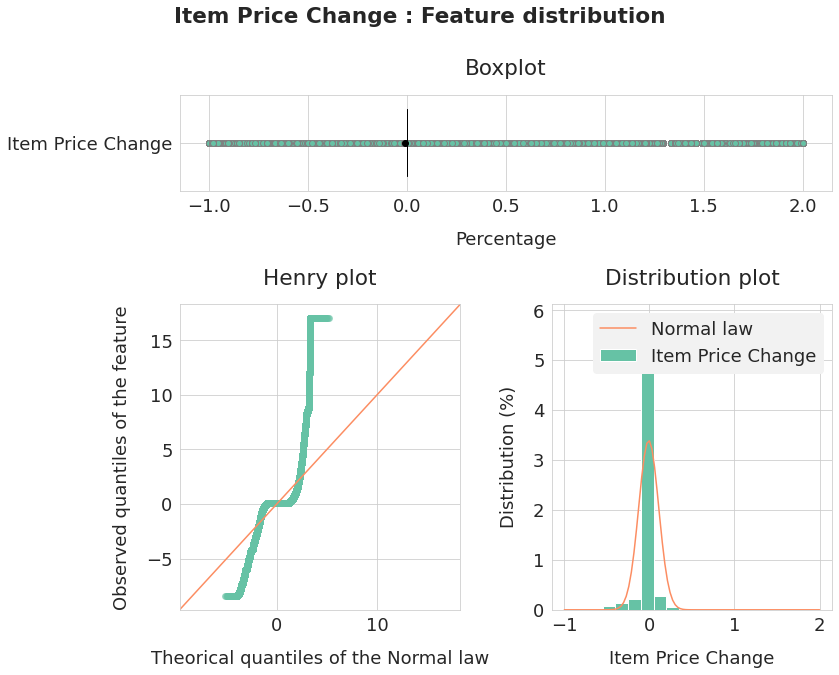

In [200]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [201]:
feature = data[data.month_item_sales_change > -1].\
    month_item_sales_change
feature_name = "Item Sales Change"
feature.describe()

count    9.060412e+06
mean     5.350817e-02
std      3.653639e-01
min     -9.983897e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.930000e+02
Name: month_item_sales_change, dtype: float64

In [202]:
test_normality(feature, feature_name)

Item Sales Change - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


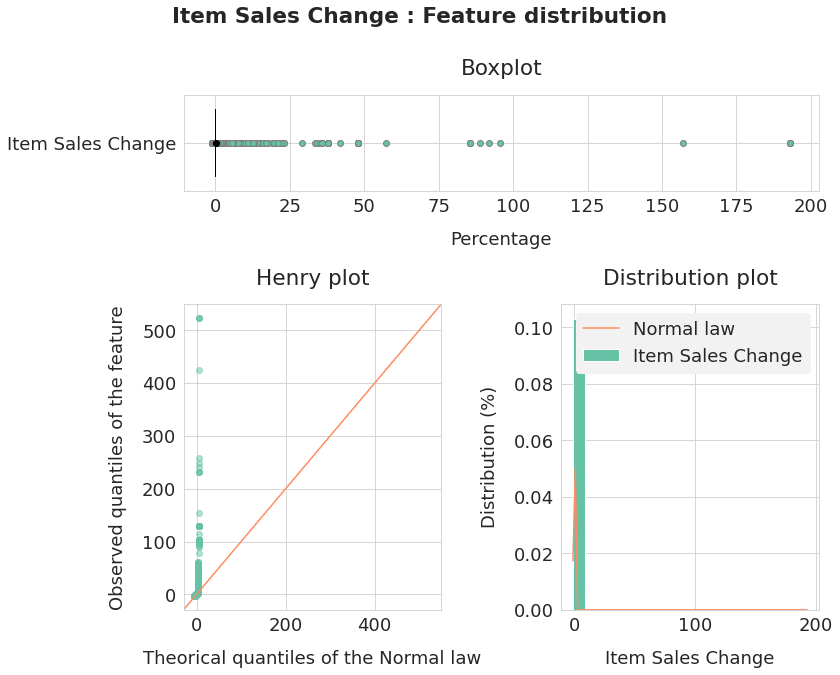

In [203]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [204]:
feature = data[(data.month_item_sales_change > -1) &
               (data.month_item_sales_change < 2)].\
    month_item_sales_change
feature_name = "Item Sales Change"
feature.describe()

count    9.046185e+06
mean     4.820210e-02
std      2.897426e-01
min     -9.983897e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.999430e+00
Name: month_item_sales_change, dtype: float64

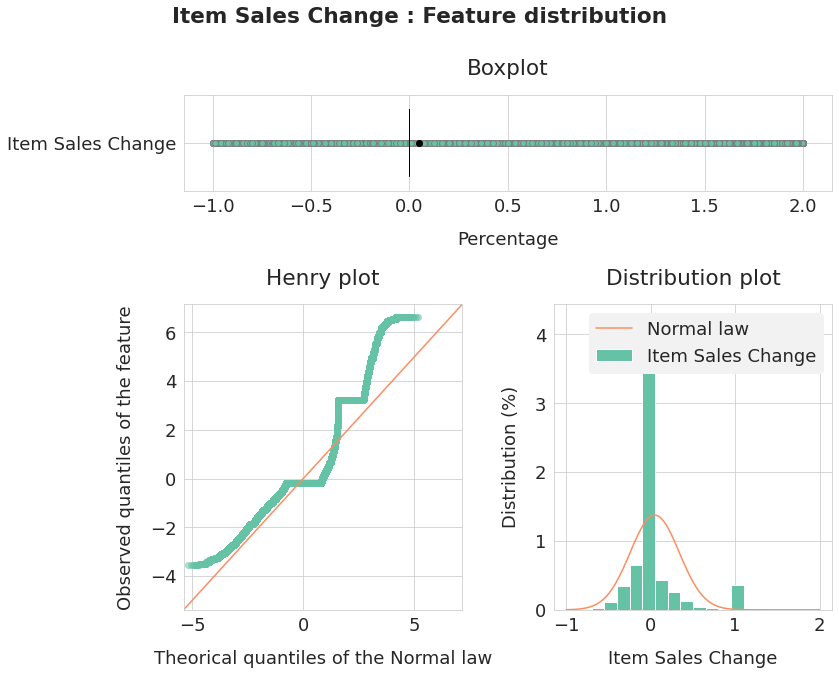

In [205]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [206]:
feature = data[data.month_item_sales_change > -1].\
    month_item_sales_change.clip(-1, 2)
feature_name = "Item Sales Change"
feature.describe()

count    9.060412e+06
mean     5.126715e-02
std      2.996551e-01
min     -9.983897e-01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.000000e+00
Name: month_item_sales_change, dtype: float64

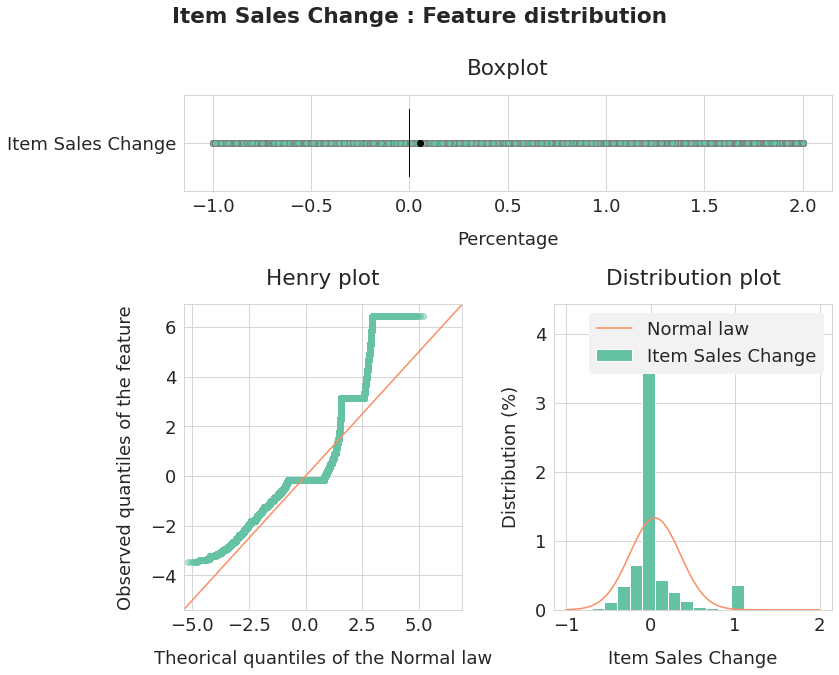

In [207]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [208]:
feature = data.month_item_sales_change.clip(-1, 2)
feature_name = "Item Sales Change"
feature.describe()

count    9.762047e+06
mean    -2.428551e-02
std      3.971842e-01
min     -1.000000e+00
25%     -6.666667e-02
50%      0.000000e+00
75%      0.000000e+00
max      2.000000e+00
Name: month_item_sales_change, dtype: float64

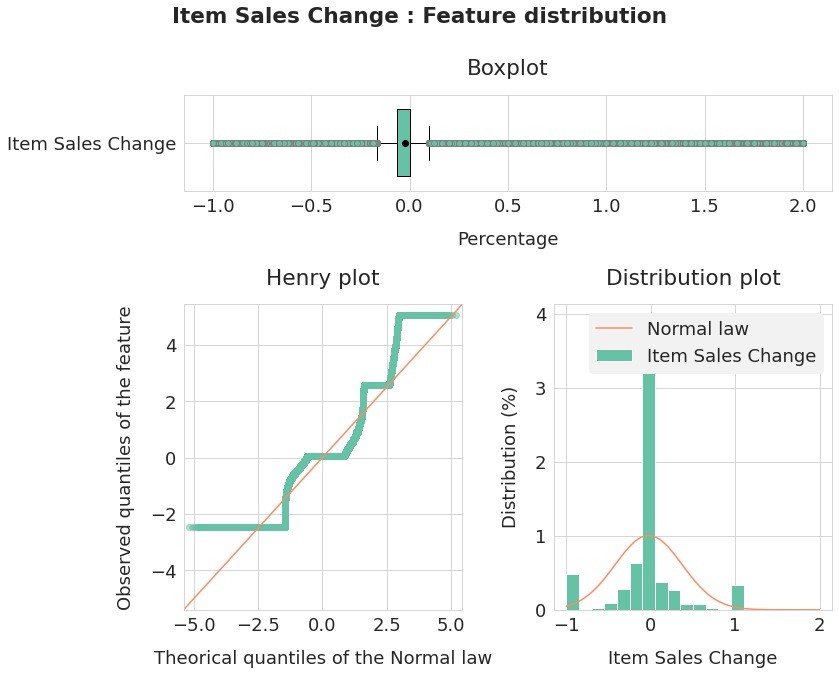

In [209]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [210]:
feature = data.month_item_relative_price
feature_name = "Item Relative Price"
feature.describe()

count    9.762047e+06
mean    -1.102908e-01
std      2.359343e-01
min     -9.996740e-01
25%     -2.159159e-01
50%      0.000000e+00
75%      1.458602e-02
max      8.884393e+00
Name: month_item_relative_price, dtype: float64

In [211]:
test_normality(feature, feature_name)

Item Relative Price - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


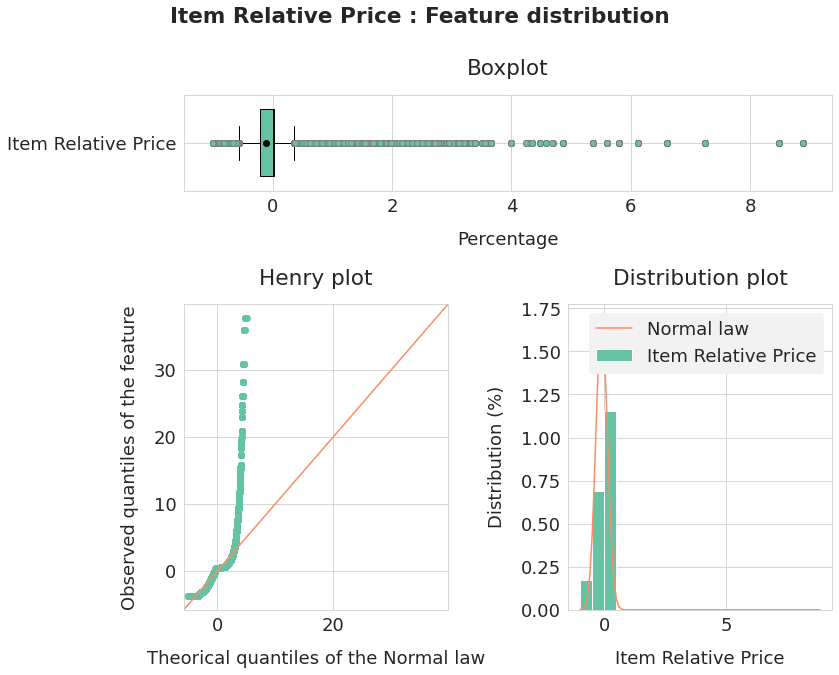

In [212]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [213]:
feature = data[data.month_item_relative_price < 2].\
    month_item_relative_price
feature_name = "Item Relative Price"
feature.describe()

count    9.760582e+06
mean    -1.107768e-01
std      2.323186e-01
min     -9.996740e-01
25%     -2.159533e-01
50%      0.000000e+00
75%      1.457381e-02
max      1.985811e+00
Name: month_item_relative_price, dtype: float64

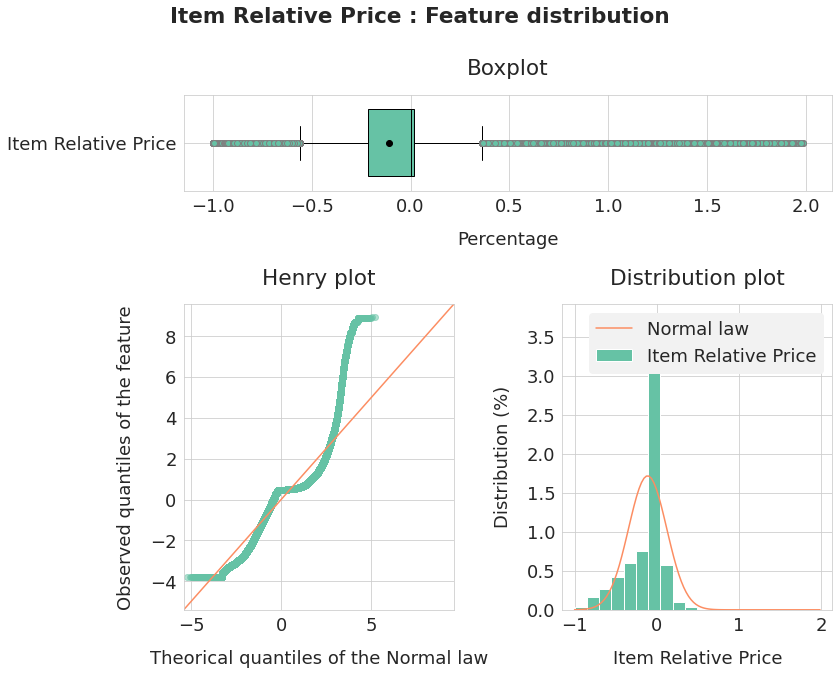

In [214]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [215]:
feature = data.month_item_relative_price.clip(-1, 2)
feature_name = "Item Relative Price"
feature.describe()

count    9.762047e+06
mean    -1.104561e-01
std      2.336449e-01
min     -9.996740e-01
25%     -2.159159e-01
50%      0.000000e+00
75%      1.458602e-02
max      2.000000e+00
Name: month_item_relative_price, dtype: float64

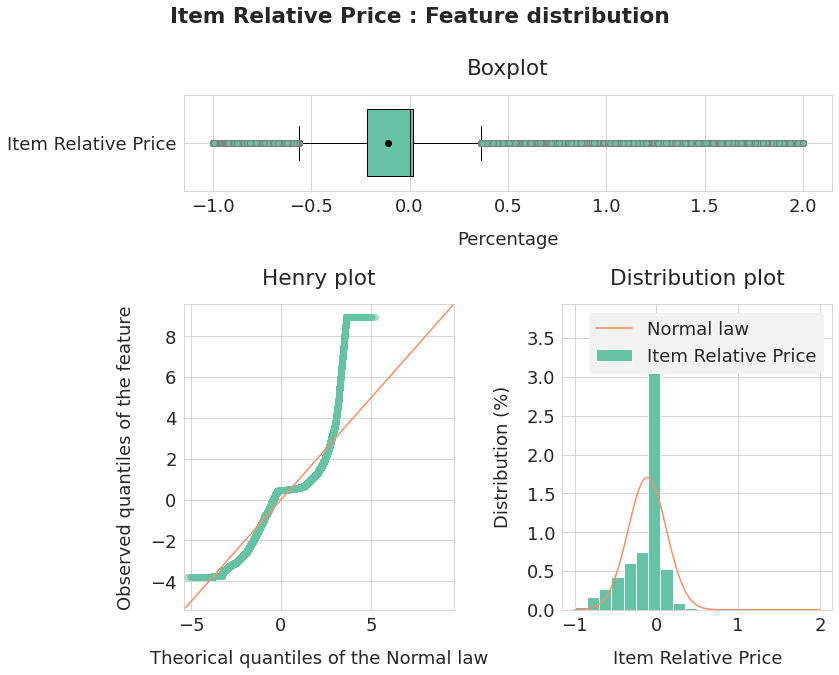

In [216]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [217]:
feature = my_signed_sqrt(
    data.month_item_relative_price.clip(-1, 2))
feature_name = "Sqrt of Item Relative Price"
feature.describe()

count    9.762047e+06
mean    -1.421556e-01
std      3.636824e-01
min     -9.998370e-01
25%     -4.646676e-01
50%      0.000000e+00
75%      1.207726e-01
max      1.414214e+00
Name: month_item_relative_price, dtype: float64

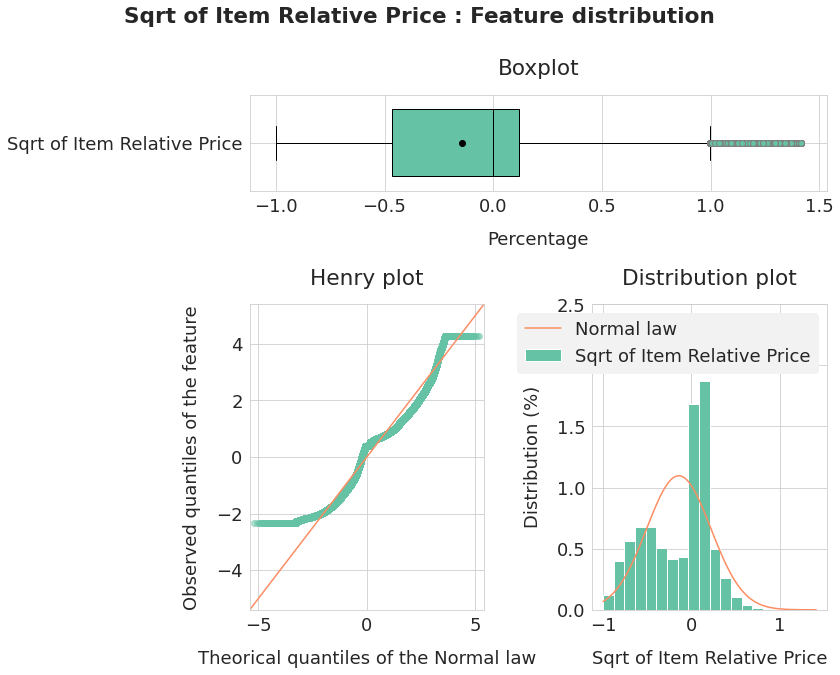

In [218]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=2.5)

The sign-corrected square root has a distribution closer to the normal law from the henry plot point of view, but not from the distribution plot view (multi-modal distribution).

In [219]:
feature = data[data.month_item_relative_sales > -1].\
    month_item_relative_sales
feature_name = "Item Relative Sales"
feature.describe()

count    5.650489e+06
mean    -5.206098e-02
std      3.781509e-01
min     -9.967846e-01
25%     -2.205962e-01
50%     -8.396947e-02
75%      4.637336e-02
max      2.184848e+01
Name: month_item_relative_sales, dtype: float64

In [220]:
test_normality(feature, feature_name)

Item Relative Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


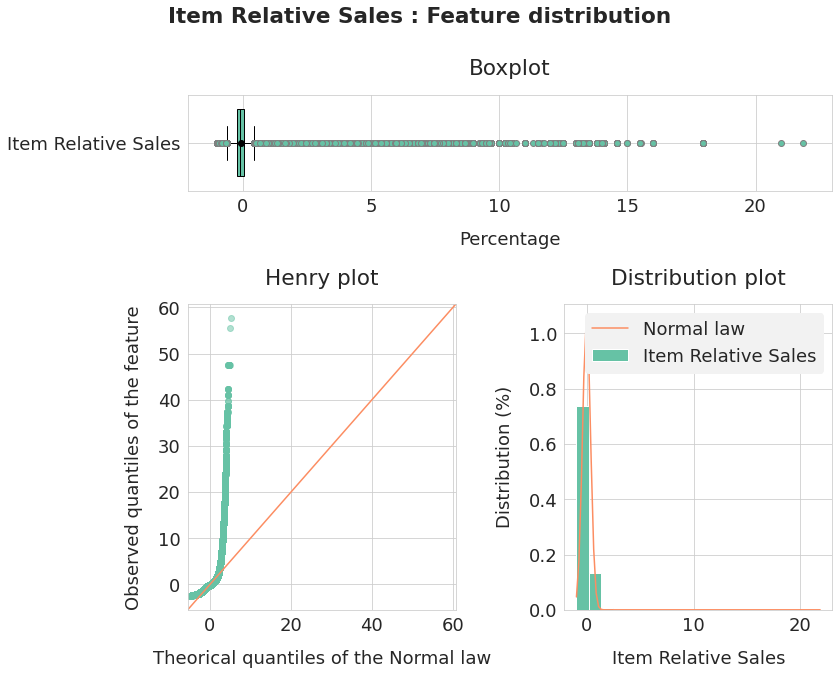

In [221]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [222]:
feature = data[(data.month_item_relative_sales > -1) &
               (data.month_item_relative_sales < 2)].\
    month_item_relative_sales
feature_name = "Item Relative Sales"
feature.describe()

count    5.627848e+06
mean    -6.523288e-02
std      2.986474e-01
min     -9.967846e-01
25%     -2.214615e-01
50%     -8.496732e-02
75%      4.347826e-02
max      1.994606e+00
Name: month_item_relative_sales, dtype: float64

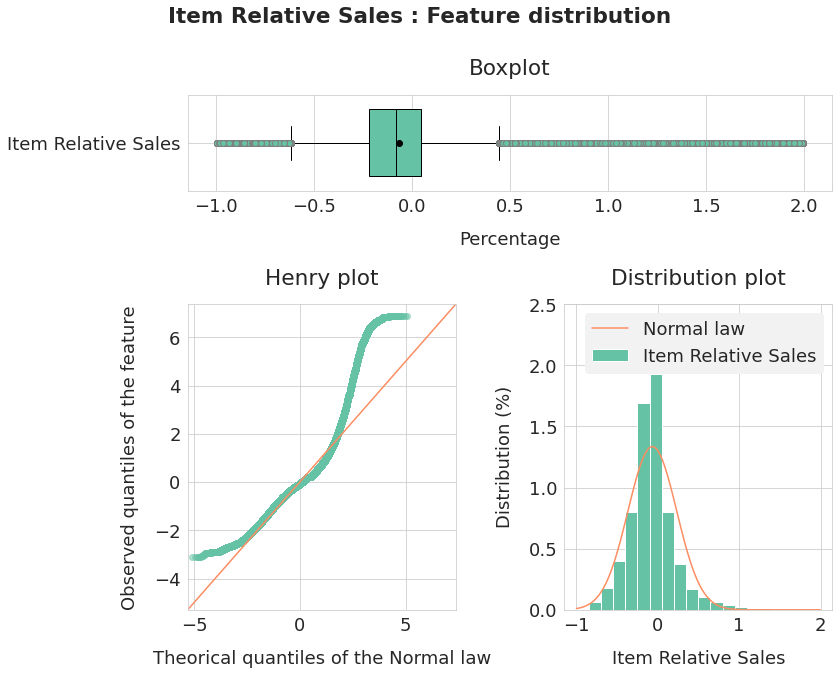

In [223]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=2.5)

In [224]:
feature = data[data.month_item_relative_sales > -1].\
    month_item_relative_sales.clip(-1, 2)
feature_name = "Item Relative Sales"
feature.describe()

count    5.650489e+06
mean    -5.696572e-02
std      3.251119e-01
min     -9.967846e-01
25%     -2.205962e-01
50%     -8.396947e-02
75%      4.637336e-02
max      2.000000e+00
Name: month_item_relative_sales, dtype: float64

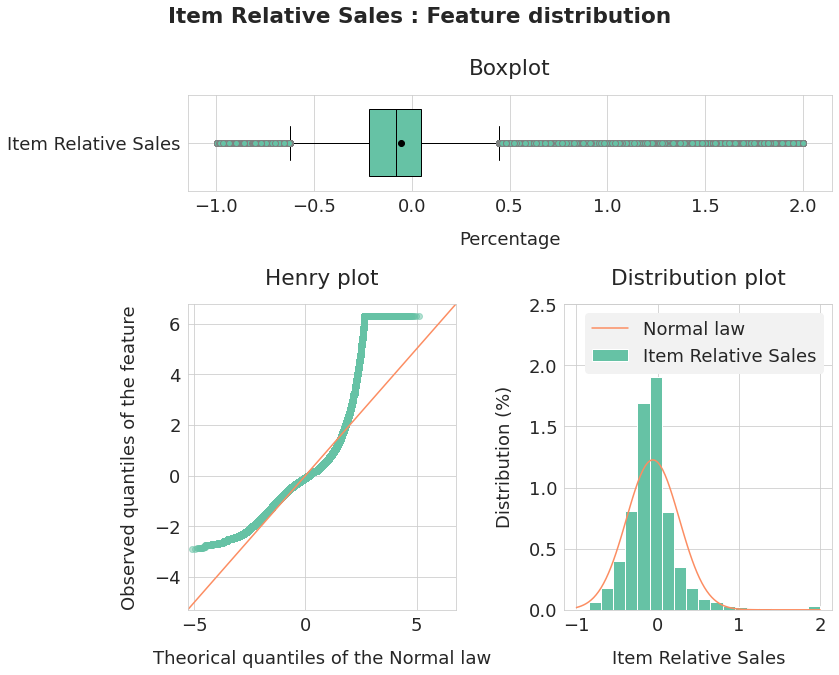

In [225]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=2.5)

In [226]:
feature = data.month_item_relative_sales.clip(-1, 2)
feature_name = "Item Relative Sales"
feature.describe()

count    9.762047e+06
mean    -4.540921e-01
std      5.124150e-01
min     -1.000000e+00
25%     -1.000000e+00
50%     -3.363111e-01
75%     -5.009687e-02
max      2.000000e+00
Name: month_item_relative_sales, dtype: float64

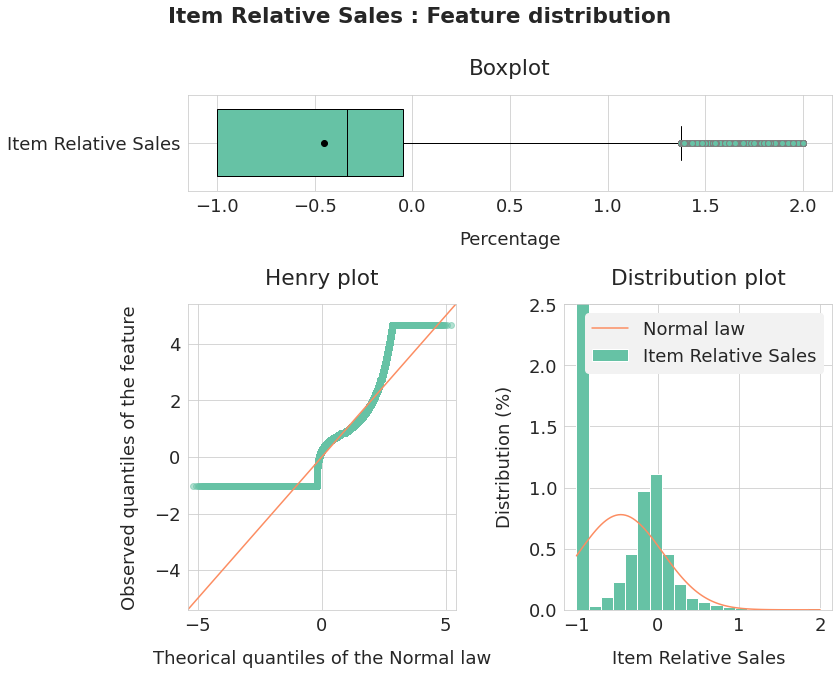

In [227]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=2.5)

Same shape of distribution as Item Relative Prices.

## 2.4. Shop data

In [228]:
feature = data.month_shop_sumsales
feature_name = "Shop Sales"
feature.describe()

count    9.762047e+06
mean     2.536532e+03
std      2.241318e+03
min      0.000000e+00
25%      1.182000e+03
50%      1.756000e+03
75%      3.037000e+03
max      1.631900e+04
Name: month_shop_sumsales, dtype: float64

In [229]:
test_normality(feature, feature_name)

Shop Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


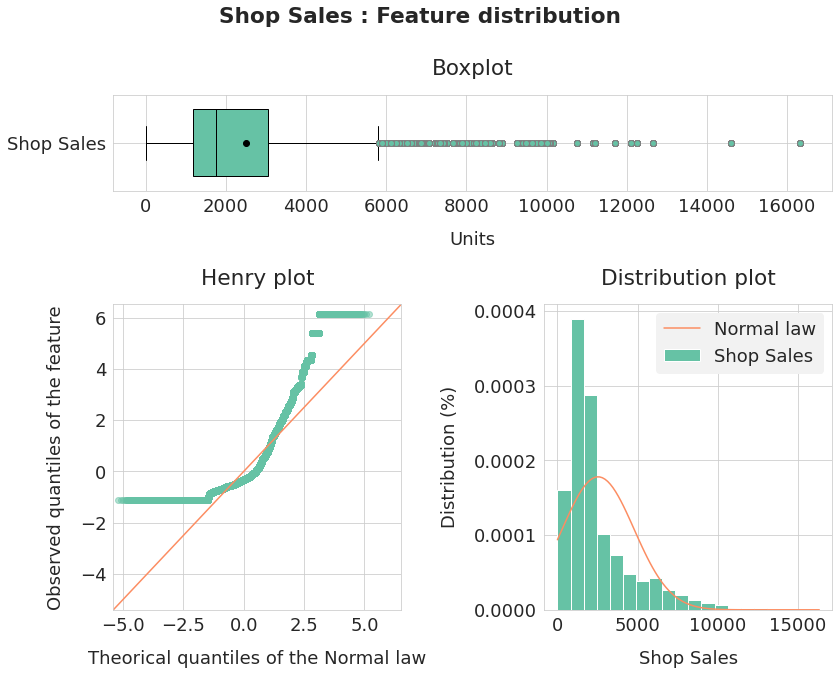

In [230]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [231]:
feature = data[data.month_shop_sumsales > 0].\
    month_shop_sumsales
feature_name = "Shop Sales"
feature.describe()

count    9.067949e+06
mean     2.730688e+03
std      2.199532e+03
min      2.000000e+00
25%      1.276000e+03
50%      1.860000e+03
75%      3.318000e+03
max      1.631900e+04
Name: month_shop_sumsales, dtype: float64

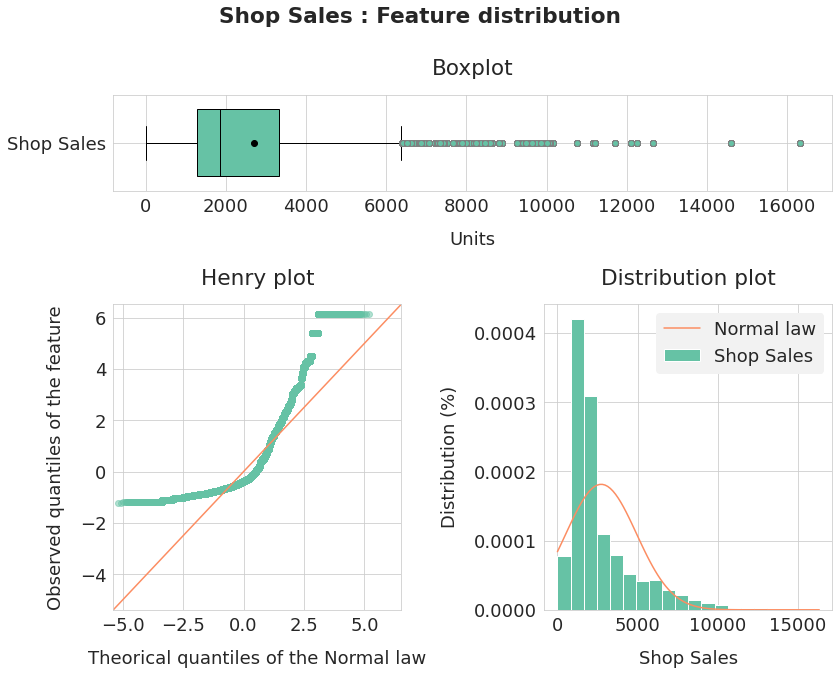

In [232]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [233]:
feature = np.log(
    data[data.month_shop_sumsales > 0].\
    month_shop_sumsales)
feature_name = "Log of Shop Sales"
feature.describe()

count    9.067949e+06
mean     7.960544e+00
std      7.599801e-01
min      6.931472e-01
25%      7.151485e+00
50%      7.528332e+00
75%      8.107118e+00
max      9.700086e+00
Name: month_shop_sumsales, dtype: float64

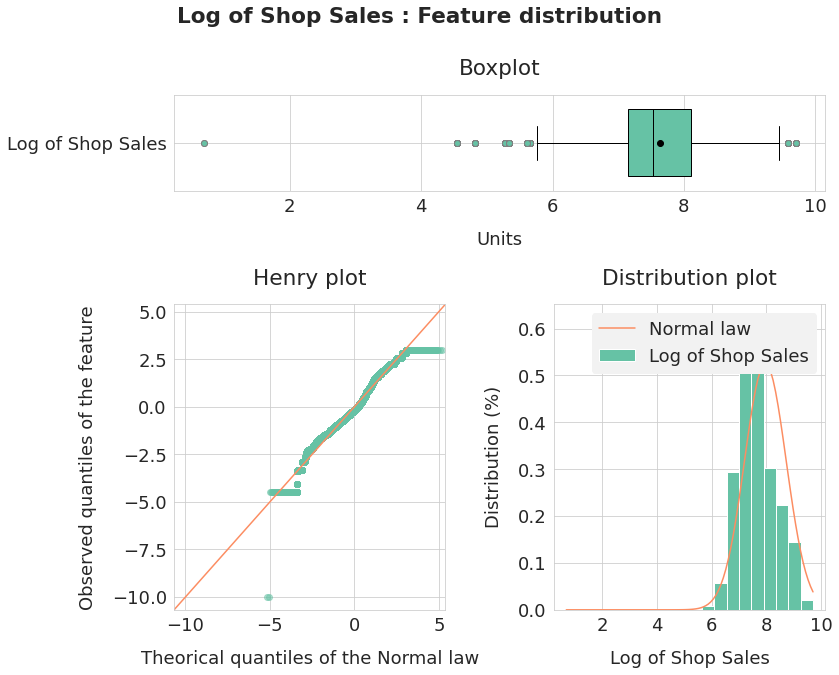

In [234]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [235]:
feature = np.log1p(
    data.month_shop_sumsales)
feature_name = "Log of Shop Sales"
feature.describe()

count    9.762047e+06
mean     7.394626e+00
std      2.077938e+00
min      0.000000e+00
25%      7.075809e+00
50%      7.471363e+00
75%      8.018954e+00
max      9.700147e+00
Name: month_shop_sumsales, dtype: float64

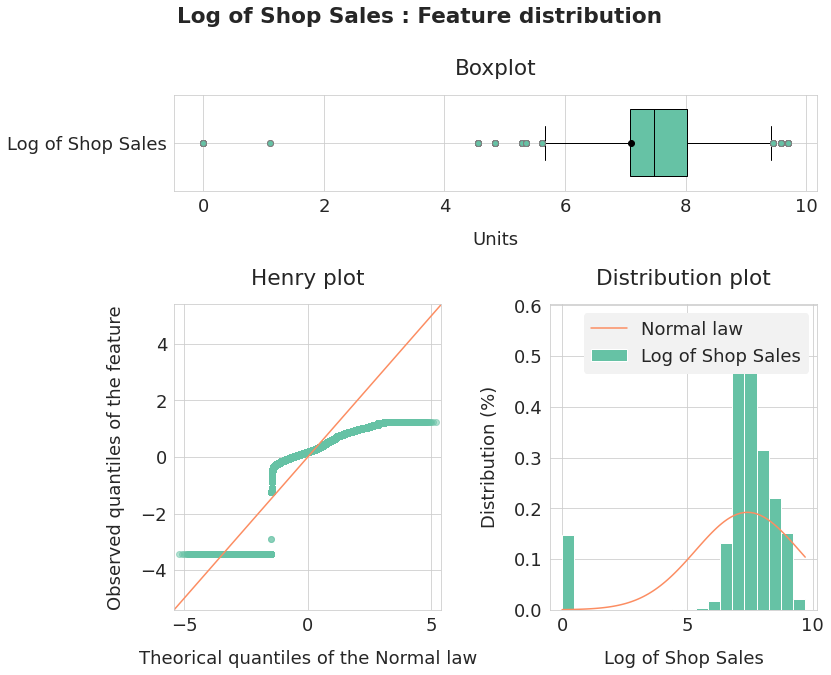

In [236]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [237]:
feature = data.month_shop_revenue
feature_name = "Shop Revenue"
feature.describe()

count     9762047.0
mean      2419769.5
std       2072760.0
min             0.0
25%       1147139.0
50%       1759971.0
75%       3106929.0
max      15707866.0
Name: month_shop_revenue, dtype: float64

In [238]:
test_normality(feature, feature_name)

Shop Revenue - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


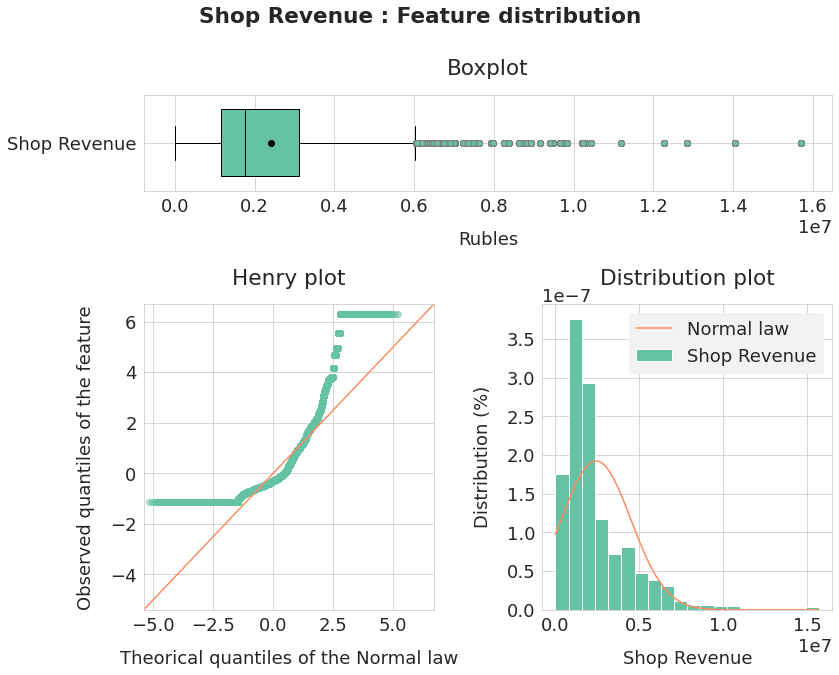

In [239]:
graph_quant_feature(feature, feature_name,
                    "Rubles")

In [240]:
feature = data[data.month_shop_revenue > 0].\
    month_shop_revenue
feature_name = "Shop Revenue"
feature.describe()

count     9067949.00
mean      2604988.50
std       2060375.75
min           154.00
25%       1267356.00
50%       1838961.00
75%       3304036.75
max      15707866.00
Name: month_shop_revenue, dtype: float64

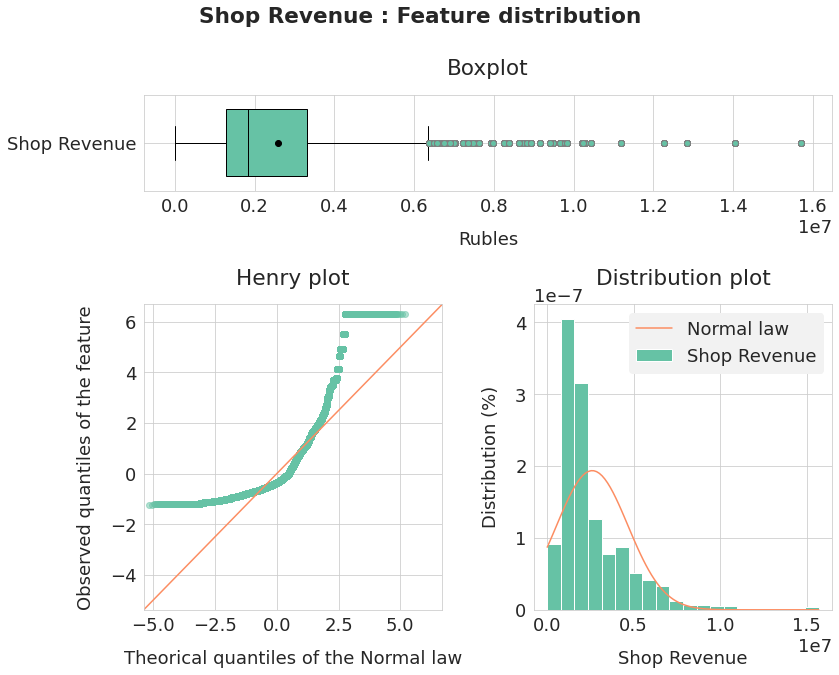

In [241]:
graph_quant_feature(feature, feature_name,
                    "Rubles")

In [242]:
feature = np.log(
    data[data.month_shop_revenue > 0].\
    month_shop_revenue)
feature_name = "Log of Shop Revenue"
feature.describe()

count    9.067949e+06
mean     1.542581e+01
std      1.154714e+00
min      5.036952e+00
25%      1.405244e+01
50%      1.442471e+01
75%      1.501066e+01
max      1.656967e+01
Name: month_shop_revenue, dtype: float64

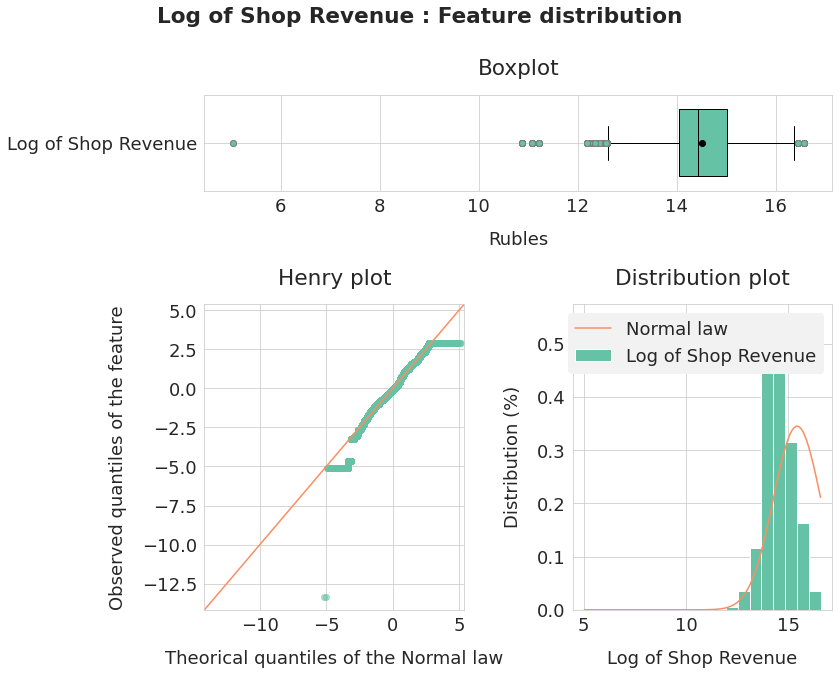

In [243]:
graph_quant_feature(feature, feature_name,
                    "Rubles")

In [244]:
feature = np.log1p(
    data.month_shop_revenue)
feature_name = "Log of Shop Revenue"
feature.describe()

count    9.762047e+06
mean     1.432901e+01
std      3.873075e+00
min      0.000000e+00
25%      1.395278e+01
50%      1.438081e+01
75%      1.494915e+01
max      1.656967e+01
Name: month_shop_revenue, dtype: float64

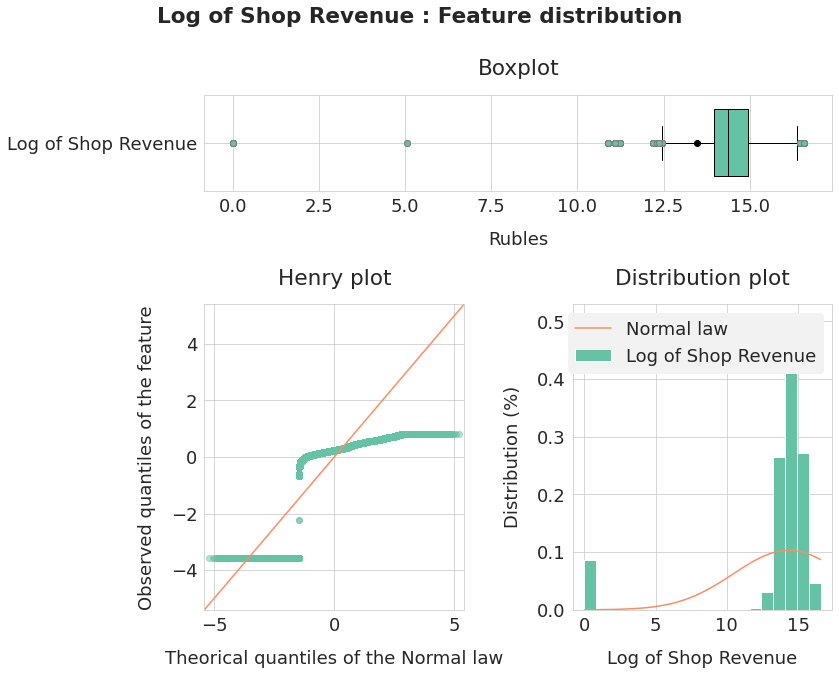

In [245]:
graph_quant_feature(feature, feature_name,
                    "Rubles")

In [246]:
feature = data[data.month_shop_sumsales_change > -1].\
    month_shop_sumsales_change
feature_name = "Shop sales Change"
feature.describe()

count    9.681705e+06
mean     1.454867e-02
std      1.005880e+00
min     -9.370816e-01
25%     -1.202517e-01
50%      0.000000e+00
75%      9.842237e-02
max      1.830000e+02
Name: month_shop_sumsales_change, dtype: float64

In [247]:
test_normality(feature, feature_name)

Shop sales Change - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


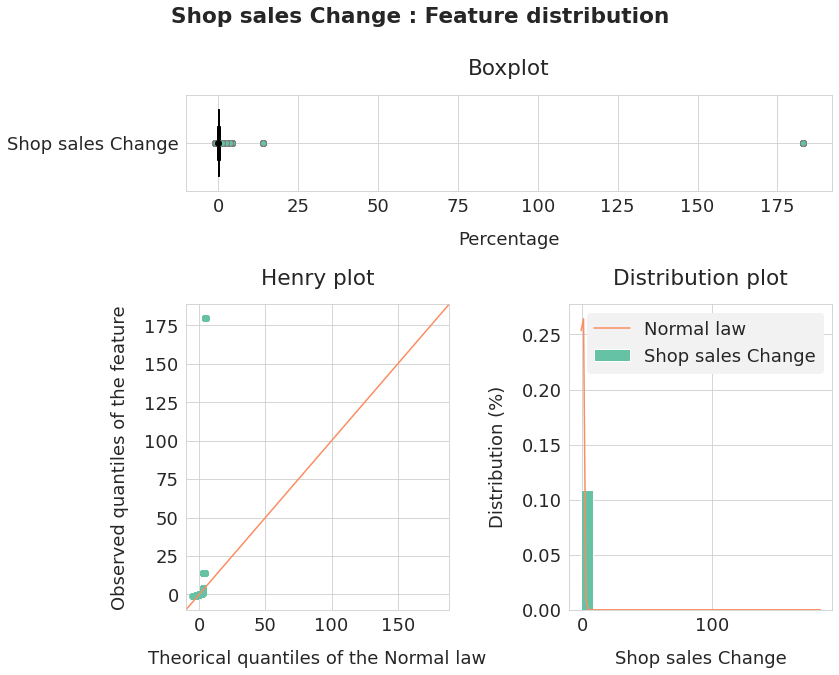

In [248]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [249]:
feature = data[(data.month_shop_sumsales_change > -1) &
    (data.month_shop_sumsales_change < 2)].month_shop_sumsales_change
feature_name = "Shop sales Change"
feature.describe()

count    9.657738e+06
mean    -2.756717e-03
std      2.154542e-01
min     -9.370816e-01
25%     -1.205433e-01
50%      0.000000e+00
75%      9.707972e-02
max      1.496193e+00
Name: month_shop_sumsales_change, dtype: float64

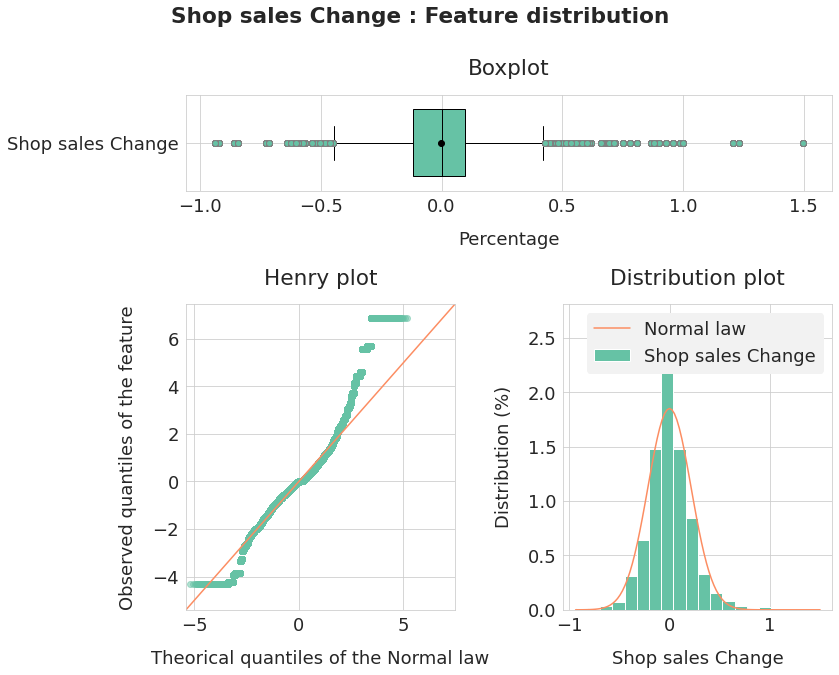

In [250]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [251]:
feature = data[data.month_shop_sumsales_change > -1].\
    month_shop_sumsales_change.clip(-1, 2)
feature_name = "Shop sales Change"
feature.describe()

count    9.681705e+06
mean     2.186258e-03
std      2.364679e-01
min     -9.370816e-01
25%     -1.202517e-01
50%      0.000000e+00
75%      9.842237e-02
max      2.000000e+00
Name: month_shop_sumsales_change, dtype: float64

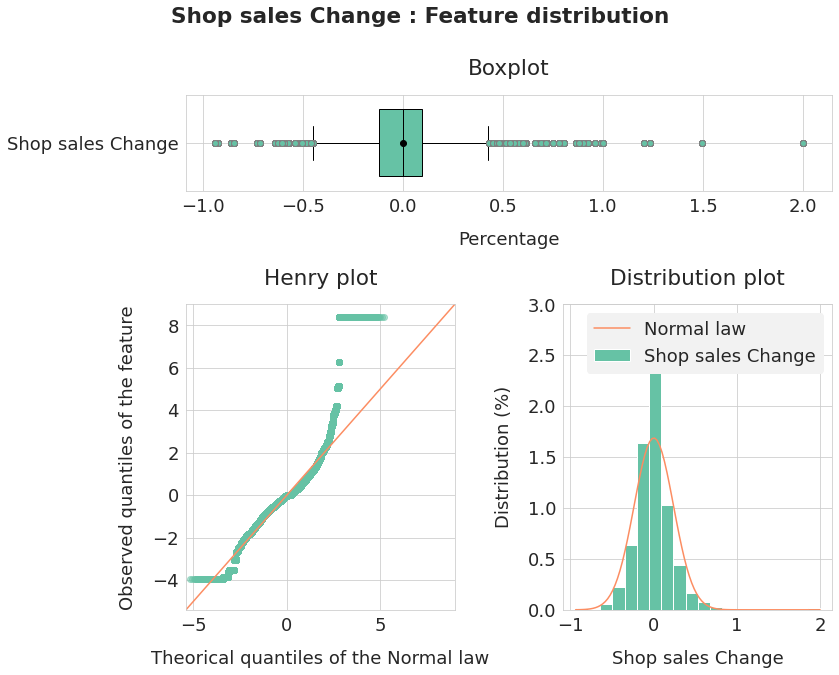

In [252]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=3.0)

In [253]:
feature = data.month_shop_sumsales_change.clip(-1, 2)
feature_name = "Shop sales Change"
feature.describe()

count    9.762047e+06
mean    -6.118754e-03
std      2.524829e-01
min     -1.000000e+00
25%     -1.231273e-01
50%     -2.138580e-04
75%      9.707972e-02
max      2.000000e+00
Name: month_shop_sumsales_change, dtype: float64

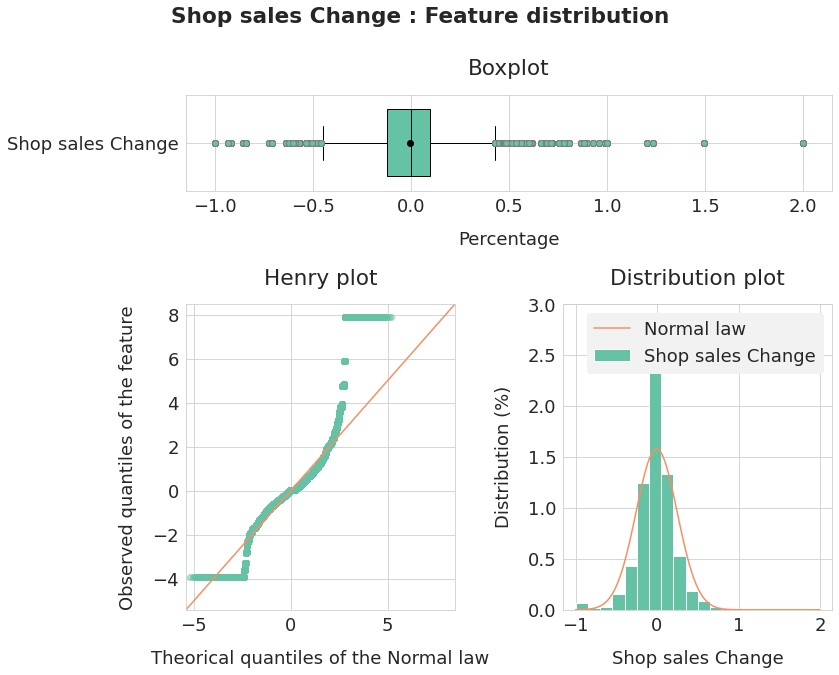

In [254]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=3.0)

In [255]:
feature = data[data.month_shop_revenue_change > -1].\
    month_shop_revenue_change
feature_name = "Shop Revenue Change"
feature.describe()

count    9.681705e+06
mean     1.294973e-01
std      1.466513e+01
min     -9.447168e-01
25%     -1.444595e-01
50%      0.000000e+00
75%      1.841983e-01
max      2.873701e+03
Name: month_shop_revenue_change, dtype: float64

In [256]:
test_normality(feature, feature_name)

Shop Revenue Change - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


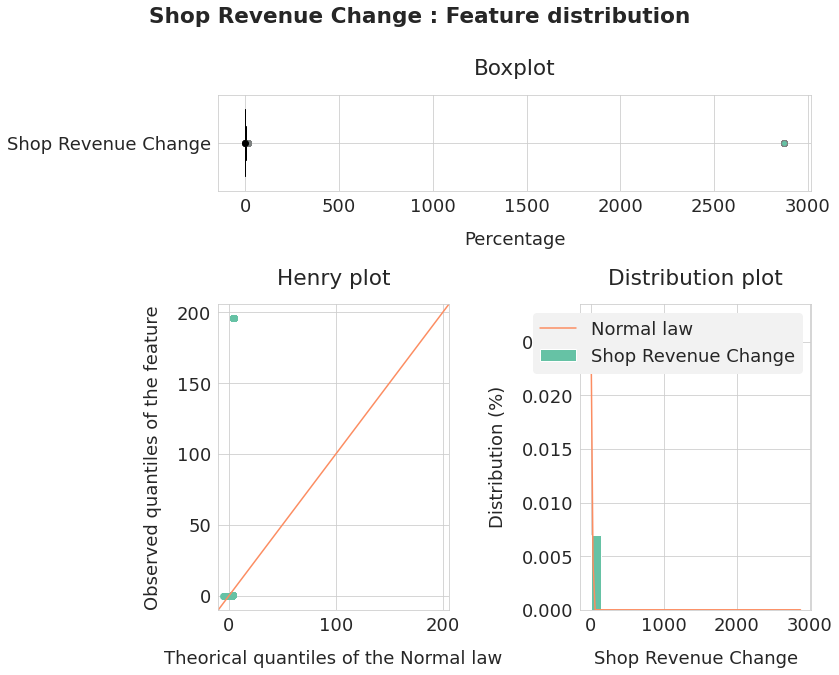

In [257]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [258]:
feature = data[(data.month_shop_revenue_change > -1) &
               (data.month_shop_revenue_change < 2)].\
    month_shop_revenue_change
feature_name = "Shop Revenue Change"
feature.describe()

count    9.646594e+06
mean     3.637647e-02
std      3.225640e-01
min     -9.447168e-01
25%     -1.448355e-01
50%      0.000000e+00
75%      1.803596e-01
max      1.690307e+00
Name: month_shop_revenue_change, dtype: float64

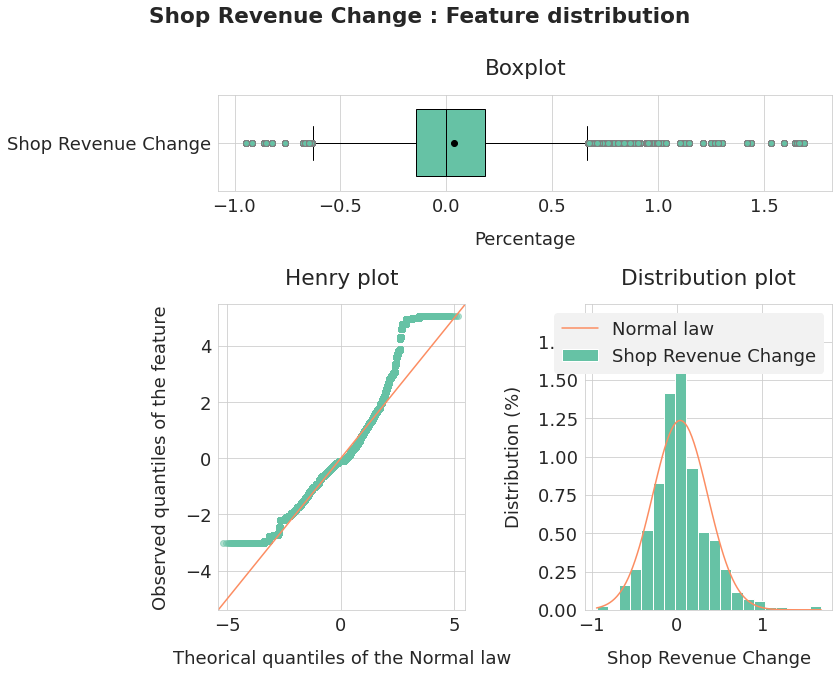

In [259]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [260]:
feature = data[data.month_shop_revenue_change > -1].\
    month_shop_revenue_change.clip(-1, 2)
feature_name = "Shop Revenue Change"
feature.describe()

count    9.681705e+06
mean     4.383830e-02
std      3.420991e-01
min     -9.447168e-01
25%     -1.444595e-01
50%      0.000000e+00
75%      1.841983e-01
max      2.000000e+00
Name: month_shop_revenue_change, dtype: float64

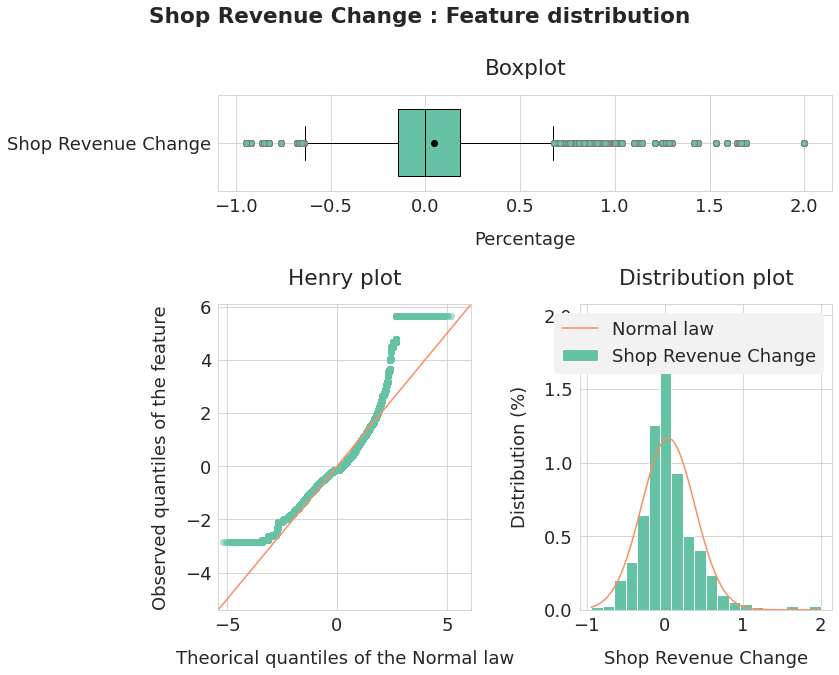

In [261]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [262]:
feature = data.month_shop_revenue_change.clip(-1, 2)
feature_name = "Shop Revenue Change"
feature.describe()

count    9.762047e+06
mean     3.504902e-02
std      3.531120e-01
min     -1.000000e+00
25%     -1.493524e-01
50%      0.000000e+00
75%      1.804456e-01
max      2.000000e+00
Name: month_shop_revenue_change, dtype: float64

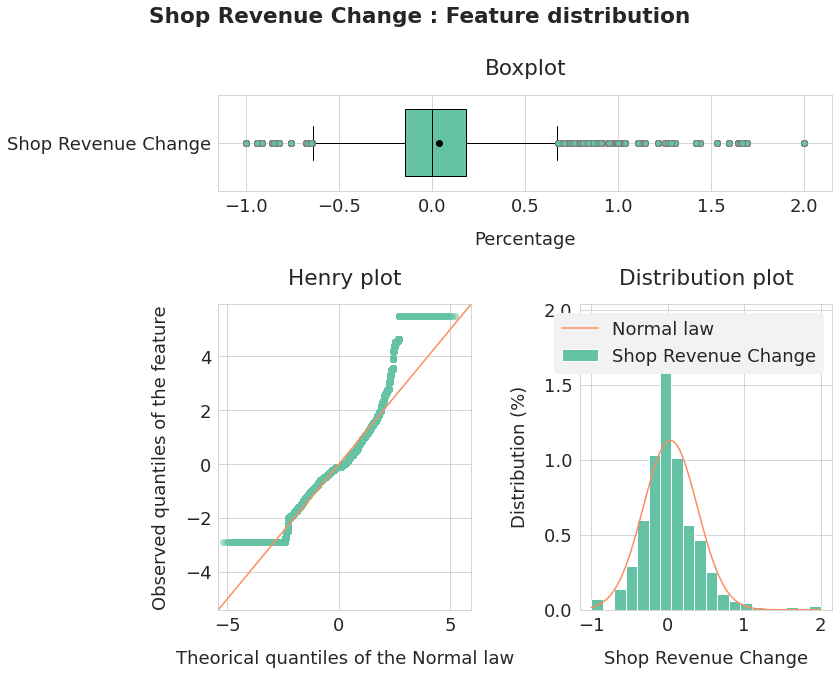

In [263]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [264]:
feature = data[data.month_shop_relative_sumsales > -1].\
    month_shop_relative_sumsales
feature_name = "Shop Relative Sales"
feature.describe()

count    9.067949e+06
mean    -1.434549e-01
std      2.791221e-01
min     -9.291481e-01
25%     -3.181246e-01
50%     -1.761799e-01
75%     -1.432387e-02
max      5.309834e+00
Name: month_shop_relative_sumsales, dtype: float64

In [265]:
test_normality(feature, feature_name)

Shop Relative Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


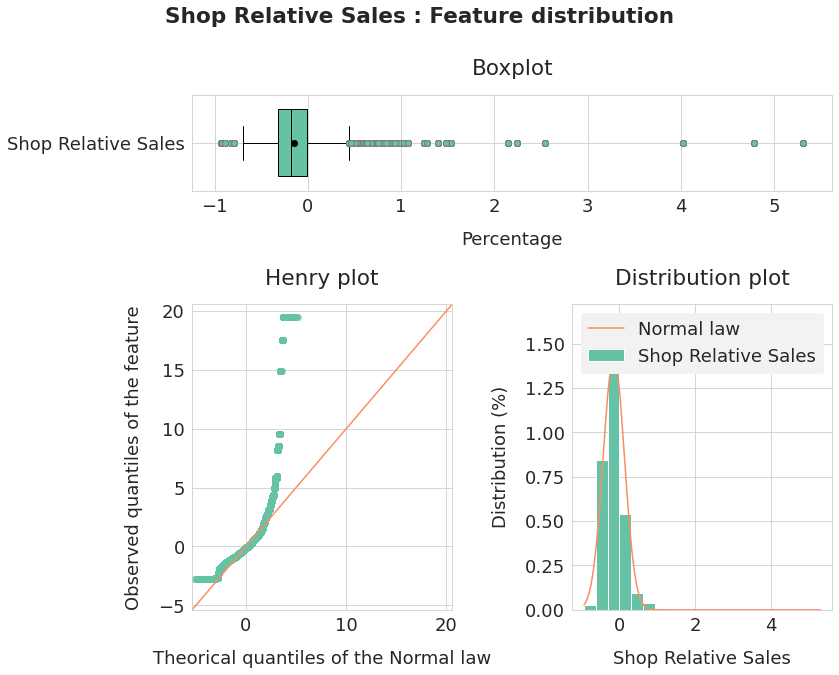

In [266]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [267]:
feature = data[(data.month_shop_relative_sumsales > -1) &
               (data.month_shop_relative_sumsales < 2)].\
    month_shop_relative_sumsales
feature_name = "Shop Relative Sales"
feature.describe()

count    9.059687e+06
mean    -1.464526e-01
std      2.572652e-01
min     -9.291481e-01
25%     -3.181246e-01
50%     -1.763534e-01
75%     -1.439612e-02
max      1.534331e+00
Name: month_shop_relative_sumsales, dtype: float64

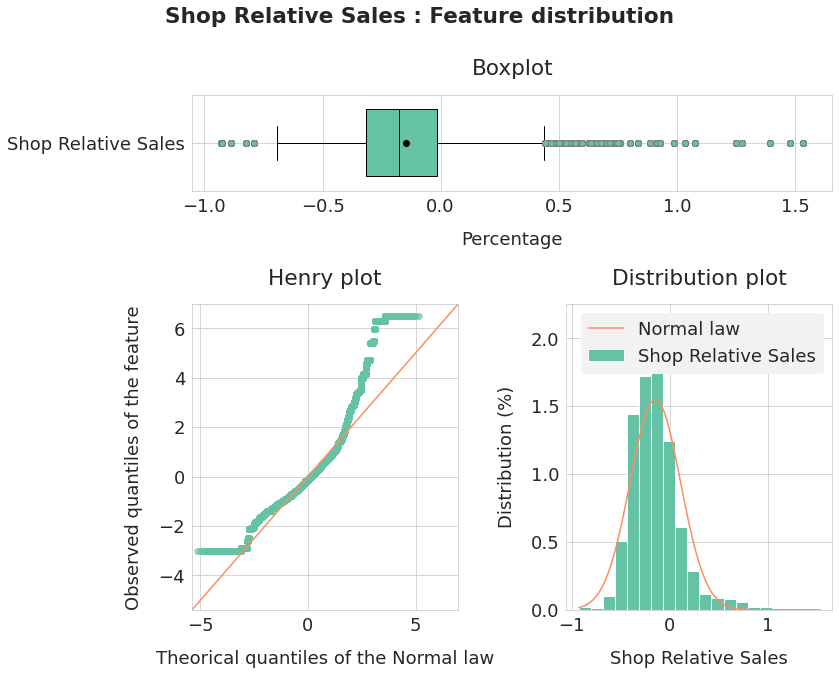

In [268]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=2.25)

In [269]:
feature = data[data.month_shop_relative_sumsales > -1].\
    month_shop_relative_sumsales.clip(-1, 2)
feature_name = "Shop Relative Sales"
feature.describe()

count    9.067949e+06
mean    -1.445660e-01
std      2.657044e-01
min     -9.291481e-01
25%     -3.181246e-01
50%     -1.761799e-01
75%     -1.432387e-02
max      2.000000e+00
Name: month_shop_relative_sumsales, dtype: float64

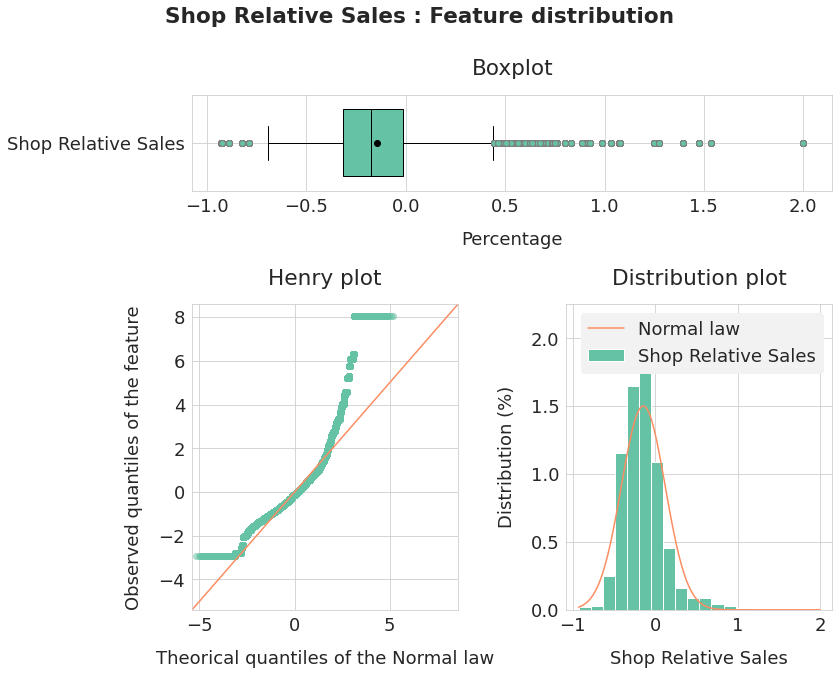

In [270]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=2.25)

In [271]:
feature = data.month_shop_relative_sumsales.clip(-1, 2)
feature_name = "Shop Relative Sales"
feature.describe()

count    9.762047e+06
mean    -2.046907e-01
std      3.342178e-01
min     -1.000000e+00
25%     -3.532872e-01
50%     -1.934932e-01
75%     -3.507299e-02
max      2.000000e+00
Name: month_shop_relative_sumsales, dtype: float64

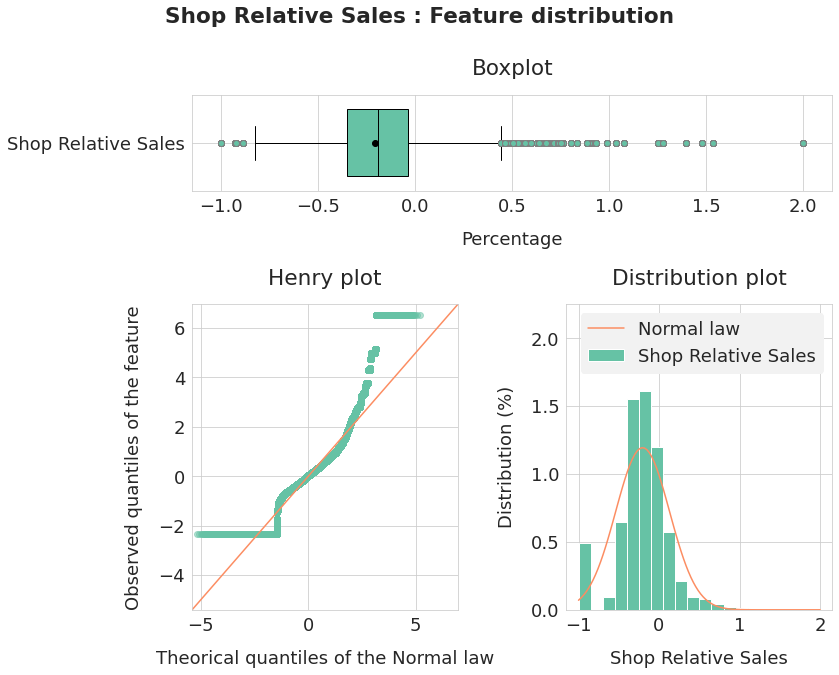

In [272]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=2.25)

In [273]:
feature = data[data.month_shop_relative_revenue > -1].\
    month_shop_relative_revenue
feature_name = "Shop Relative Revenue"
feature.describe()

count    9.067949e+06
mean     2.034559e-02
std      4.175610e-01
min     -9.356070e-01
25%     -2.314162e-01
50%     -7.425298e-02
75%      1.225985e-01
max      5.902542e+00
Name: month_shop_relative_revenue, dtype: float64

In [274]:
test_normality(feature, feature_name)

Shop Relative Revenue - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


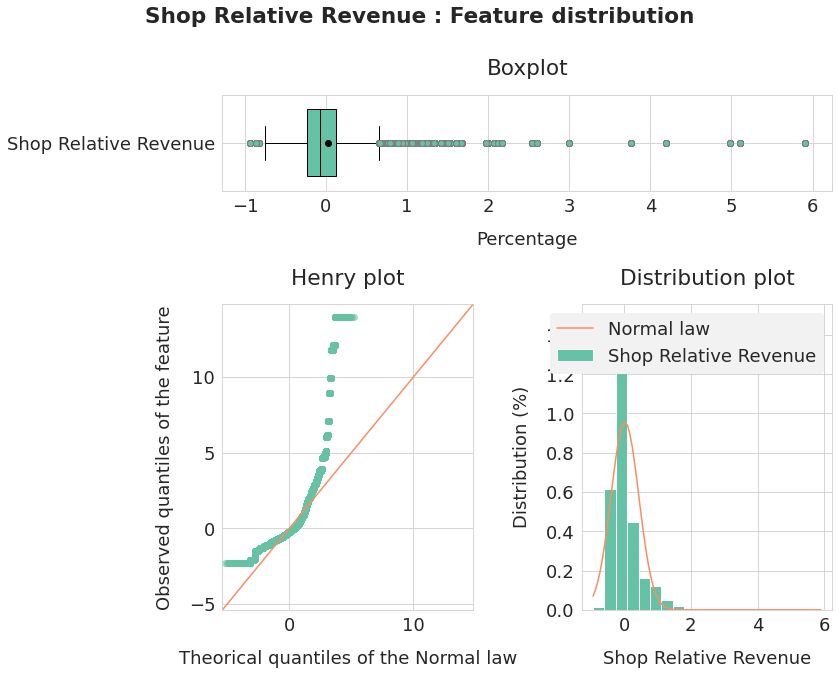

In [275]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [276]:
feature = data[(data.month_shop_relative_revenue > -1) &
               (data.month_shop_relative_revenue < 2)].\
    month_shop_relative_revenue
feature_name = "Shop Relative Revenue"
feature.describe()

count    9.049928e+06
mean     1.382839e-02
std      3.894839e-01
min     -9.356070e-01
25%     -2.326583e-01
50%     -7.456221e-02
75%      1.212858e-01
max      1.996498e+00
Name: month_shop_relative_revenue, dtype: float64

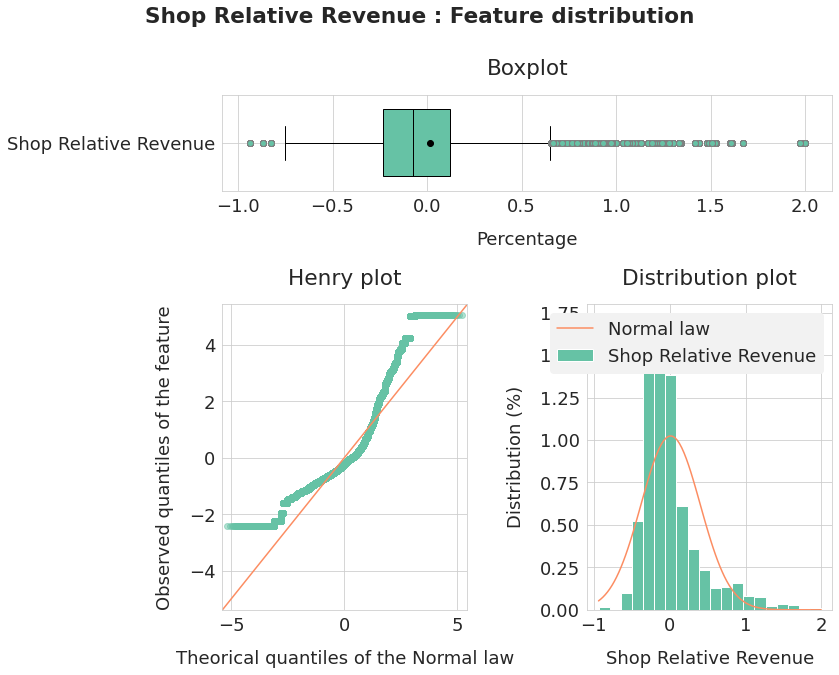

In [277]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=1.8)

In [278]:
feature = data[data.month_shop_relative_revenue > -1].\
    month_shop_relative_revenue.clip(-1, 2)
feature_name = "Shop Relative Revenue"
feature.describe()

count    9.067949e+06
mean     1.780306e-02
std      3.984616e-01
min     -9.356070e-01
25%     -2.314162e-01
50%     -7.425298e-02
75%      1.225985e-01
max      2.000000e+00
Name: month_shop_relative_revenue, dtype: float64

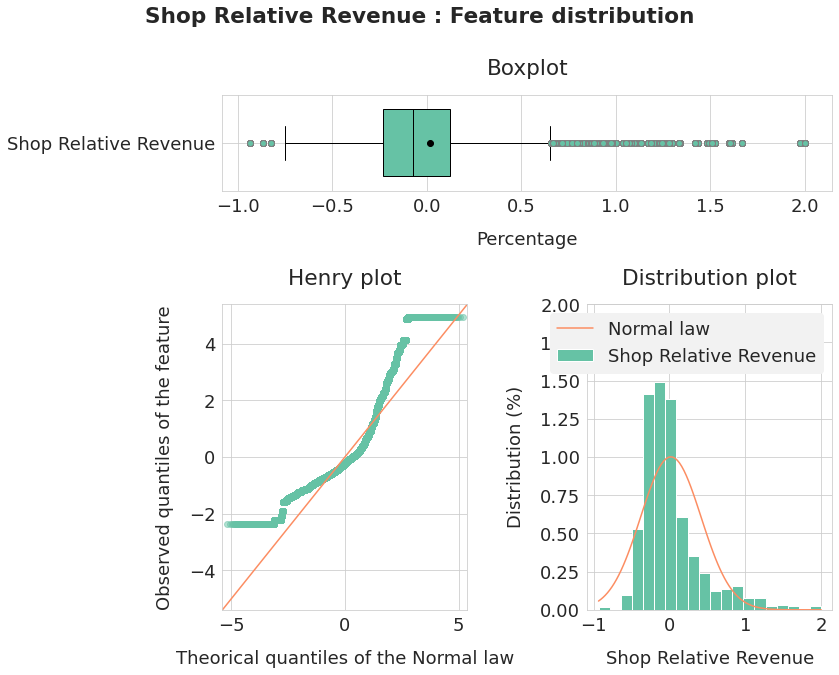

In [279]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=2)

In [280]:
feature = data.month_shop_relative_revenue.clip(-1, 2)
feature_name = "Shop Relative Revenue"
feature.describe()

count    9.762047e+06
mean    -5.476071e-02
std      4.608715e-01
min     -1.000000e+00
25%     -2.684692e-01
50%     -1.007808e-01
75%      9.816732e-02
max      2.000000e+00
Name: month_shop_relative_revenue, dtype: float64

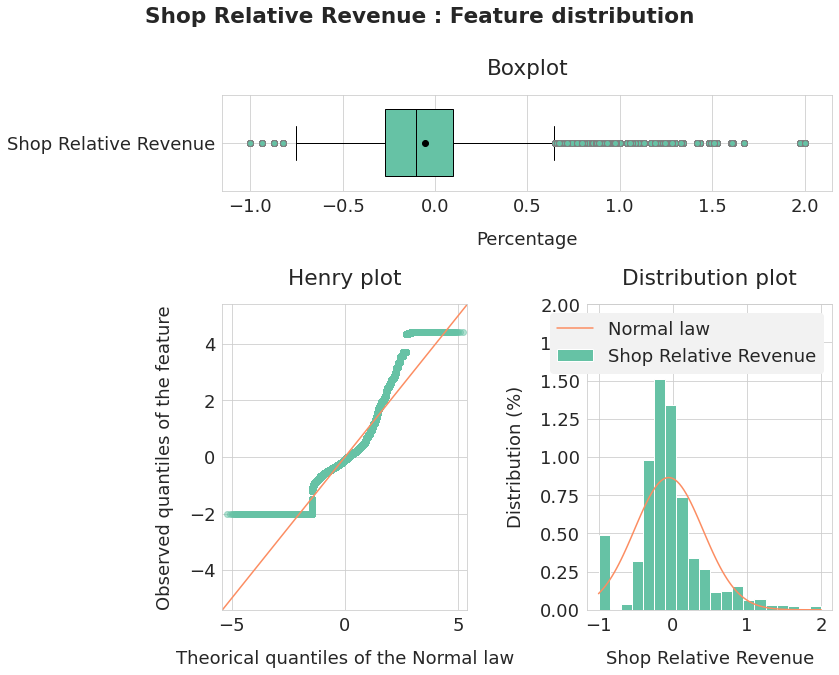

In [281]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=2)

In [282]:
feature = np.log1p(
    data[data.month_shop_relative_revenue > -1].\
    month_shop_relative_revenue.clip(-1, 2))
feature_name = "Log of Shop Relative Revenue"
feature.describe()

count    9.067949e+06
mean    -4.788946e-02
std      3.553144e-01
min     -2.742751e+00
25%     -2.632057e-01
50%     -7.715428e-02
75%      1.156461e-01
max      1.098612e+00
Name: month_shop_relative_revenue, dtype: float64

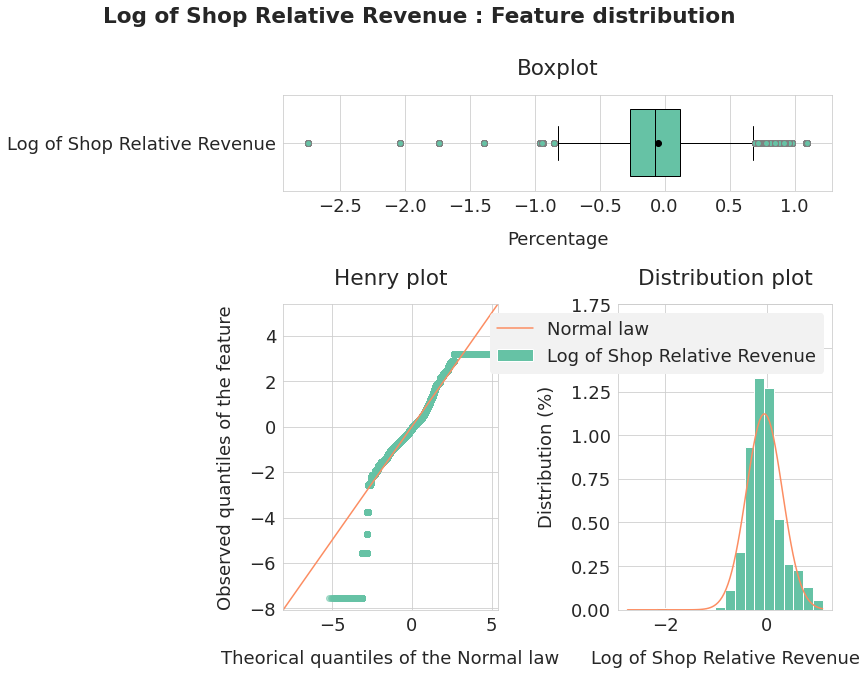

In [283]:
graph_quant_feature(feature, feature_name,
                    "Percentage", ymax=1.75)

## 2.5. Category Data

In [284]:
feature = data.month_category_sales
feature_name = "Category Sales"
feature.describe()

count    9.762047e+06
mean     1.945245e+00
std      3.681703e+00
min      0.000000e+00
25%      1.410127e+00
50%      1.667069e+00
75%      1.969742e+00
max      8.548333e+02
Name: month_category_sales, dtype: float64

In [285]:
test_normality(feature, feature_name)

Category Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


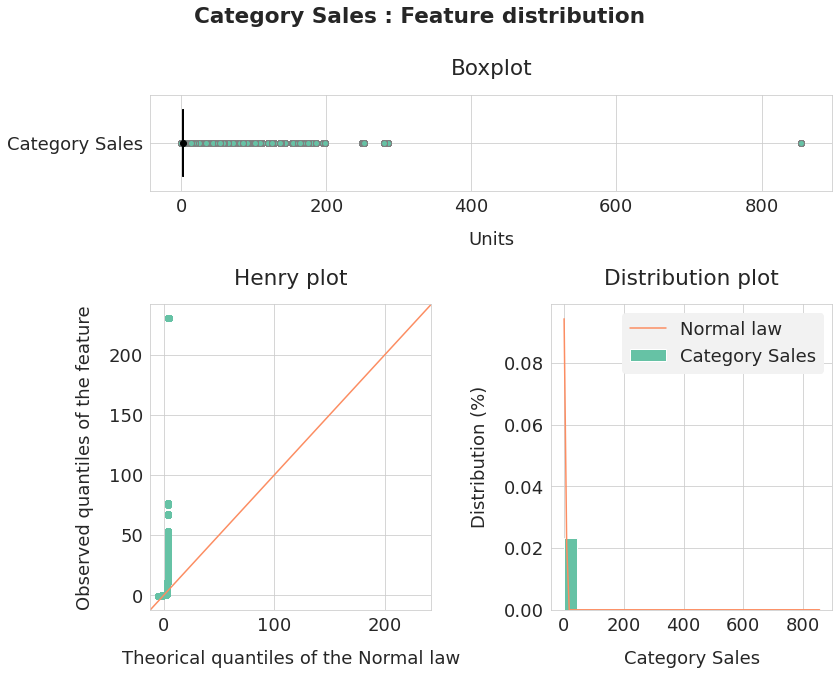

In [286]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [287]:
feature = data[data.month_category_sales < 20].\
    month_category_sales
feature_name = "Category Sales"
feature.describe()

count    9.758279e+06
mean     1.899777e+00
std      8.058790e-01
min      0.000000e+00
25%      1.410127e+00
50%      1.662730e+00
75%      1.969371e+00
max      1.950000e+01
Name: month_category_sales, dtype: float64

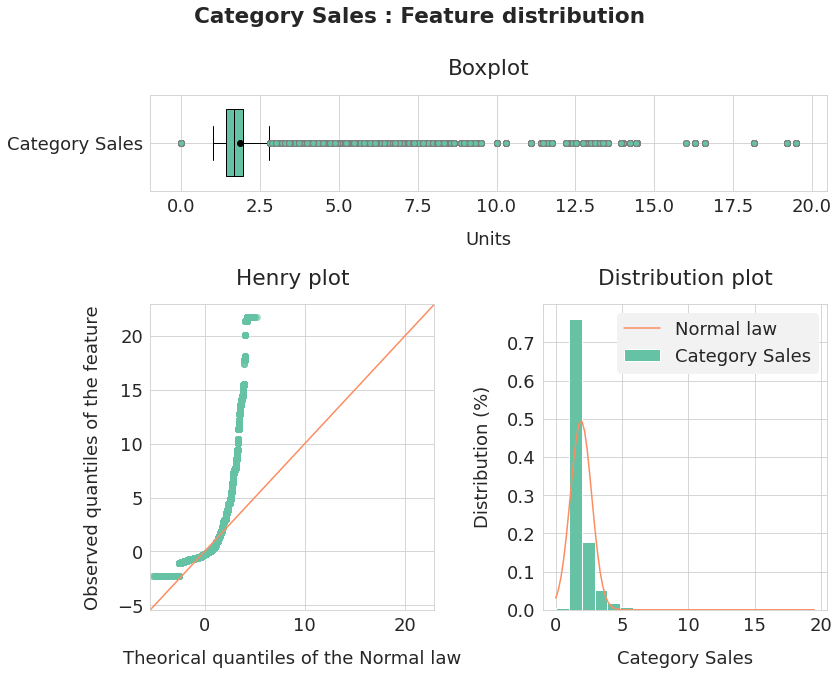

In [288]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [289]:
feature = data.month_category_sales.clip(0, 20)
feature_name = "Category Sales"
feature.describe()

count    9.762047e+06
mean     1.907443e+00
std      8.806353e-01
min      0.000000e+00
25%      1.410127e+00
50%      1.667069e+00
75%      1.969742e+00
max      2.000000e+01
Name: month_category_sales, dtype: float64

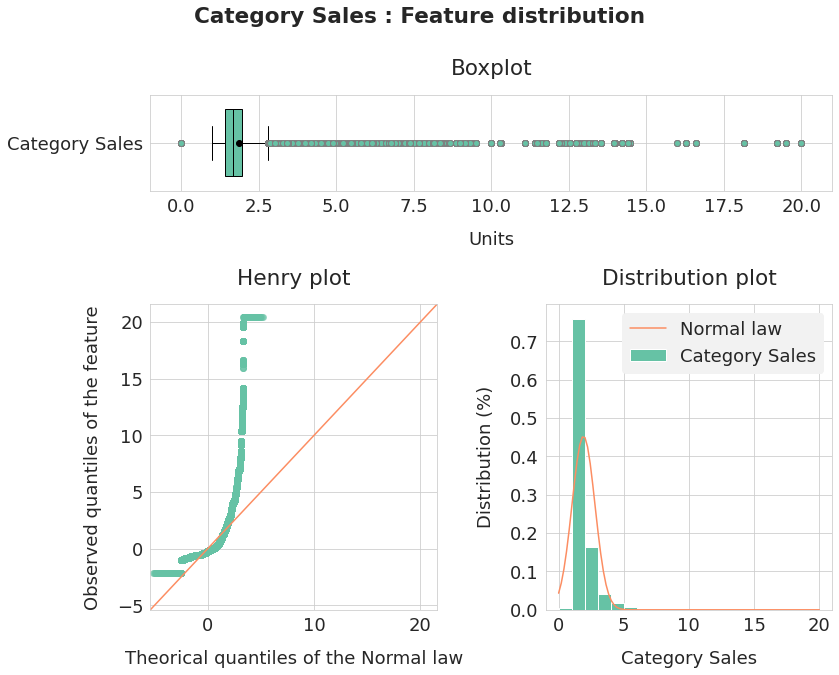

In [290]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [291]:
feature = np.log1p(data.month_category_sales.clip(0, 20))
feature_name = "Log of Category Sales"
feature.describe()

count    9.762047e+06
mean     1.041844e+00
std      2.288896e-01
min      0.000000e+00
25%      8.796793e-01
50%      9.809803e-01
75%      1.088475e+00
max      3.044523e+00
Name: month_category_sales, dtype: float64

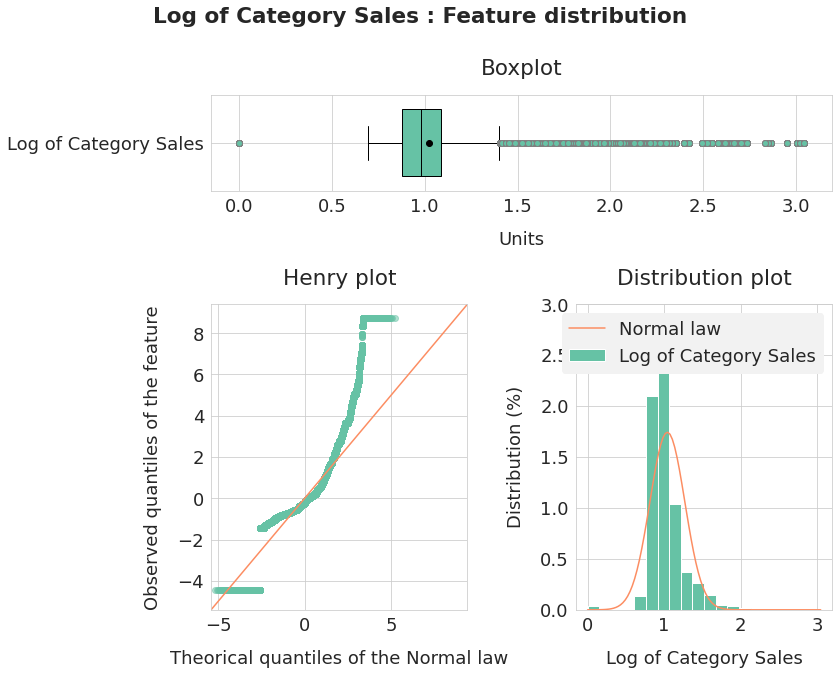

In [292]:
graph_quant_feature(feature, feature_name,
                    "Units", ymax=3)

In [293]:
feature = data.month_category_sales_change
feature_name = "Category Sales Change"
feature.describe()

count    9.762047e+06
mean     9.283917e-03
std      2.010076e-01
min     -1.000000e+00
25%     -6.021832e-02
50%     -7.883518e-03
75%      5.549436e-02
max      9.619047e+00
Name: month_category_sales_change, dtype: float64

In [294]:
test_normality(feature, feature_name)

Category Sales Change - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


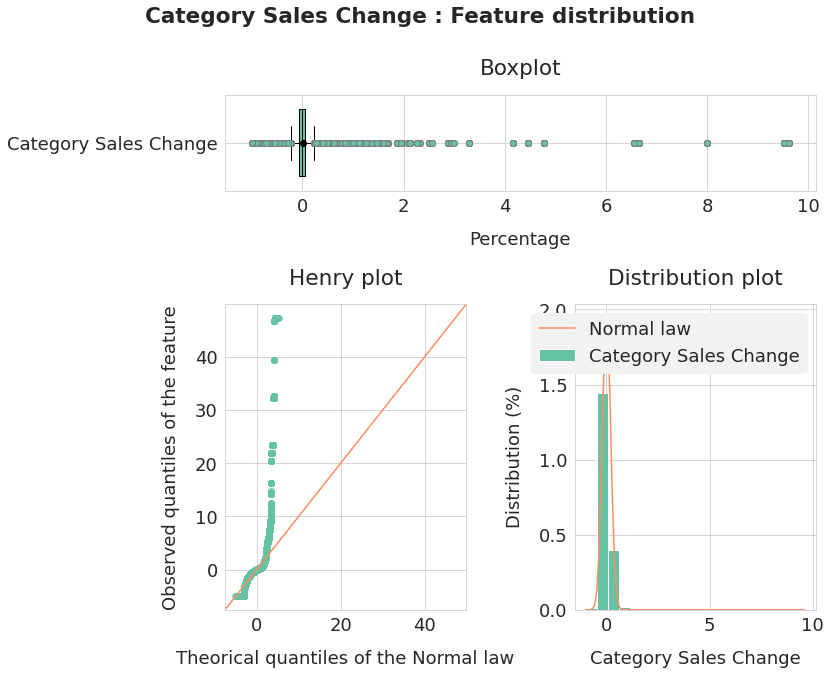

In [295]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [296]:
feature = data[data.month_category_sales_change > -1].\
    month_category_sales_change.clip(-1, 2)
feature_name = "Category Sales Change"
feature.describe()

count    9.749952e+06
mean     9.316982e-03
std      1.757509e-01
min     -9.261745e-01
25%     -5.937031e-02
50%     -7.883518e-03
75%      5.549436e-02
max      2.000000e+00
Name: month_category_sales_change, dtype: float64

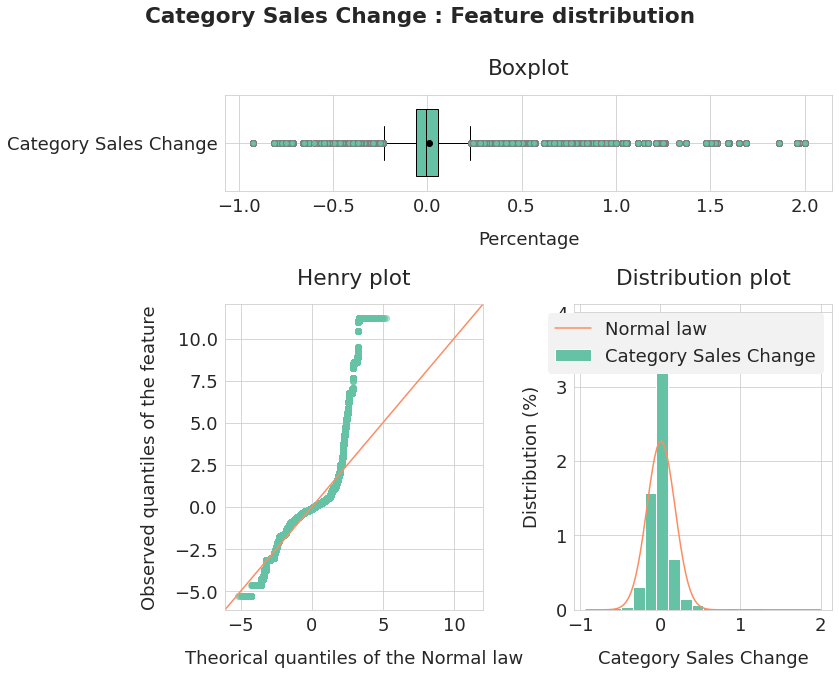

In [297]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [298]:
feature = data.month_category_sales_change.clip(-1, 2)
feature_name = "Category Sales Change"
feature.describe()

count    9.762047e+06
mean     8.133968e-03
std      1.789468e-01
min     -1.000000e+00
25%     -6.021832e-02
50%     -7.883518e-03
75%      5.549436e-02
max      2.000000e+00
Name: month_category_sales_change, dtype: float64

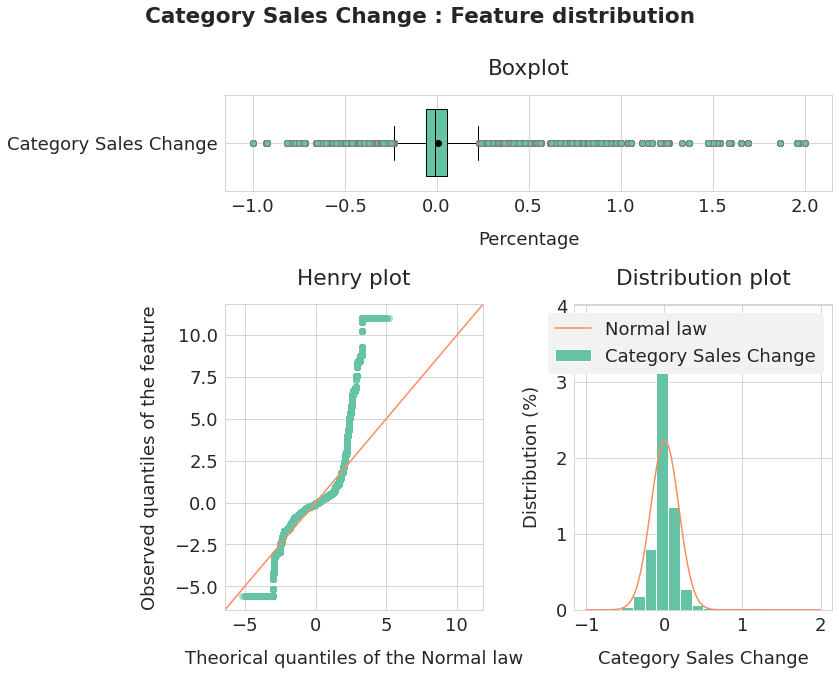

In [299]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [300]:
feature = data.month_category_relative_sales
feature_name = "Category Relative Sales"
feature.describe()

count    9.762047e+06
mean    -4.006747e-02
std      1.766625e-01
min     -1.000000e+00
25%     -1.148043e-01
50%     -3.610696e-02
75%      2.427100e-02
max      1.059883e+01
Name: month_category_relative_sales, dtype: float64

In [301]:
test_normality(feature, feature_name)

Category Relative Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


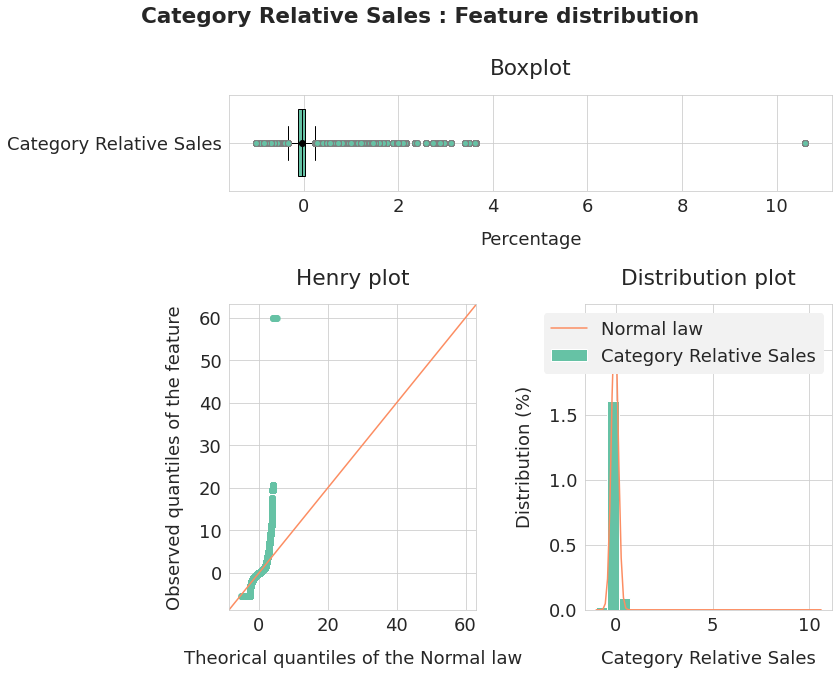

In [302]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [303]:
feature = data[data.month_category_relative_sales > -1].\
    month_category_relative_sales.clip(-1, 2)
feature_name = "Category Relative Sales"
feature.describe()

count    9.709475e+06
mean    -3.509827e-02
std      1.568664e-01
min     -9.297965e-01
25%     -1.148043e-01
50%     -3.610696e-02
75%      2.427100e-02
max      2.000000e+00
Name: month_category_relative_sales, dtype: float64

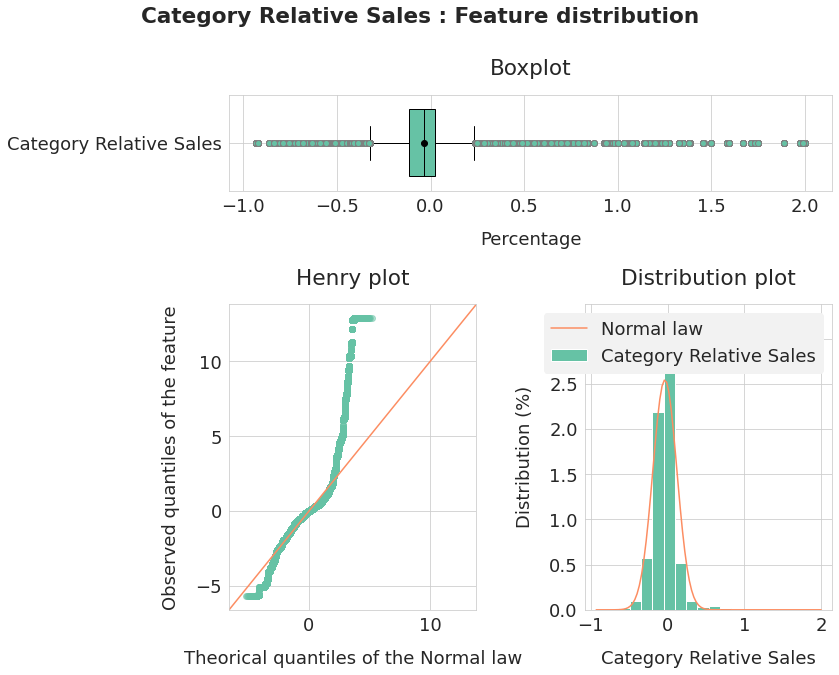

In [304]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [305]:
feature = data.month_category_relative_sales.clip(-1, 2)
feature_name = "Category Relative Sales"
feature.describe()

count    9.762047e+06
mean    -4.024382e-02
std      1.718221e-01
min     -1.000000e+00
25%     -1.148043e-01
50%     -3.610696e-02
75%      2.427100e-02
max      2.000000e+00
Name: month_category_relative_sales, dtype: float64

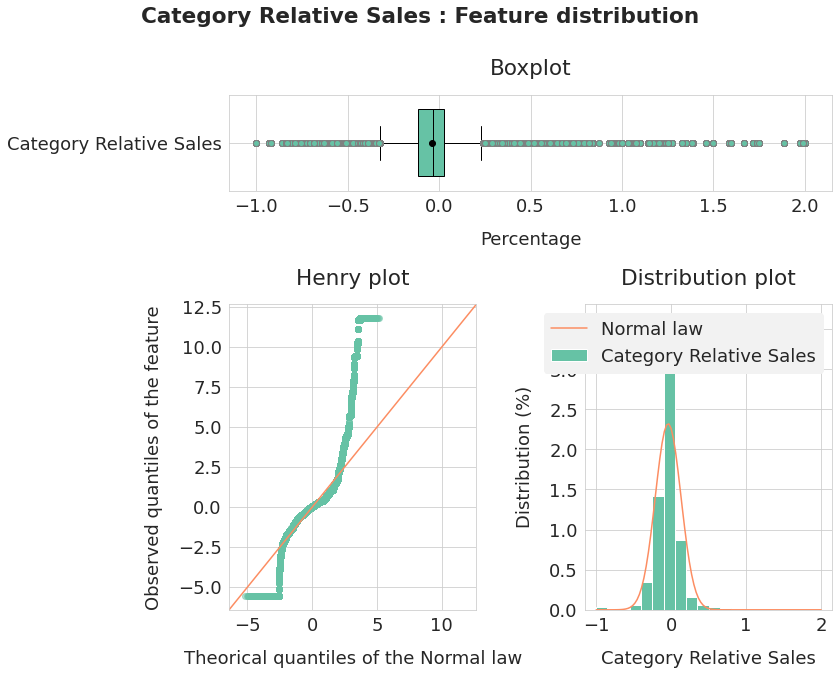

In [306]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

## 2.6. Main Category Data

In [307]:
feature = data.month_maincategory_sales
feature_name = "Main Category Sales"
feature.describe()

count    9.762047e+06
mean     2.105073e+00
std      1.258069e+00
min      0.000000e+00
25%      1.553988e+00
50%      1.769693e+00
75%      2.340464e+00
max      8.275714e+01
Name: month_maincategory_sales, dtype: float64

In [308]:
test_normality(feature, feature_name)

Main Category Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


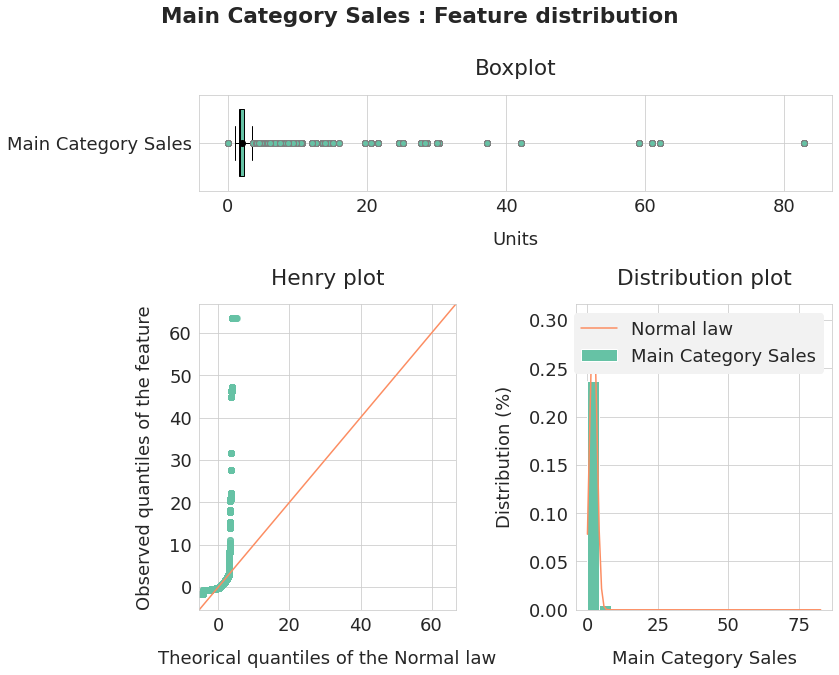

In [309]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [310]:
feature = data.month_maincategory_sales.clip(0, 20)
feature_name = "Main Category Sales"
feature.describe()

count    9.762047e+06
mean     2.093790e+00
std      8.862580e-01
min      0.000000e+00
25%      1.553988e+00
50%      1.769693e+00
75%      2.340464e+00
max      2.000000e+01
Name: month_maincategory_sales, dtype: float64

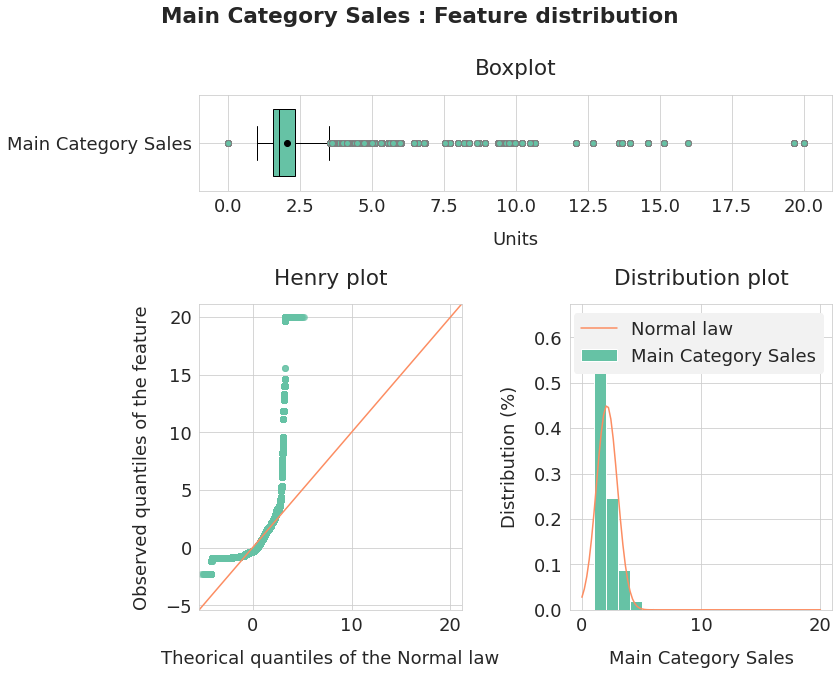

In [311]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [312]:
feature = np.log1p(
    data.month_maincategory_sales.clip(0, 20))
feature_name = "Log of Main Category Sales"
feature.describe()

count    9.762047e+06
mean     1.086641e+00
std      2.215224e-01
min      0.000000e+00
25%      9.376559e-01
50%      1.018736e+00
75%      1.206110e+00
max      3.044523e+00
Name: month_maincategory_sales, dtype: float64

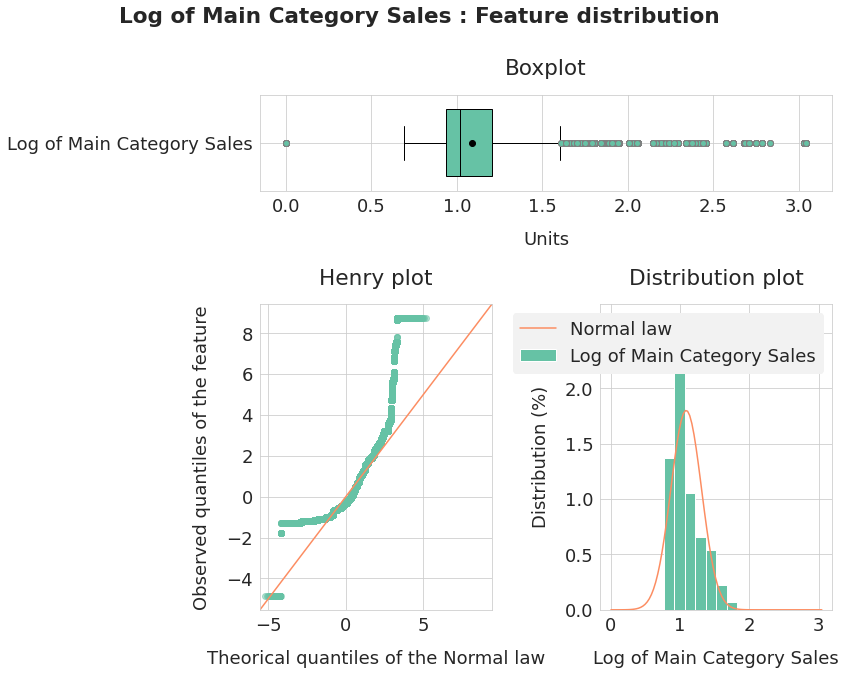

In [313]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [314]:
feature = data.month_maincategory_sales_change
feature_name = "Main Category Sales Change"
feature.describe()

count    9.762047e+06
mean     5.688289e-03
std      1.331310e-01
min     -1.000000e+00
25%     -5.256542e-02
50%      4.138597e-03
75%      5.160090e-02
max      4.459672e+00
Name: month_maincategory_sales_change, dtype: float64

In [315]:
test_normality(feature, feature_name)

Main Category Sales Change - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


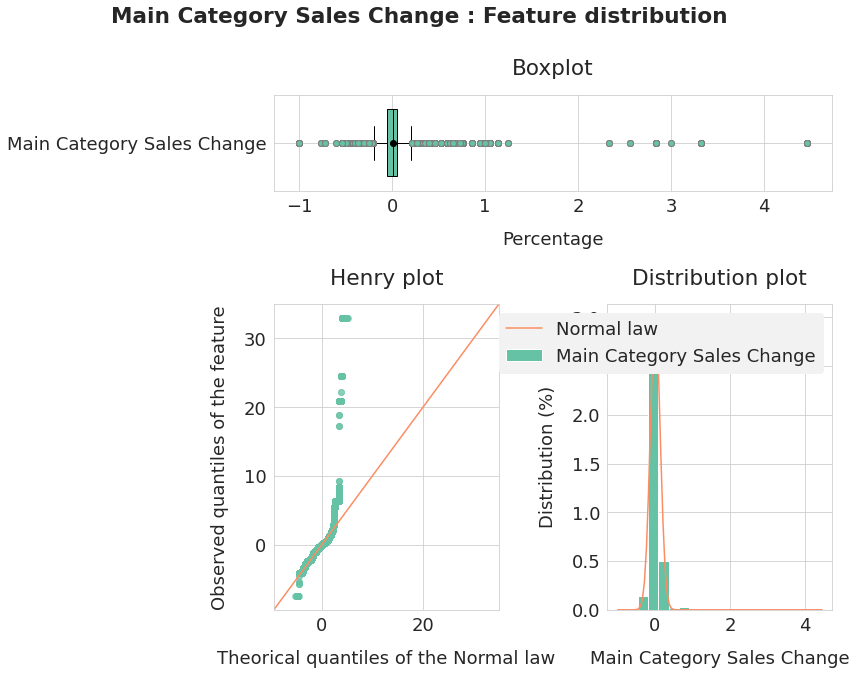

In [316]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [317]:
feature = data.month_maincategory_sales_change.clip(-1, 2)
feature_name = "Main Category Sales Change"
feature.describe()

count    9.762047e+06
mean     5.375200e-03
std      1.266182e-01
min     -1.000000e+00
25%     -5.256542e-02
50%      4.138597e-03
75%      5.160090e-02
max      2.000000e+00
Name: month_maincategory_sales_change, dtype: float64

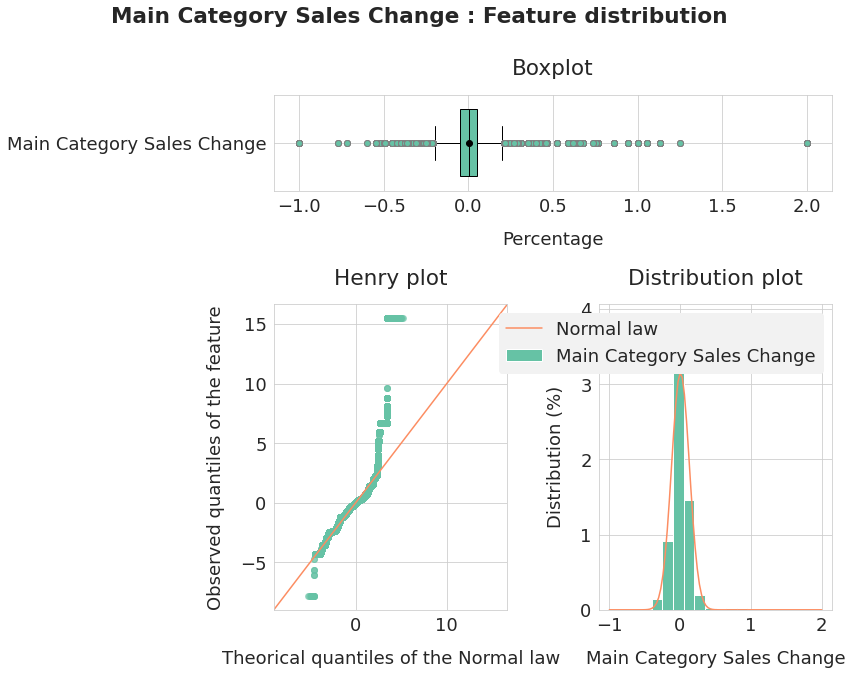

In [318]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [319]:
feature = data.month_maincategory_relative_sales
feature_name = "Main Category Relative Sales"
feature.describe()

count    9.762047e+06
mean    -1.961539e-02
std      1.384978e-01
min     -1.000000e+00
25%     -8.068140e-02
50%     -3.577992e-02
75%      3.701093e-02
max      2.744142e+00
Name: month_maincategory_relative_sales, dtype: float64

In [320]:
test_normality(feature, feature_name)

Main Category Relative Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


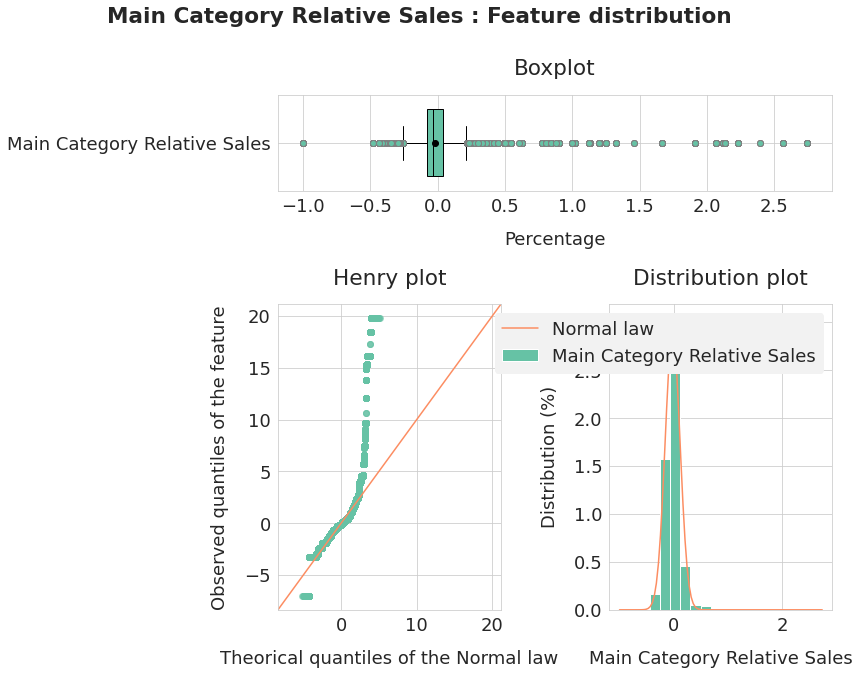

In [321]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [322]:
feature = data.month_maincategory_relative_sales.clip(-1, 2)
feature_name = "Main Category Relative Sales"
feature.describe()

count    9.762047e+06
mean    -1.973389e-02
std      1.367399e-01
min     -1.000000e+00
25%     -8.068140e-02
50%     -3.577992e-02
75%      3.701093e-02
max      2.000000e+00
Name: month_maincategory_relative_sales, dtype: float64

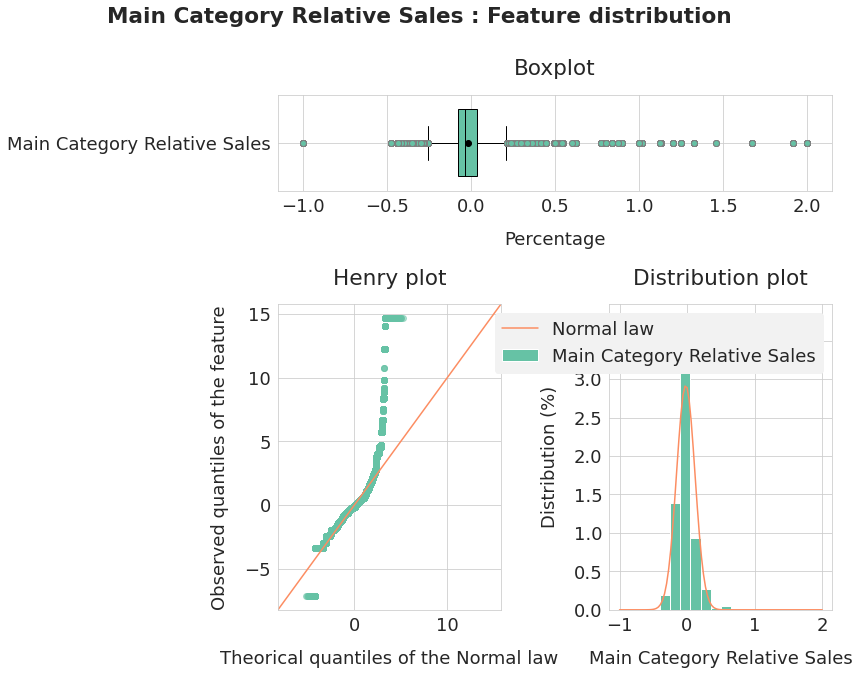

In [323]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

## 2.7. Shop/Category Data

In [324]:
feature = data.month_shopcategory_sales
feature_name = "Shop/Category Sales"
feature.describe()

count    9.762047e+06
mean     1.616757e+00
std      3.484380e+00
min      0.000000e+00
25%      1.183333e+00
50%      1.410256e+00
75%      1.888889e+00
max      1.305000e+03
Name: month_shopcategory_sales, dtype: float64

In [325]:
test_normality(feature, feature_name)

Shop/Category Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


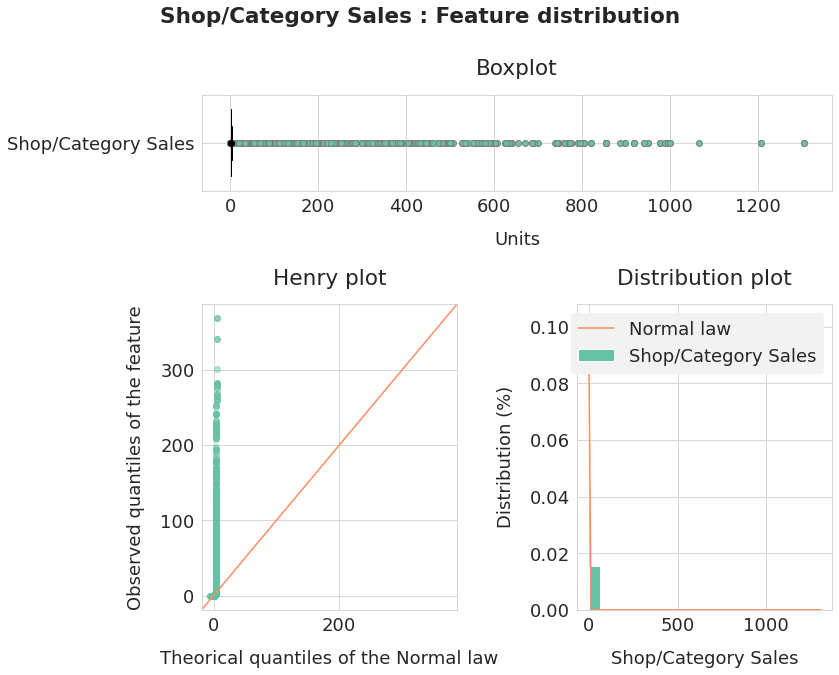

In [326]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [327]:
feature = data.month_shopcategory_sales.clip(0, 20)
feature_name = "Shop/Category Sales"
feature.describe()

count    9.762047e+06
mean     1.587705e+00
std      1.146584e+00
min      0.000000e+00
25%      1.183333e+00
50%      1.410256e+00
75%      1.888889e+00
max      2.000000e+01
Name: month_shopcategory_sales, dtype: float64

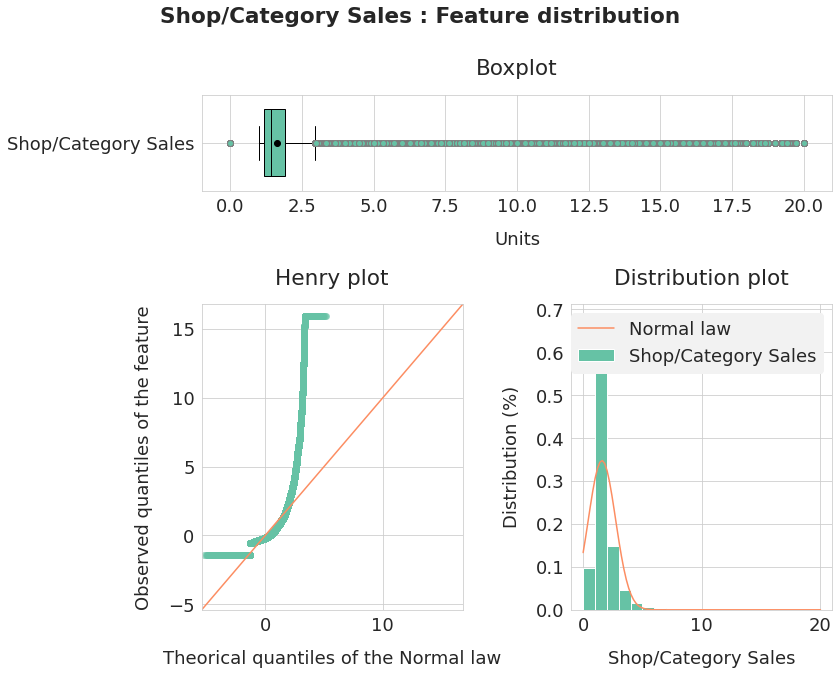

In [328]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [329]:
feature = np.log1p(
    data.month_shopcategory_sales.clip(0, 20))
feature_name = "Log of Shop/Category Sales"
feature.describe()

count    9.762047e+06
mean     9.161798e-01
std      3.841344e-01
min      0.000000e+00
25%      7.808527e-01
50%      8.797331e-01
75%      1.060872e+00
max      3.044523e+00
Name: month_shopcategory_sales, dtype: float64

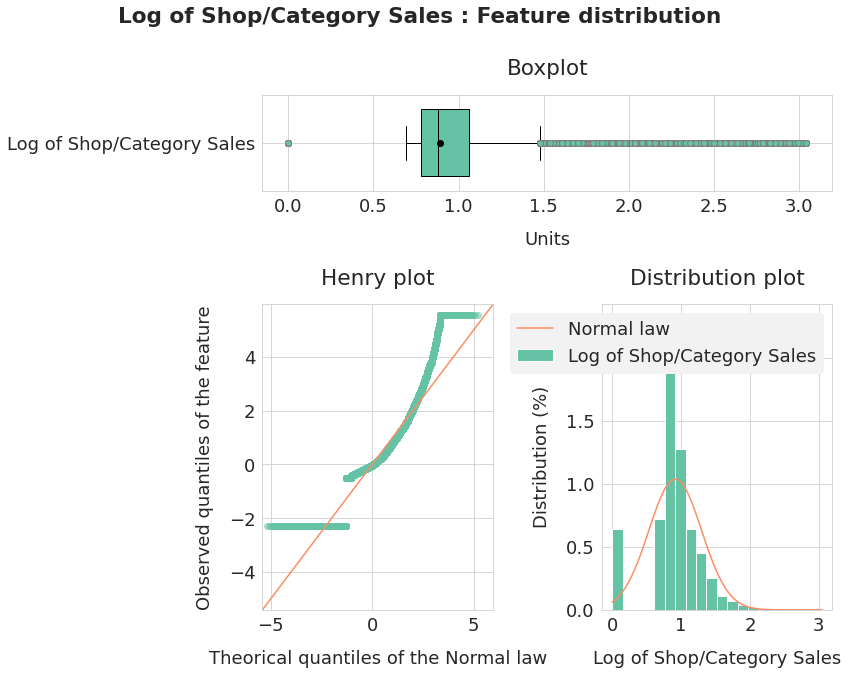

In [330]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [331]:
feature = data.month_shopcategory_sales_change
feature_name = "Shop/Category Sales Change"
feature.describe()

count    9.762047e+06
mean     1.032009e-02
std      3.567662e-01
min     -1.000000e+00
25%     -8.877476e-02
50%      0.000000e+00
75%      7.799672e-02
max      1.000000e+02
Name: month_shopcategory_sales_change, dtype: float64

In [332]:
test_normality(feature, feature_name)

Shop/Category Sales Change - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


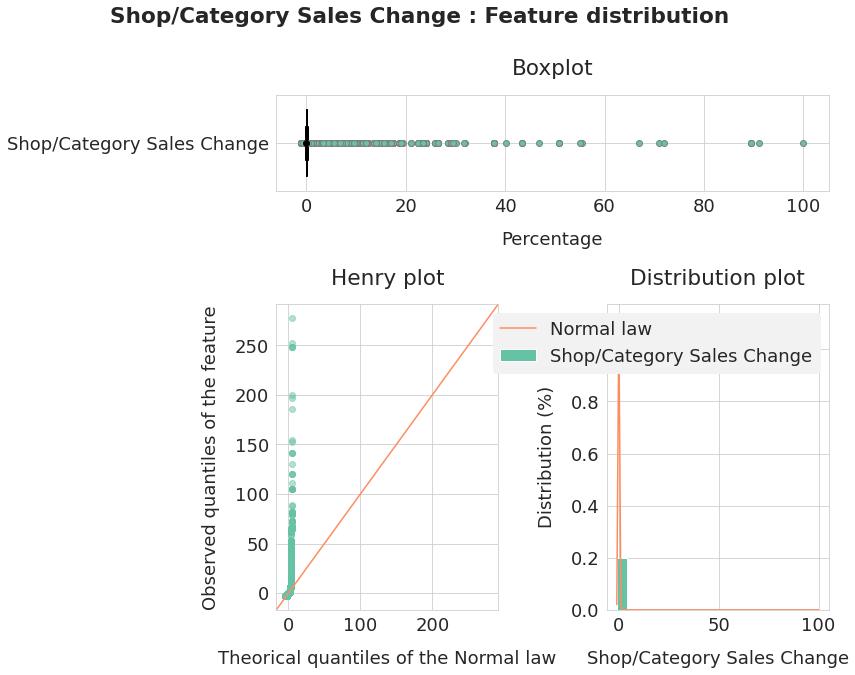

In [333]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [334]:
feature = data.month_shopcategory_sales_change.clip(-1, 2)
feature_name = "Shop/Category Sales Change"
feature.describe()

count    9.762047e+06
mean     6.502709e-03
std      2.750996e-01
min     -1.000000e+00
25%     -8.877476e-02
50%      0.000000e+00
75%      7.799672e-02
max      2.000000e+00
Name: month_shopcategory_sales_change, dtype: float64

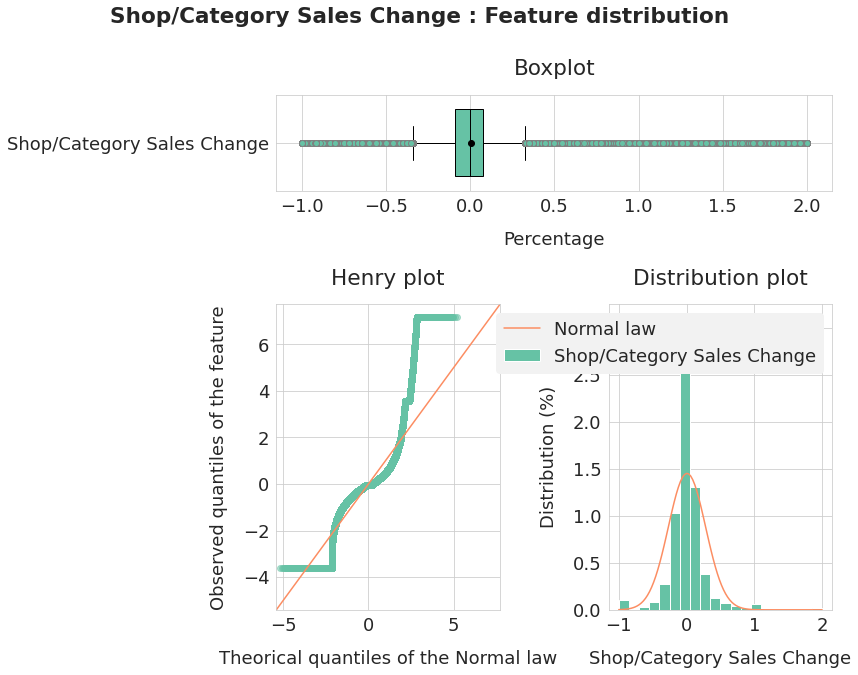

In [335]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [336]:
feature = data.month_shopcategory_relative_sales
feature_name = "Shop Category Relative Sales"
feature.describe()

count    9.762047e+06
mean    -1.165301e-01
std      3.795486e-01
min     -1.000000e+00
25%     -1.692839e-01
50%     -5.282685e-02
75%      3.725598e-02
max      1.796208e+01
Name: month_shopcategory_relative_sales, dtype: float64

In [337]:
test_normality(feature, feature_name)

Shop Category Relative Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


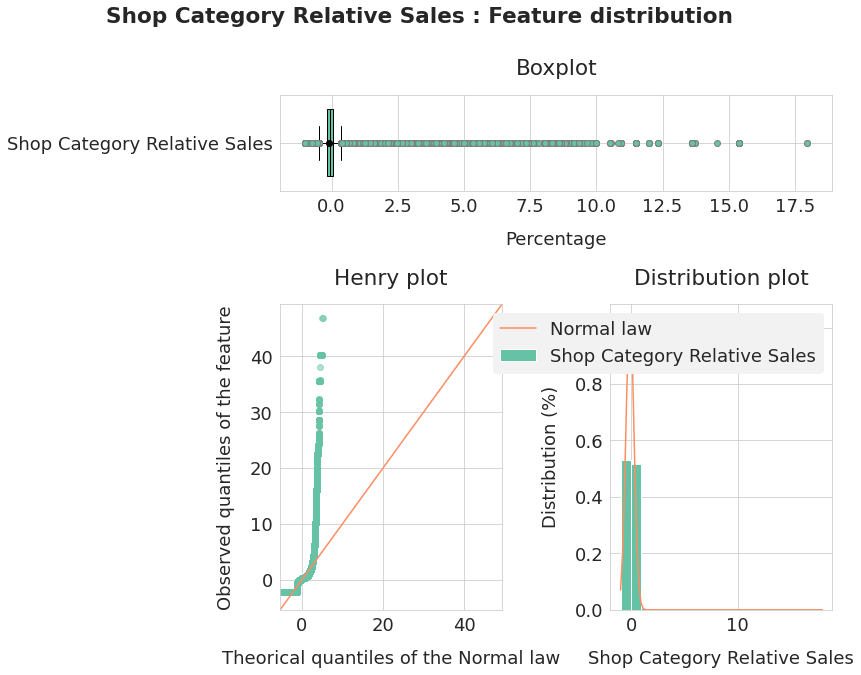

In [338]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [339]:
feature = data.month_shopcategory_relative_sales.clip(-1, 2)
feature_name = "Shop Category Relative Sales"
feature.describe()

count    9.762047e+06
mean    -1.188922e-01
std      3.530862e-01
min     -1.000000e+00
25%     -1.692839e-01
50%     -5.282685e-02
75%      3.725598e-02
max      2.000000e+00
Name: month_shopcategory_relative_sales, dtype: float64

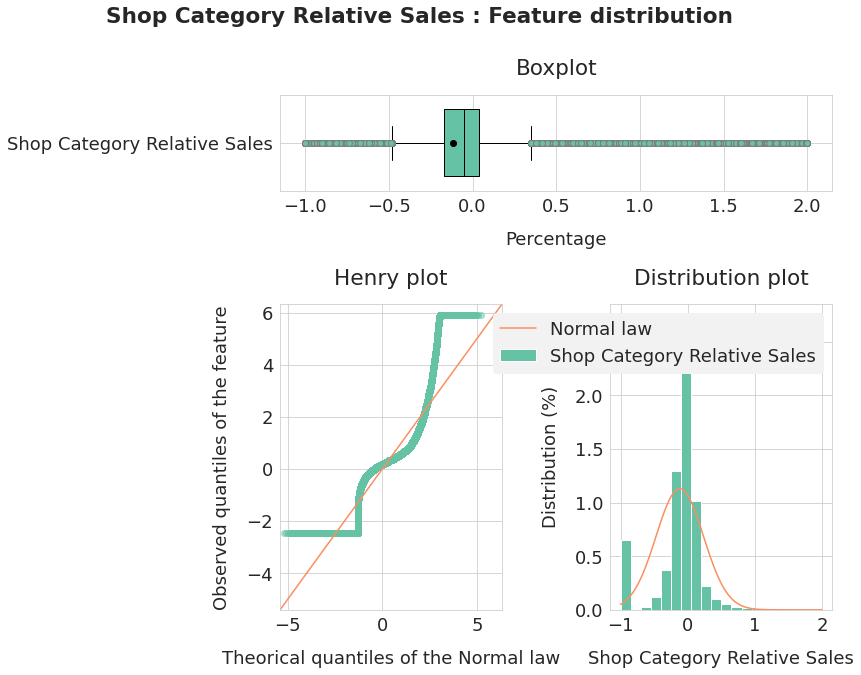

In [340]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

## 2.8. Shop/Main Category Data

In [341]:
feature = data.month_shopmaincategory_sales
feature_name = "Shop/Main Category Sales"
feature.describe()

count    9.762047e+06
mean     1.793586e+00
std      1.795389e+00
min      0.000000e+00
25%      1.265152e+00
50%      1.538153e+00
75%      2.218391e+00
max      8.548333e+02
Name: month_shopmaincategory_sales, dtype: float64

In [342]:
test_normality(feature, feature_name)

Shop/Main Category Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


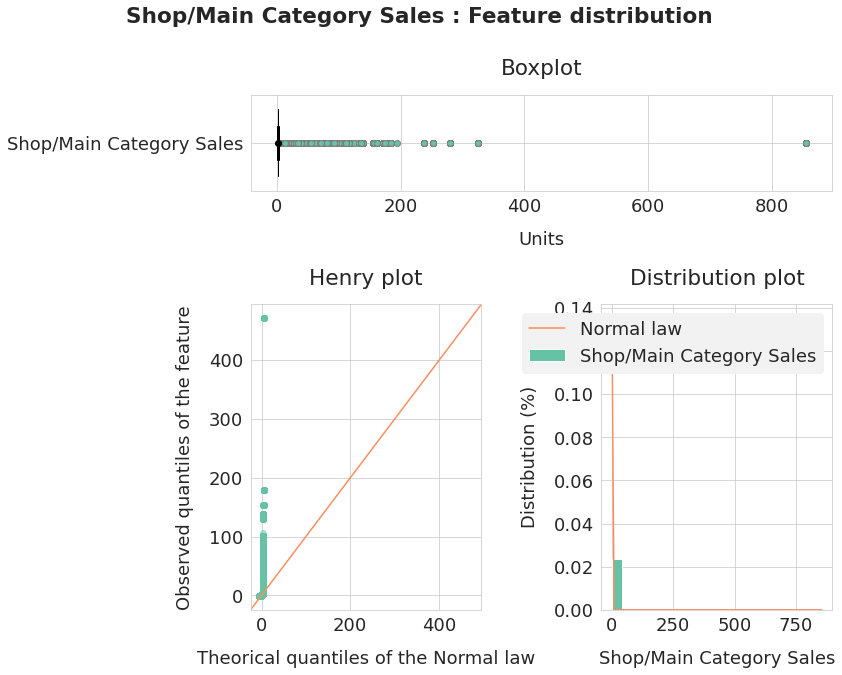

In [343]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [344]:
feature = data.month_shopmaincategory_sales.clip(0, 20)
feature_name = "Shop/Main Category Sales"
feature.describe()

count    9.762047e+06
mean     1.780676e+00
std      1.104083e+00
min      0.000000e+00
25%      1.265152e+00
50%      1.538153e+00
75%      2.218391e+00
max      2.000000e+01
Name: month_shopmaincategory_sales, dtype: float64

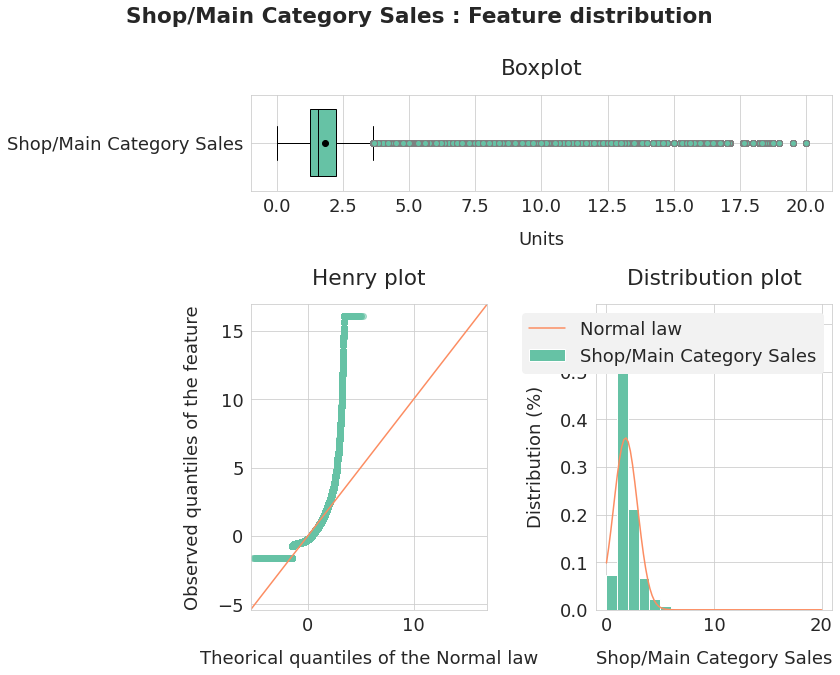

In [345]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [346]:
feature = np.log1p(
    data.month_shopmaincategory_sales.clip(0, 20))
feature_name = "Log of Shop/Main Category Sales"
feature.describe()

count    9.762047e+06
mean     9.903892e-01
std      3.717911e-01
min      0.000000e+00
25%      8.176416e-01
50%      9.314365e-01
75%      1.168881e+00
max      3.044523e+00
Name: month_shopmaincategory_sales, dtype: float64

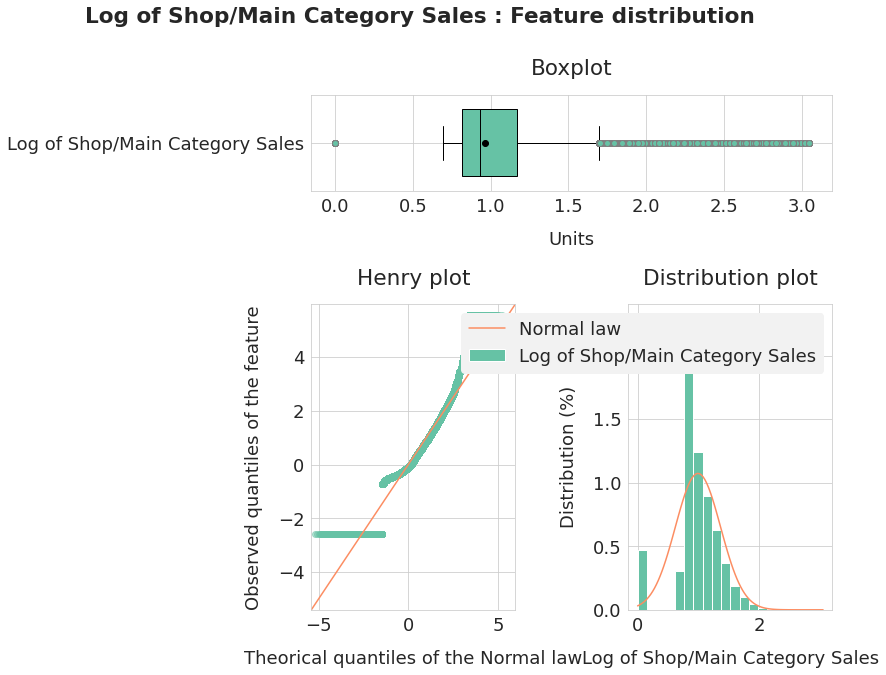

In [347]:
graph_quant_feature(feature, feature_name,
                    "Units")

In [348]:
feature = data.month_shopmaincategory_sales_change
feature_name = "Shop/Main Category Sales Change"
feature.describe()

count    9.762047e+06
mean     4.717302e-03
std      2.882217e-01
min     -1.000000e+00
25%     -7.849160e-02
50%      0.000000e+00
75%      6.909587e-02
max      2.900000e+01
Name: month_shopmaincategory_sales_change, dtype: float64

In [349]:
test_normality(feature, feature_name)

Shop/Main Category Sales Change - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


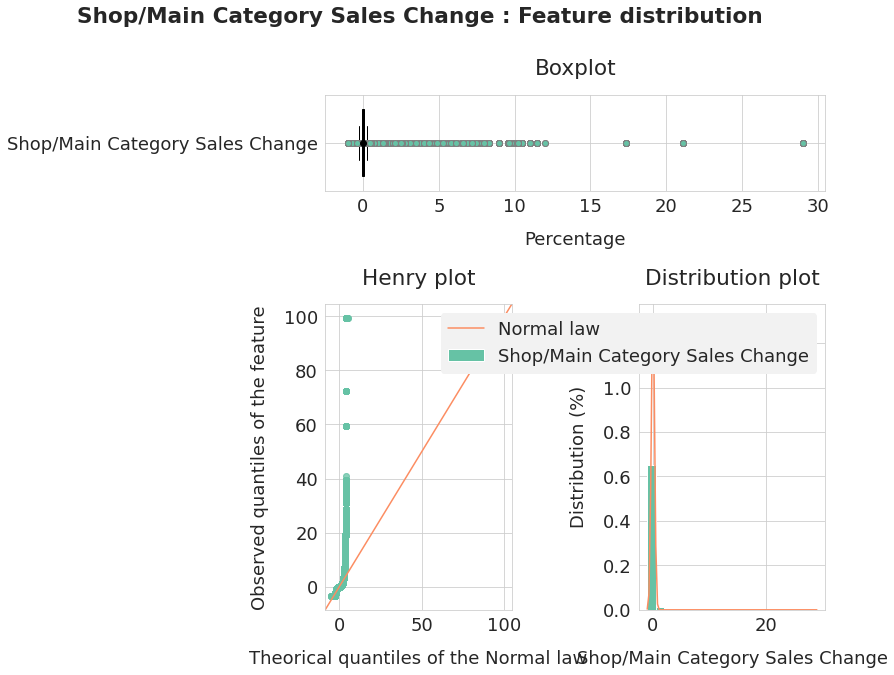

In [350]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [351]:
feature = data.month_shopmaincategory_sales_change.clip(-1, 2)
feature_name = "Shop/Main Category Sales Change"
feature.describe()

count    9.762047e+06
mean     2.558243e-03
std      2.127686e-01
min     -1.000000e+00
25%     -7.849160e-02
50%      0.000000e+00
75%      6.909587e-02
max      2.000000e+00
Name: month_shopmaincategory_sales_change, dtype: float64

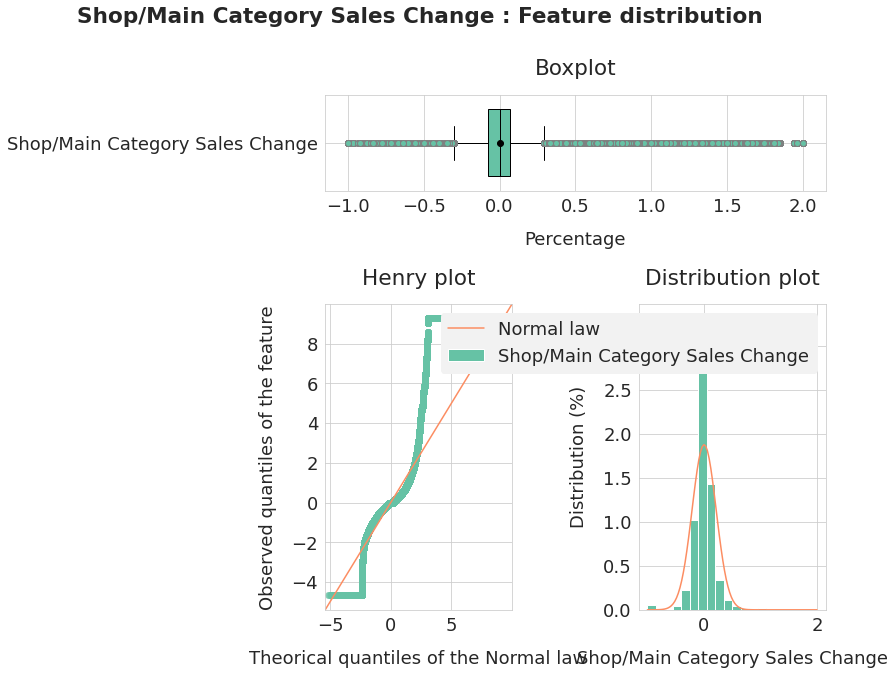

In [352]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [353]:
feature = data.month_shopmaincategory_relative_sales
feature_name = "Shop/Main Category Relative Sales"
feature.describe()

count    9.762047e+06
mean    -8.443488e-02
std      3.406653e-01
min     -1.000000e+00
25%     -1.282624e-01
50%     -3.907043e-02
75%      4.194275e-02
max      1.375676e+01
Name: month_shopmaincategory_relative_sales, dtype: float64

In [354]:
test_normality(feature, feature_name)

Shop/Main Category Relative Sales - Normality Test - Risk level = 5%
    H0 : Feature distribution is normal
    H1 : Feature distribution is not normal
          Kolmogorov-Smirnov Jarque-Bera Anderson-Darling
p_value                    0           0                0
Accept H0              False       False            False


/opt/conda/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:70: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


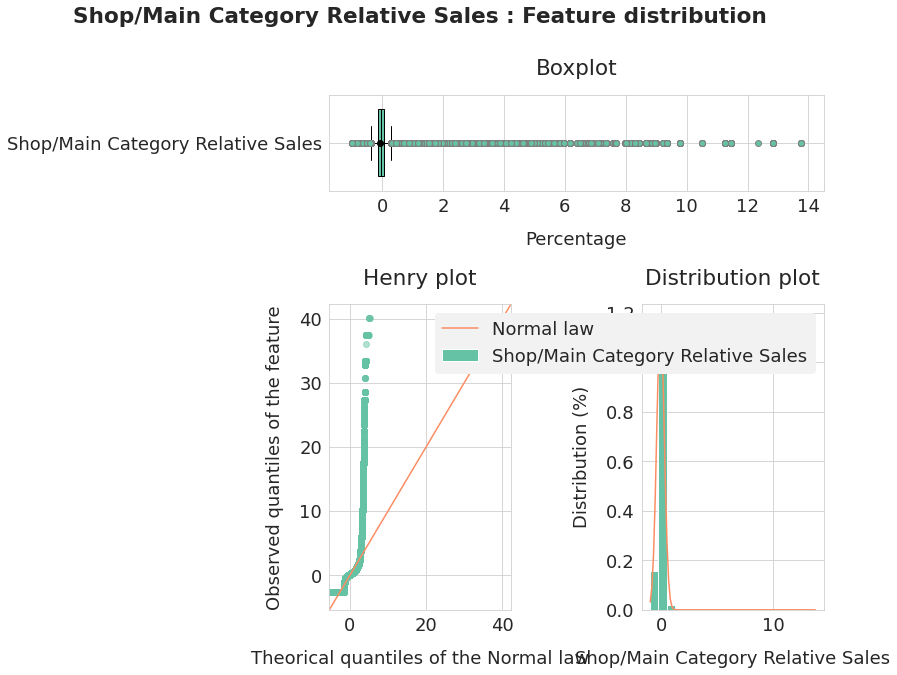

In [355]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

In [356]:
feature = data.month_shopmaincategory_relative_sales.clip(-1, 2)
feature_name = "Shop/Main Category Relative Sales"
feature.describe()

count    9.762047e+06
mean    -8.675220e-02
std      3.091613e-01
min     -1.000000e+00
25%     -1.282624e-01
50%     -3.907043e-02
75%      4.194275e-02
max      2.000000e+00
Name: month_shopmaincategory_relative_sales, dtype: float64

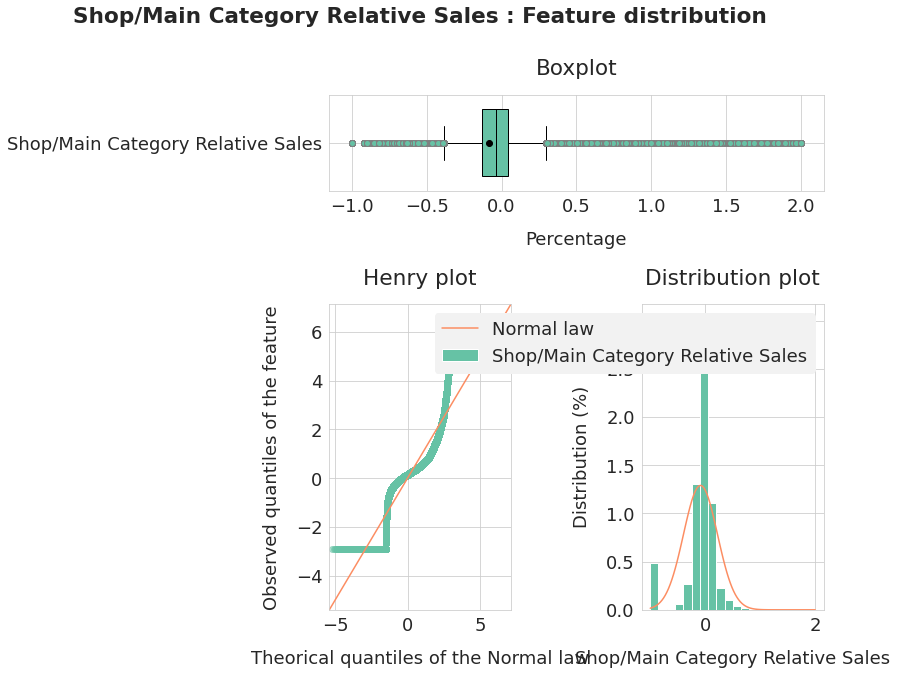

In [357]:
graph_quant_feature(feature, feature_name,
                    "Percentage")

## 2.9. Suggestion of treatment for the quantitative features

There are a lot of outliers in the high values, as we've seen during the analysis.  
Changes or relative features can't be under -100%. On the upside, they sometimes reach really high values. An increase value of 200% is allready a big increase, as well as a relative value of 200% in comparison to its mean is allready a large value. I decide to ceil them all to 200% as the predictions are ceiled at 20 units. This is like grouping all large outliers values in the same value of +200%.  
I am open to discuss the logic of this decision in the comments.

In [358]:
data.drop(columns=["item_name", "month_shopitem_revenue",
                   "month_shopitem_hassales"], inplace=True)

In [359]:
data["item_cnt_month_change"] = data.item_cnt_month_change.clip(-1, 2)
data["month_shopitem_price"] = np.log(data.month_shopitem_price)
data["month_shopitem_price_change"] = np.cbrt(data.month_shopitem_price_change.clip(-1, 2))

data["month_shopitem_relative_sales"] = data.month_shopitem_relative_sales.clip(-1, 2)
data["month_shopitem_relative_price"] = data.month_shopitem_relative_price.clip(-1, 2)
data["month_shopitem_compared_sales"] = data.month_shopitem_compared_sales.clip(-1, 2)
data["month_shopitem_compared_price"] = data.month_shopitem_compared_price.clip(-1, 2)

data["month_global_sumsales"] = data.month_global_sumsales
data["month_global_revenue"] = np.log(data.month_global_revenue)
data["month_global_sumsales_change"] = data.month_global_sumsales_change
data["month_global_revenue_change"] = data.month_global_revenue_change
data["month_global_relative_sumsales"] = data.month_global_relative_sumsales
data["month_global_relative_revenue"] = np.log1p(data.month_global_relative_revenue)

data["month_item_price"] = np.log(data.month_item_price)
data["month_item_sales"] = np.log1p(data.month_item_sales.clip(0, 20))
data["month_item_price_change"] = data.month_item_price_change.clip(-1, 2)
data["month_item_sales_change"] = data.month_item_sales_change.clip(-1, 2)
data["month_item_relative_price"] = data.month_item_relative_price.clip(-1, 2)
data["month_item_relative_sales"] = data.month_item_relative_sales.clip(-1, 2)

data["month_shop_sumsales"] = data.month_shop_sumsales
data["month_shop_revenue"] = data.month_shop_revenue
data["month_shop_sumsales_change"] = data.month_shop_sumsales_change.clip(-1, 2)
data["month_shop_revenue_change"] = data.month_shop_revenue_change.clip(-1, 2)
data["month_shop_relative_sumsales"] = data.month_shop_relative_sumsales.clip(-1, 2)
data["month_shop_relative_revenue"] = data.month_shop_relative_revenue.clip(-1, 2)

data["month_category_sales"] = np.log1p(data.month_category_sales.clip(0, 20))
data["month_category_sales_change"] = data.month_category_sales_change.clip(-1, 2)
data["month_category_relative_sales"] = data.month_category_relative_sales.clip(-1, 2)

data["month_maincategory_sales"] = np.log1p(data.month_maincategory_sales.clip(0, 20))
data["month_maincategory_sales_change"] = data.month_maincategory_sales_change.clip(-1, 2)
data["month_maincategory_relative_sales"] = data.month_maincategory_relative_sales.clip(-1, 2)

data["month_shopcategory_sales"] = np.log1p(data.month_shopcategory_sales.clip(0, 20))
data["month_shopcategory_sales_change"] = data.month_shopcategory_sales_change.clip(-1, 2)
data["month_shopcategory_relative_sales"] = data.month_shopcategory_relative_sales.clip(-1, 2)

data["month_shopmaincategory_sales"] = np.log1p(data.month_shopmaincategory_sales.clip(0, 20))
data["month_shopmaincategory_sales_change"] = data.month_shopmaincategory_sales_change.clip(-1, 2)
data["month_shopmaincategory_relative_sales"] = data.month_shopmaincategory_relative_sales.clip(-1, 2)

Last conclusion : category-based data seem a better option than main-category-based data, from the distribution point of view.